# Chicago Crime Data Analysis - Group H ITEC- 657

We are approaching the problem with CRISP-DM methodology. The key aspects of data analysis are illustrated below:

<img src="images/crisp-dm.png" style="height:500px">

### Business Understaning:

*  Our business problem would be to find the underlying relations in data which might reveal some interesting insights regarding crime patterns and help us forecast some noteworthy results.

*  Intended Users of this business model:  Chicago Police Department 

*  To identify the most frequent modes of crime. 

*  To understand the role of Geography on a potential crime.

* Building scalable models to precisely predict the frequency of impending crimes.

### Data Understanding:

### Description

ID - Unique identifier for the record.

Case Number - The Chicago Police Department RD Number (Records Division Number), which is unique to the incident.

Date - Date when the incident occurred. this is sometimes a best estimate.

Block - The partially redacted address where the incident occurred, placing it on the same block as the actual address.

IUCR - The Illinois Unifrom Crime Reporting code. This is directly linked to the Primary Type and Description. See the list of IUCR codes at https://data.cityofchicago.org/d/c7ck-438e.

Primary Type - The primary description of the IUCR code.

Description - The secondary description of the IUCR code, a subcategory of the primary description.

Location Description - Description of the location where the incident occurred.

Arrest - Indicates whether an arrest was made.

Domestic - Indicates whether the incident was domestic-related as defined by the Illinois Domestic Violence Act.

Beat - Indicates the beat where the incident occurred. A beat is the smallest police geographic area – each beat has a dedicated police beat car. Three to five beats make up a police sector, and three sectors make up a police district. The Chicago Police Department has 22 police districts. See the beats at https://data.cityofchicago.org/d/aerh-rz74.

District - Indicates the police district where the incident occurred. See the districts at https://data.cityofchicago.org/d/fthy-xz3r.

Ward - The ward (City Council district) where the incident occurred. See the wards at https://data.cityofchicago.org/d/sp34-6z76.

Community Area - Indicates the community area where the incident occurred. Chicago has 77 community areas. See the community areas at https://data.cityofchicago.org/d/cauq-8yn6.

FBI Code - Indicates the crime classification as outlined in the FBI's National Incident-Based Reporting System (NIBRS). See the Chicago Police Department listing of these classifications at http://gis.chicagopolice.org/clearmap_crime_sums/crime_types.html.

X Coordinate - The x coordinate of the location where the incident occurred in State Plane Illinois East NAD 1983 projection. This location is shifted from the actual location for partial redaction but falls on the same block.

Y Coordinate - The y coordinate of the location where the incident occurred in State Plane Illinois East NAD 1983 projection. This location is shifted from the actual location for partial redaction but falls on the same block.

Year - Year the incident occurred.

Updated On - Date and time the record was last updated.

Latitude - The latitude of the location where the incident occurred. This location is shifted from the actual location for partial redaction but falls on the same block.

Longitude - The longitude of the location where the incident occurred. This location is shifted from the actual location for partial redaction but falls on the same block.

Location - The location where the incident occurred in a format that allows for creation of maps and other geographic operations on this data portal. This location is shifted from the actual location for partial redaction but falls on the same block.

## Data Preparation:

### Importing libraries

In [116]:
%%capture
%load_ext autoreload
%autoreload 2

import sys
import warnings
warnings.filterwarnings(action = 'once')
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import folium
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score
sys.path.append("used_functions")
import custom_functions

plt.style.use('ggplot')
## Change title size of a plot
mpl.rcParams['axes.titlesize'] = 22
# Figure size
mpl.rc("figure", figsize = (15,7))
## Change label size(x and y) of a plot
mpl.rcParams['axes.labelsize'] = 18
## Change xticks size of a plot
mpl.rcParams['xtick.labelsize'] = 16
## Change yticks size of a plot
mpl.rcParams['ytick.labelsize'] = 16

In [2]:
#CSS Styling for better view of the notebook

from IPython.core.display import HTML
HTML("""
<style>

div.cell { /* Tunes the space between cells */
margin-top:1em;
margin-bottom:1em;
}

div.text_cell_render h1 { /* Main titles bigger, centered */
font-size: 2.2em;
line-height:1.4em;
text-align:center;
}

div.text_cell_render h2 { /*  Parts names nearer from text */
margin-bottom: -0.4em;
}


div.text_cell_render { /* Customize text cells */
font-family: 'Times New Roman';
font-style:italic;
font-size:1.4em;
line-height:1.4em;
padding-left:0em;
padding-right:0em;
}
</style>
""")

### 1. Data Operations

### 1.0 Loading the data

In [3]:
# Here present means 2019
crimes2001ToPresent = pd.read_csv("Crimes_-_2001_to_present.csv")

### 1.1 Filter data(Taking Subset)

In [4]:
# Converting the Date column from string to datetime
crimes2001ToPresent.Date = pd.to_datetime(crimes2001ToPresent.Date)

# Filtering out the data after year 2010
crime2010To2019 = crimes2001ToPresent[crimes2001ToPresent["Date"].dt.year >= 2010]

### Saving the data for reproducibility

In [5]:
crime2010To2019.to_csv("crimes2010To2019.csv", header = True, index = False)

### 1.2 Exploring data

### 1.2.0 Description of the columns

In [6]:
crime2010To2019_df = pd.read_csv("crimes2010To2019.csv")

In [7]:
crime2010To2019_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Longitude,Location,Historical Wards 2003-2015,Zip Codes,Community Areas,Census Tracts,Wards,Boundaries - ZIP Codes,Police Districts,Police Beats
0,11816723,JC419235,2019-09-03 23:55:00,049XX W GLADYS AVE,0460,BATTERY,SIMPLE,STREET,False,False,...,-87.747792,"(41.87584542, -87.747791664)",36.0,"22,216",26.0,69.0,7.0,32.0,25.0,137.0
1,11816690,JC419238,2019-09-03 23:55:00,014XX E 53RD ST,0910,MOTOR VEHICLE THEFT,AUTOMOBILE,STREET,False,False,...,-87.590040,"(41.799531452, -87.590040481)",1.0,"21,192",8.0,500.0,33.0,10.0,24.0,122.0
2,11816668,JC419239,2019-09-03 23:50:00,026XX N CLARK ST,1310,CRIMINAL DAMAGE,TO PROPERTY,RESTAURANT,False,False,...,-87.643754,"(41.930459856, -87.643753566)",51.0,"21,190",68.0,794.0,34.0,16.0,5.0,178.0
3,11816749,JC419243,2019-09-03 23:50:00,049XX W GLADYS AVE,0560,ASSAULT,SIMPLE,ALLEY,False,False,...,-87.747792,"(41.87584542, -87.747791664)",36.0,"22,216",26.0,69.0,7.0,32.0,25.0,137.0
4,11816612,JC419230,2019-09-03 23:50:00,014XX W ROOSEVELT RD,0460,BATTERY,SIMPLE,STREET,False,False,...,-87.662181,"(41.866908256, -87.662180514)",48.0,"14,920",29.0,758.0,23.0,44.0,15.0,136.0


In [8]:
crime2010To2019_df.columns

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location', 'Historical Wards 2003-2015', 'Zip Codes',
       'Community Areas', 'Census Tracts', 'Wards', 'Boundaries - ZIP Codes',
       'Police Districts', 'Police Beats'],
      dtype='object')

## 1.3 Data Preprocessing and Cleaning

#### Checking the dataframe for the missing values

In [9]:
crime2010To2019_df.info(null_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2884621 entries, 0 to 2884620
Data columns (total 30 columns):
ID                            2884621 non-null int64
Case Number                   2884619 non-null object
Date                          2884621 non-null object
Block                         2884621 non-null object
IUCR                          2884621 non-null object
Primary Type                  2884621 non-null object
Description                   2884621 non-null object
Location Description          2879254 non-null object
Arrest                        2884621 non-null bool
Domestic                      2884621 non-null bool
Beat                          2884621 non-null int64
District                      2884620 non-null float64
Ward                          2884563 non-null float64
Community Area                2884222 non-null float64
FBI Code                      2884621 non-null object
X Coordinate                  2864072 non-null float64
Y Coordinate             

Number just after variable name shows how many rows contain non null values. Number of total rows is 2884621, number less than that in the above output shows that there are missing values in the variable.

#### Plotting missing values

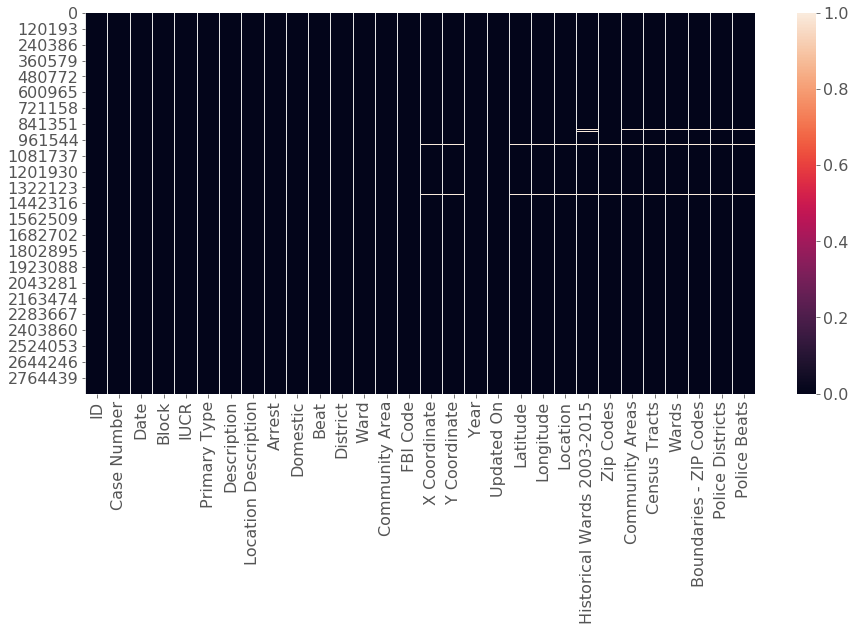

In [10]:
plt.figure(figsize = (15,7))
sns.heatmap(crime2010To2019_df.isna())
plt.show()

White horizontal dashes on the plot shows that there are missing values in the variable. We can see there are many columns which contains the missing values on the same row(752514 and 1003352). Missing values can be seen in the columns regarding the location of the incident as well as the zip codes, Census Tracts, Wards, Police district and beats. 

In [11]:
# Before dropping rows with missing values
print("Shape of the dataframe before dropping rows with missing values : ", crime2010To2019_df.shape)

# Dropping rows with missing values
crime2010To2019_df.dropna(inplace = True)

# After dropping rows with missing values
print("Shape of the dataframe after dropping rows with missing values : ", crime2010To2019_df.shape)

Shape of the dataframe before dropping rows with missing values :  (2884621, 30)
Shape of the dataframe after dropping rows with missing values :  (2848054, 30)


#### Deleting columns

In [12]:
delete_cols = ['FBI Code', 'X Coordinate', 'Y Coordinate', 'Year', 'Updated On', 'Location', 
               'Historical Wards 2003-2015', 'Zip Codes', 'Community Areas', 'Census Tracts', 
               'Wards',  'Boundaries - ZIP Codes', 'Police Districts', 'Police Beats']

# Before dropping columns
print("Shape of the dataframe before dropping columns : ", crime2010To2019_df.shape)

# Dropping columns
crime2010To2019_df.drop(delete_cols, axis = 1, inplace = True)

# After dropping columns
print("Shape of the dataframe after dropping columns : ", crime2010To2019_df.shape)

Shape of the dataframe before dropping columns :  (2848054, 30)
Shape of the dataframe after dropping columns :  (2848054, 16)


#### Date

In [13]:
# Converting date column from string to datetime object
crime2010To2019_df["Date"] = pd.to_datetime(crime2010To2019_df["Date"])

#### ID

In [14]:
# All unique values
print("All unique values? ->", len(set(crime2010To2019_df["ID"])) == len(crime2010To2019_df["ID"]))

# Summary
crime2010To2019_df["ID"].describe()

All unique values? -> True


count    2.848054e+06
mean     9.567629e+06
std      1.386440e+06
min      1.923700e+04
25%      8.415186e+06
50%      9.572782e+06
75%      1.078085e+07
max      1.181905e+07
Name: ID, dtype: float64

#### Case Number

In [15]:
# All unique values
print("All unique values? ->", len(set(crime2010To2019_df["Case Number"])) == len(crime2010To2019_df["Case Number"]))

# Summary
crime2010To2019_df["Case Number"].describe()

All unique values? -> False


count      2848054
unique     2847813
top       HZ140230
freq             6
Name: Case Number, dtype: object

This means case are also reopened again.

#### Date

In [16]:
# Converting Date column from str to datetime object
crime2010To2019_df["Date"] = pd.to_datetime(crime2010To2019_df["Date"])

# Summary
crime2010To2019_df["Date"].describe()

count                 2848054
unique                1149503
top       2012-01-01 00:01:00
freq                      156
first     2010-01-01 00:00:00
last      2019-09-03 23:55:00
Name: Date, dtype: object

#### Block

In [17]:
# Summary
crime2010To2019_df["Block"].describe()

count              2848054
unique               34647
top       001XX N STATE ST
freq                  7328
Name: Block, dtype: object

#### IUCR

In [18]:
# Summary
crime2010To2019_df["IUCR"].describe()

count     2848054
unique        376
top          0486
freq       254082
Name: IUCR, dtype: object

#### Primary type

In [19]:
# Convert to Categorical variable
crime2010To2019_df["Primary Type"] = crime2010To2019_df["Primary Type"].astype("category")

# Summary
print(crime2010To2019_df["Primary Type"].describe())

# Converting it to categorical codes
crime2010To2019_df["Primary_Type_Codes"] = crime2010To2019_df["Primary Type"].cat.codes

count     2848054
unique         33
top         THEFT
freq       641885
Name: Primary Type, dtype: object


#### Description

In [20]:
# Convert to Categorical variable
crime2010To2019_df["Description"] = crime2010To2019_df["Description"].astype("category") 

# Summary
print(crime2010To2019_df["Description"].describe())

# Converting it to categorical codes
crime2010To2019_df["Description_Codes"] = crime2010To2019_df["Description"].cat.codes

count     2848054
unique        352
top        SIMPLE
freq       299248
Name: Description, dtype: object


#### Location description

In [21]:
# Converting to categorical variable
crime2010To2019_df["Location Description"] = crime2010To2019_df["Location Description"].astype("category")

# Summary
crime2010To2019_df["Location Description"].describe()

# Converting it to categorical codes
crime2010To2019_df["Location_Desctiption_Codes"] = crime2010To2019_df["Location Description"].cat.codes

#### Arrest

In [22]:
# Converting to categorical variable
crime2010To2019_df["Arrest"] = crime2010To2019_df["Arrest"].astype("category")

# Summary
print(crime2010To2019_df["Arrest"].describe())

# Converting it to categorical codes 0 = False/1 = True
crime2010To2019_df["Arrest_Codes"] = crime2010To2019_df["Arrest"].cat.codes

count     2848054
unique          2
top         False
freq      2136141
Name: Arrest, dtype: object


#### Domestic

In [23]:
# Converting to categorical variable
crime2010To2019_df["Domestic"] = crime2010To2019_df["Domestic"].astype("category")

# Summary
print(crime2010To2019_df["Domestic"].describe())

# Converting it to categorical codes 0 = False/1 = True
crime2010To2019_df["Domestic_Codes"] = crime2010To2019_df["Domestic"].cat.codes

count     2848054
unique          2
top         False
freq      2414964
Name: Domestic, dtype: object


#### Beat

In [24]:
# Changing type
crime2010To2019_df["Beat"] = crime2010To2019_df["Beat"].astype(int).astype("category")

# Summary
crime2010To2019_df["Beat"].describe()

count     2848054
unique        303
top          1834
freq        23330
Name: Beat, dtype: int64

#### District

In [25]:
# Changing type
crime2010To2019_df["District"] = crime2010To2019_df["District"].astype(int).astype("category")

# Summary
crime2010To2019_df["District"].describe()

count     2848054
unique         23
top            11
freq       194922
Name: District, dtype: int64

#### Ward

In [26]:
# Changing type
crime2010To2019_df["Ward"] = crime2010To2019_df["Ward"].astype(int).astype("category")

# Summary
crime2010To2019_df["Ward"].describe()

count     2848054
unique         50
top            42
freq       138694
Name: Ward, dtype: int64

#### Community Area

In [27]:
# Changing type
crime2010To2019_df["Community Area"] = crime2010To2019_df["Community Area"].astype(int).astype("category")

# Summary
crime2010To2019_df["Community Area"].describe()

count     2848054
unique         78
top            25
freq       177880
Name: Community Area, dtype: int64

#### Longitude and Latitude

In [28]:
crime2010To2019_df[["Longitude", "Latitude"]].head()

,Longitude,Latitude
0,-87.747792,41.875845
1,-87.590040,41.799531
2,-87.643754,41.930460
3,-87.747792,41.875845
4,-87.662181,41.866908


#### Creating new columns for model purposes

In [29]:
# Fetching year from the date column
crime2010To2019_df["Year"] = crime2010To2019_df["Date"].dt.year

# Fetching month from the date column
crime2010To2019_df["Month"] = crime2010To2019_df["Date"].dt.month

# Fetching week from the date column
crime2010To2019_df["Week"] = crime2010To2019_df["Date"].dt.week

# Fetching hour from the date column
crime2010To2019_df["Hour"] = crime2010To2019_df["Date"].dt.hour

#### Saving whole data after preprocessing and cleaning

In [30]:
crime2010To2019_df.to_csv("crime2010To2019_cleaned.csv", index = False)

#### Generating Train, Validation and Test split

In [31]:
# Shuffling the dataframe before creating split to avoid creating the bias
shuffled_crime2010To2019_df = shuffle(crime2010To2019_df, random_state = 1).reset_index(drop = True)

# Splitting the dataframe in train, validate and test
## Reference - https://docs.scipy.org/doc/numpy-1.10.1/reference/generated/numpy.split.html
training_df, validate_df, testing_df = np.split(shuffled_crime2010To2019_df.sample(frac = 1), 
                                 [int(0.7 * len(shuffled_crime2010To2019_df)), int(0.9 * len(shuffled_crime2010To2019_df))])

#### Reading training data

In [32]:
training_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Longitude,Primary_Type_Codes,Description_Codes,Location_Desctiption_Codes,Arrest_Codes,Domestic_Codes,Year,Month,Week,Hour
546809,9934778,HY123774,2015-01-21 19:00:00,040XX N AUSTIN AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,RESIDENCE,False,False,...,-87.776796,6,314,121,0,0,2015,1,4,19
1028687,9353648,HW496645,2013-10-17 14:30:00,010XX E 132ND ST,0560,ASSAULT,SIMPLE,RESIDENCE,False,True,...,-87.595819,1,291,121,0,1,2013,10,42,14
2438251,10954016,JA274421,2016-12-16 09:00:00,071XX S UNION AVE,0820,THEFT,$500 AND UNDER,APARTMENT,False,False,...,-87.641532,31,0,17,0,0,2016,12,50,9
2161414,8768135,HV442757,2012-08-23 00:35:00,061XX S KEDZIE AVE,2027,NARCOTICS,POSS: CRACK,SIDEWALK,True,False,...,-87.703204,17,254,137,1,0,2012,8,34,0
1499146,8438390,HV115145,2012-01-07 12:00:00,028XX N LOWELL AVE,0610,BURGLARY,FORCIBLE ENTRY,RESIDENCE,False,False,...,-87.735589,3,145,121,0,0,2012,1,1,12


## 2. Visualizations

### Date

#### Crimes over Years

In [33]:
# Creating a datetime object from string for column "Date"
crime2010To2019_df["Date"] = pd.to_datetime(crime2010To2019_df["Date"])
crime2010To2019_df.index = crime2010To2019_df["Date"]

# Grouping the dataframe by year
grouped_df_year = crime2010To2019_df.groupby(crime2010To2019_df["Date"].dt.year)

In [34]:
crimes_per_year = []
year = []
for key, item in grouped_df_year:
    year.append(key)
    crimes_per_year.append(grouped_df_year.get_group(key).shape[0])

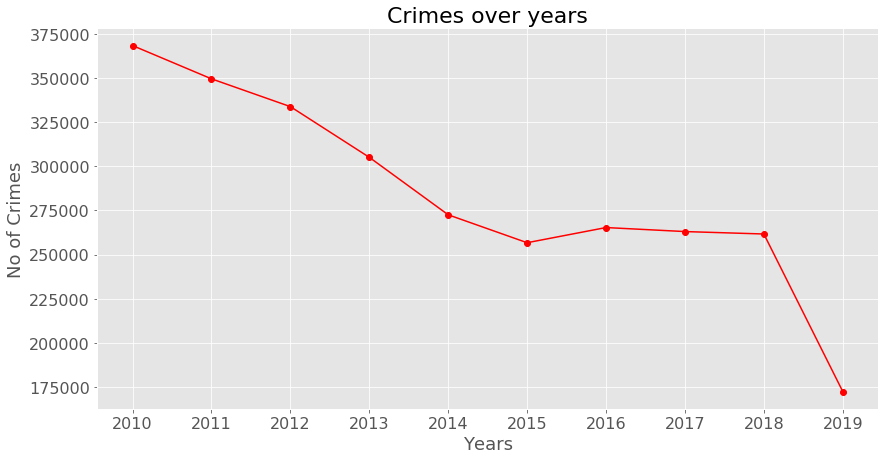

In [35]:
custom_functions.lineplot(year, crimes_per_year, "Years", "No of Crimes", "Crimes over years", xtickrange = range(2010,2020),
                         color = "red")

We can see that there is a decreasing trend in the data from year 2010 to 2015, from 2015 to 2018 the crimes are constant. 2019 has low number of total crimes beacuse we only took data upto september month.

#### Crimes over months

In [36]:
grouped_df_months = crime2010To2019_df.groupby(crime2010To2019_df["Date"].dt.month)

In [37]:
crimes_per_months = []
months = []
for key, item in grouped_df_months:
    months.append(key)
    crimes_per_months.append(grouped_df_months.get_group(key).shape[0])

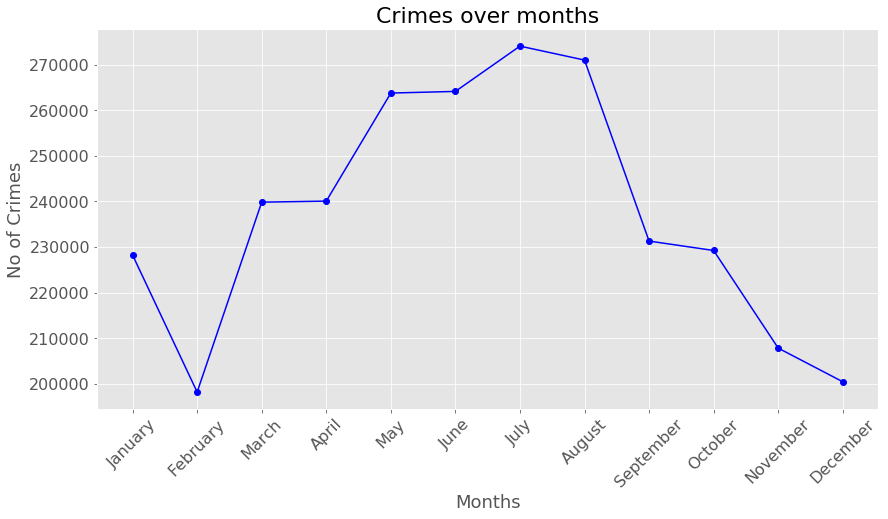

In [38]:
custom_functions.lineplot(months, crimes_per_months, "Months", "No of Crimes", "Crimes over months", 
                          xtickrange = range(1,13), color = "blue", x_rotation = 45, 
                          xticklabels = ["January", "February", "March", "April", "May", "June", "July", "August", 
                         "September", "October", "November", "December"])

Most number of crimes were happened durin MAY, JUNE, JULY AND AUGUST. While there are least number of crimes in december and february.

#### Crimes over weeks

In [39]:
grouped_df_weeks = crime2010To2019_df.groupby(crime2010To2019_df["Date"].dt.week)

In [40]:
crimes_per_weeks = []
weeks = []
for key, item in grouped_df_weeks:
    weeks.append(key)
    crimes_per_weeks.append(grouped_df_weeks.get_group(key).shape[0])

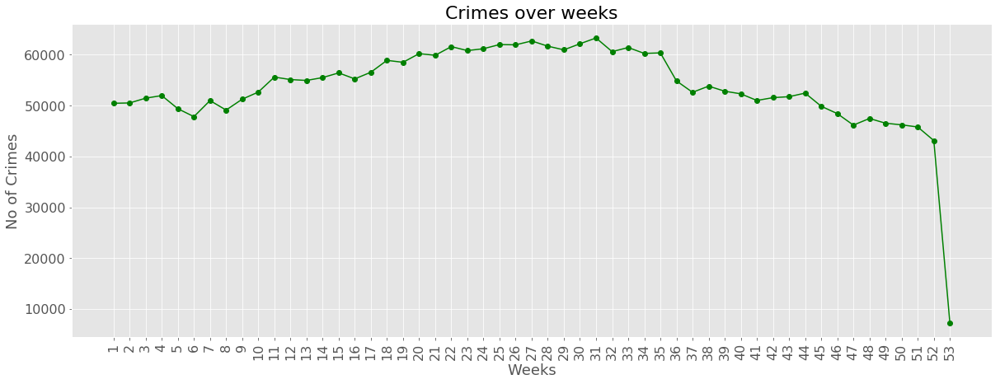

In [41]:
custom_functions.lineplot(weeks, crimes_per_weeks, "Weeks", "No of Crimes", "Crimes over weeks", 
                          xtickrange = range(1,54), color = "green", x_rotation = 90, figure_size = (20,7))

The crimes are uniformly distributed over the weeks of the year. Week 53 has low number of total crimes because week 53 only occurs during leap years.

#### Crimes over days

In [42]:
grouped_df_days = crime2010To2019_df.groupby(training_df["Date"].dt.day)

In [43]:
crimes_per_days = []
days = []
for key, item in grouped_df_days:
    days.append(key)
    crimes_per_days.append(grouped_df_days.get_group(key).shape[0])

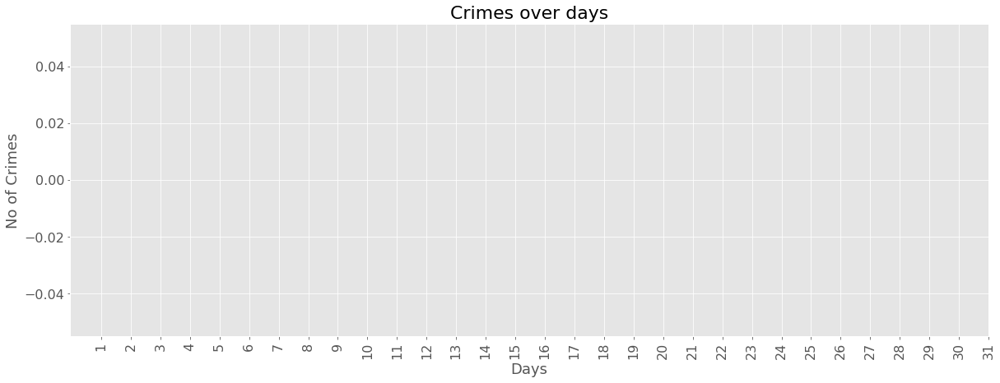

In [44]:
custom_functions.lineplot(days, crimes_per_days, "Days", "No of Crimes", "Crimes over days", 
                          xtickrange = range(1, 32), color = "black", x_rotation = 90, figure_size = (20,7))

The crimes are uniformly distributed across the days. Day 31 has low number of crimes beacuse not all months have 31 days in it.

#### Crimes over dates

In [45]:
grouped_df_dates = crime2010To2019_df.groupby(training_df["Date"].dt.date)

In [46]:
crimes_per_dates = []
dates = []
for key, item in grouped_df_dates:
    dates.append(key)
    crimes_per_dates.append(grouped_df_dates.get_group(key).shape[0])

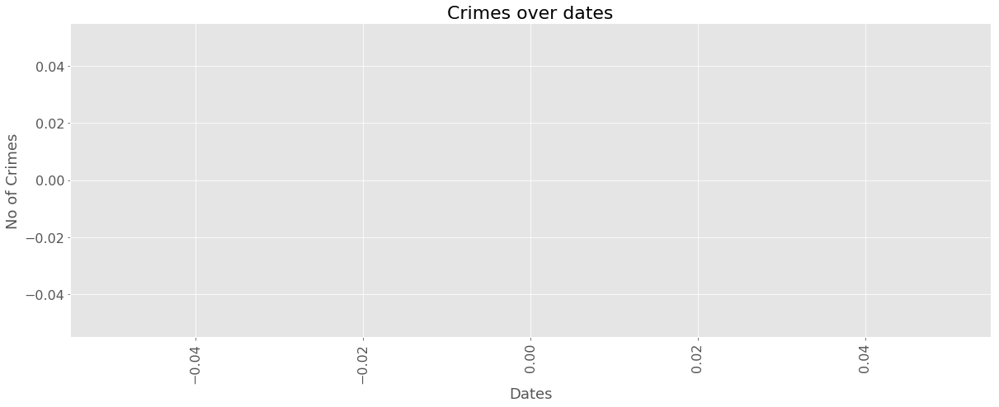

In [47]:
custom_functions.lineplot(dates, crimes_per_dates, "Dates", "No of Crimes", "Crimes over dates", 
                          xtickrange = None, color = "royalblue", x_rotation = 90, figure_size = (20,7))

#### Crimes over days of the week

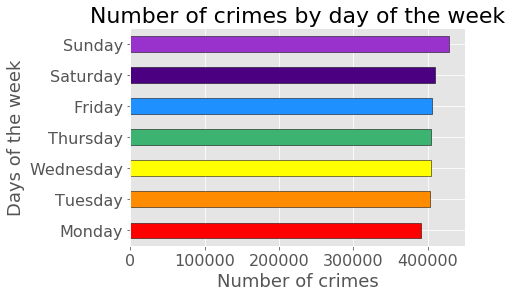

In [48]:
days = ['Monday','Tuesday','Wednesday',  'Thursday', 'Friday', 'Saturday', 'Sunday']
color = ['red', 'darkorange', 'yellow', 'mediumseagreen', 'dodgerblue', 'indigo', 'darkorchid']
data = crime2010To2019_df.groupby([crime2010To2019_df.index.dayofweek]).size().sort_values()
data.plot(kind='barh', color = color,
         edgecolor = "black")
plt.ylabel('Days of the week')
plt.yticks(np.arange(7), days)
plt.xlabel('Number of crimes')
plt.title('Number of crimes by day of the week')
plt.show()

As we can see in the bar plot that highest number of crimes were happened on weekends.

#### Generating data for visualizations

In [49]:
locations = crime2010To2019_df["Location Description"].value_counts().index[:10]
crim_types = crime2010To2019_df["Primary Type"].value_counts().index[:10]
boolean_indexing = []
for loc, crime in zip(crime2010To2019_df["Location Description"], crime2010To2019_df["Primary Type"]):
    flag1 = loc in locations
    flag2 = crime in crim_types
    boolean_indexing.append(flag1 and flag2)
after_filter = crime2010To2019_df[boolean_indexing]

#### Hour by day of the week

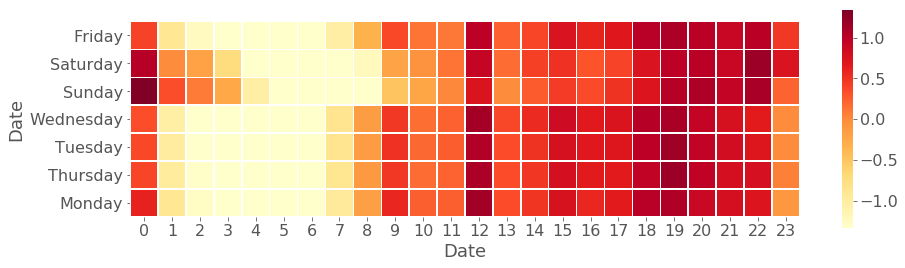

In [50]:
hour_by_week = custom_functions.create_data(after_filter, kind = "hour_by_week")
plt.figure(figsize=(15,10))
custom_functions.process_and_plot(hour_by_week.T, shrink=0.4)
plt.show()

More number of crimes were happened at sunday and saturday midnight. We can also see that number of crimes are high after 18th hour. Number of crimes at midday are also high independent of what day it is.

#### Crime vs day of the week

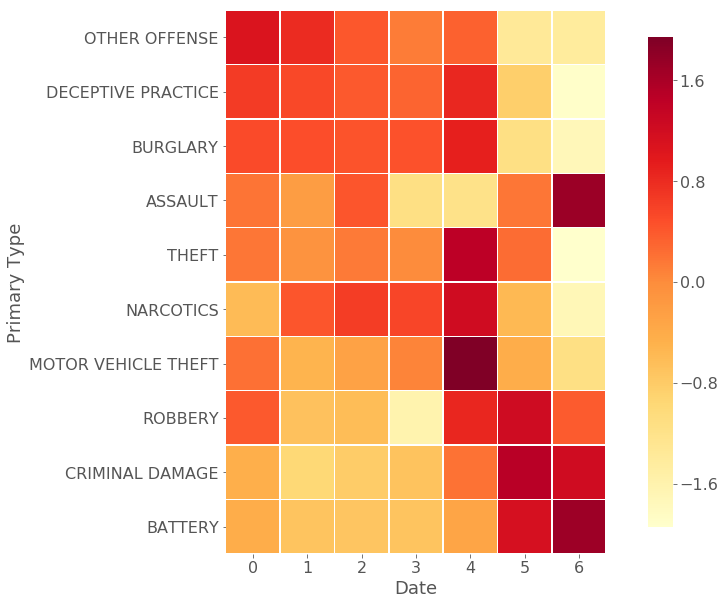

In [51]:
dayofweek_by_type = custom_functions.create_data(after_filter, kind = "dayofweek_by_type")
plt.figure(figsize=(15,10))
custom_functions.process_and_plot(dayofweek_by_type, shrink = 0.9)
plt.show()

BATTERY and ASSAULT crimes were mostly happend on Sunday where MOTOR VEHICLE THEFT were generally occurred on Friday.

#### Crimes over months of the year

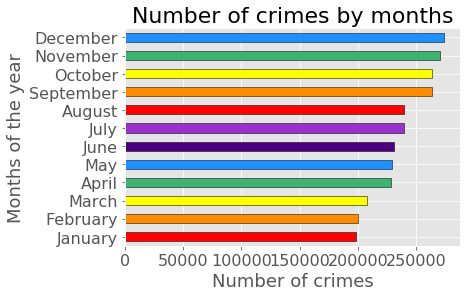

In [52]:
data = crime2010To2019_df.groupby([crime2010To2019_df.index.month]).size().sort_values()
data.plot(kind='barh', edgecolor = "black", 
          color = color * 2 )
plt.ylabel('Months of the year')
plt.xlabel('Number of crimes')
plt.yticks(np.arange(12), ["January", "February", "March", "April", "May", "June", "July", "August", 
                         "September", "October", "November", "December"])
plt.title('Number of crimes by months')
plt.show()

### Primary Type

In [53]:
counts_type = crime2010To2019_df["Primary Type"].value_counts()

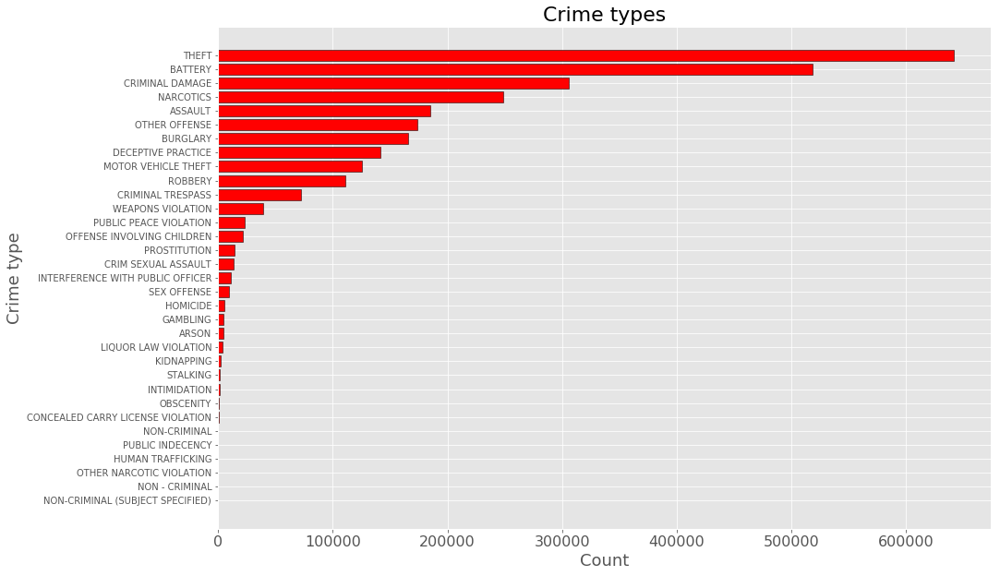

In [54]:
custom_functions.barplot(counts_type, xlab = "Count", ylab = "Crime type", title = "Crime types", color = "red", adjust = True, 
        figure_size=(15,10))

#### TOP 10

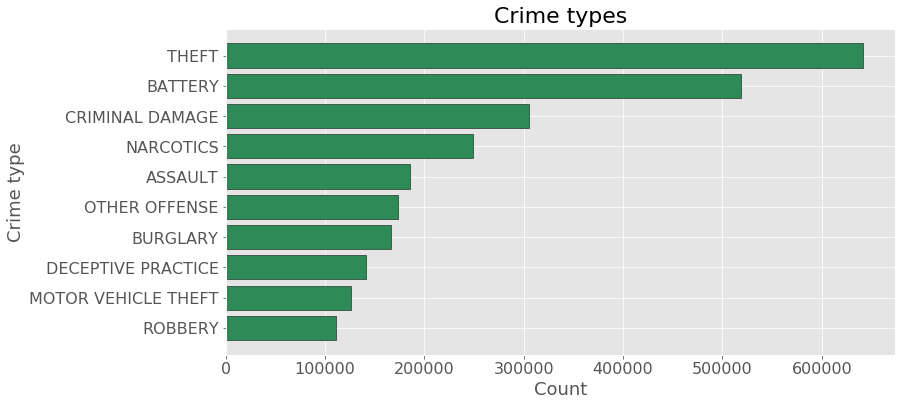

In [55]:
custom_functions.barplot(counts_type[:10], xlab = "Count", ylab = "Crime type", title = "Crime types", color = "seagreen")

#### Crime type by hour

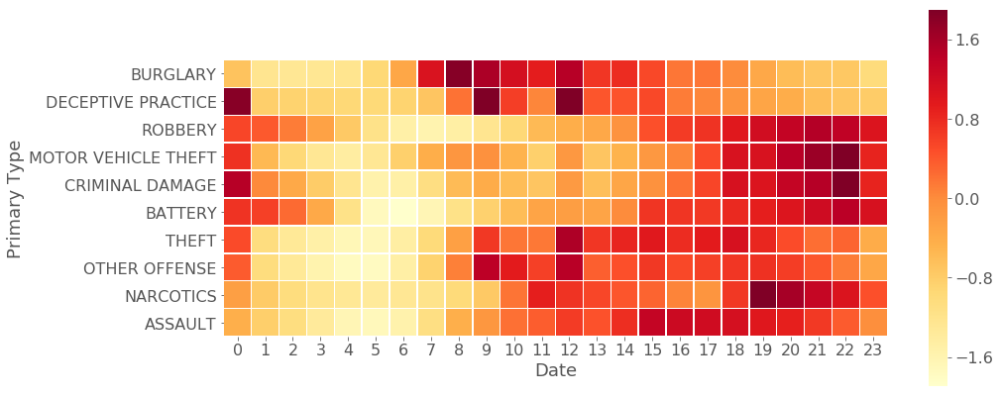

In [56]:
hour_by_type = custom_functions.create_data(after_filter, kind = "hour_by_type")
plt.figure(figsize=(15,20))
custom_functions.process_and_plot(hour_by_type, shrink = 0.35)
plt.show()

Deceptive Practices were carried out at midnight and midday mostly. Criminal damage was done mostly at late nights. Narcotics related crimes were occurred during late evening.

#### Lineplot for every crime type

In [57]:
crimes_count_date = crime2010To2019_df.pivot_table('ID', aggfunc=np.size, columns='Primary Type', 
                                                   index=crime2010To2019_df.index.date, fill_value=0)
crimes_count_date.index = pd.DatetimeIndex(crimes_count_date.index)

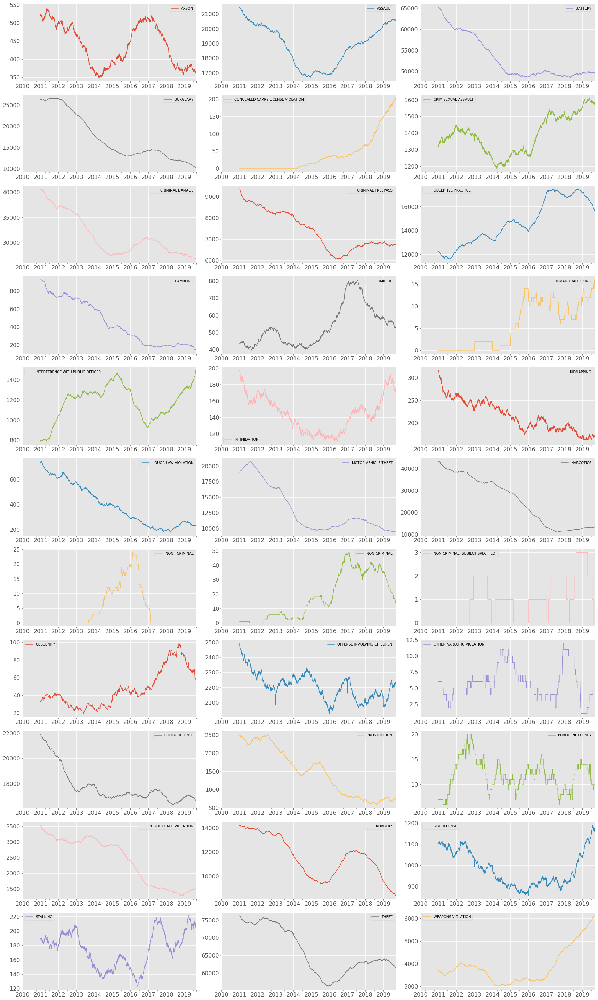

In [58]:
crimes_count_date.rolling(365).sum().plot(figsize = (24, 40), subplots = True, layout = (-1, 3), sharex = False, sharey = False)
plt.tight_layout()
plt.show()

### Trend of Top 5 crime types

#### Creating data

In [59]:
df_2010 = crime2010To2019_df[crime2010To2019_df["Date"].dt.year == 2010]
df_2011 = crime2010To2019_df[crime2010To2019_df["Date"].dt.year == 2011]
df_2012 = crime2010To2019_df[crime2010To2019_df["Date"].dt.year == 2012]
df_2013 = crime2010To2019_df[crime2010To2019_df["Date"].dt.year == 2013]
df_2014 = crime2010To2019_df[crime2010To2019_df["Date"].dt.year == 2014]
df_2015 = crime2010To2019_df[crime2010To2019_df["Date"].dt.year == 2015]
df_2016 = crime2010To2019_df[crime2010To2019_df["Date"].dt.year == 2016]
df_2017 = crime2010To2019_df[crime2010To2019_df["Date"].dt.year == 2017]
df_2018 = crime2010To2019_df[crime2010To2019_df["Date"].dt.year == 2018]
df_2019 = crime2010To2019_df[crime2010To2019_df["Date"].dt.year == 2019]

In [60]:
top5_crimes = ["THEFT", "BATTERY", "CRIMINAL DAMAGE", "NARCOTICS", "ASSAULT"]
crimes_2010 = pd.DataFrame(df_2010[df_2010['Primary Type'].isin(top5_crimes)]['Primary Type'])
crimes_2011 = pd.DataFrame(df_2011[df_2011['Primary Type'].isin(top5_crimes)]['Primary Type'])
crimes_2012 = pd.DataFrame(df_2012[df_2012['Primary Type'].isin(top5_crimes)]['Primary Type'])
crimes_2013 = pd.DataFrame(df_2013[df_2013['Primary Type'].isin(top5_crimes)]['Primary Type'])
crimes_2014 = pd.DataFrame(df_2014[df_2014['Primary Type'].isin(top5_crimes)]['Primary Type'])
crimes_2015 = pd.DataFrame(df_2015[df_2015['Primary Type'].isin(top5_crimes)]['Primary Type'])
crimes_2016 = pd.DataFrame(df_2016[df_2016['Primary Type'].isin(top5_crimes)]['Primary Type'])
crimes_2017 = pd.DataFrame(df_2017[df_2017['Primary Type'].isin(top5_crimes)]['Primary Type'])
crimes_2018 = pd.DataFrame(df_2018[df_2018['Primary Type'].isin(top5_crimes)]['Primary Type'])
crimes_2019 = pd.DataFrame(df_2019[df_2019['Primary Type'].isin(top5_crimes)]['Primary Type'])

#### Monthly

In [61]:
grouper_2010 = crimes_2010.groupby([pd.Grouper(freq = 'M'), 'Primary Type'])
grouper_2011 = crimes_2011.groupby([pd.Grouper(freq = 'M'), 'Primary Type'])
grouper_2012 = crimes_2012.groupby([pd.Grouper(freq = 'M'), 'Primary Type'])
grouper_2013 = crimes_2013.groupby([pd.Grouper(freq = 'M'), 'Primary Type'])
grouper_2014 = crimes_2014.groupby([pd.Grouper(freq = 'M'), 'Primary Type'])
grouper_2015 = crimes_2015.groupby([pd.Grouper(freq = 'M'), 'Primary Type'])
grouper_2016 = crimes_2016.groupby([pd.Grouper(freq = 'M'), 'Primary Type'])
grouper_2017 = crimes_2017.groupby([pd.Grouper(freq = 'M'), 'Primary Type'])
grouper_2018 = crimes_2018.groupby([pd.Grouper(freq = 'M'), 'Primary Type'])
grouper_2019 = crimes_2019.groupby([pd.Grouper(freq = 'M'), 'Primary Type'])

In [62]:
data_2010 = grouper_2010['Primary Type'].count().unstack()
data_2011 = grouper_2011['Primary Type'].count().unstack()
data_2012 = grouper_2012['Primary Type'].count().unstack()
data_2013 = grouper_2013['Primary Type'].count().unstack()
data_2014 = grouper_2014['Primary Type'].count().unstack()
data_2015 = grouper_2015['Primary Type'].count().unstack()
data_2016 = grouper_2016['Primary Type'].count().unstack()
data_2017 = grouper_2017['Primary Type'].count().unstack()
data_2018 = grouper_2018['Primary Type'].count().unstack()
data_2019 = grouper_2019['Primary Type'].count().unstack()

#### Plotting the graphs

#### 2010

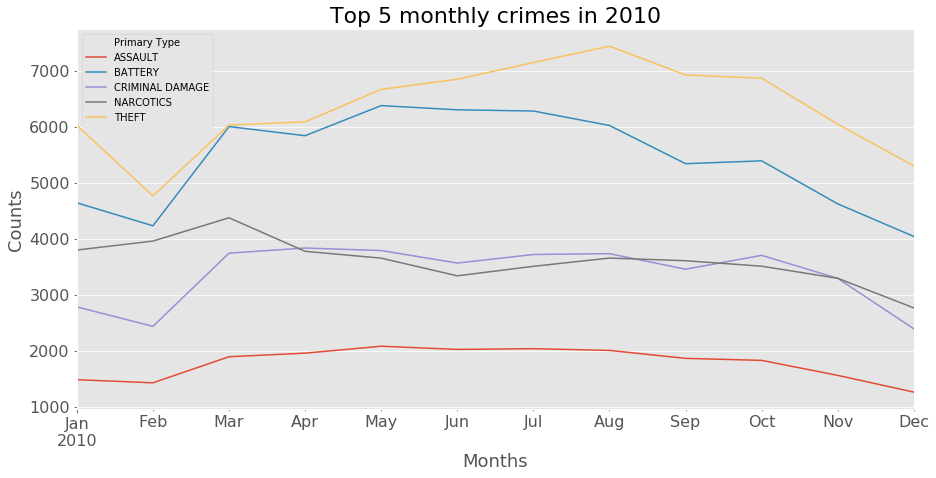

In [63]:
data_2010.plot(figsize=(15,7))
plt.title("Top 5 monthly crimes in 2010")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2011

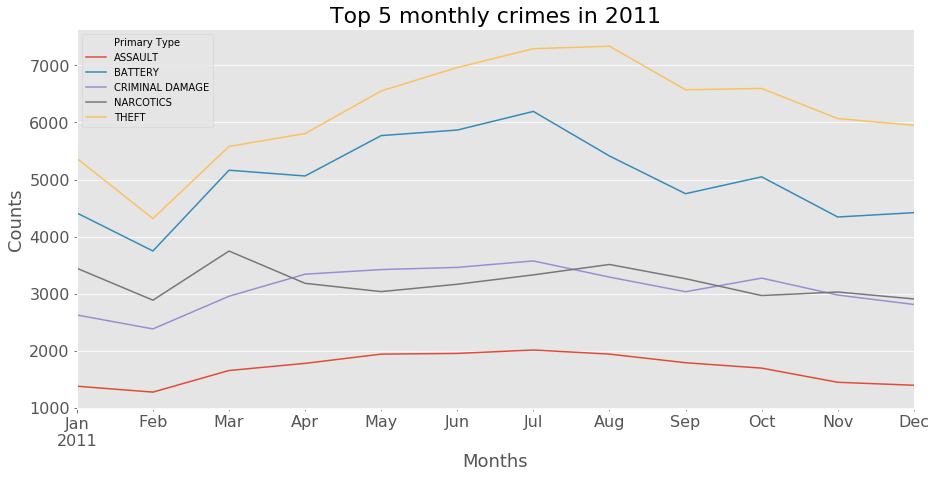

In [64]:
data_2011.plot(figsize=(15,7))
plt.title("Top 5 monthly crimes in 2011")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2012

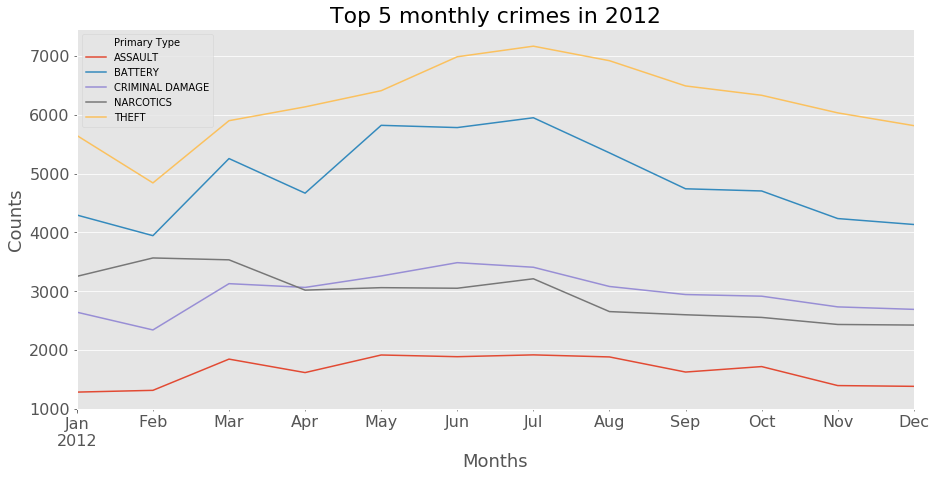

In [65]:
data_2012.plot(figsize=(15,7))
plt.title("Top 5 monthly crimes in 2012")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2013

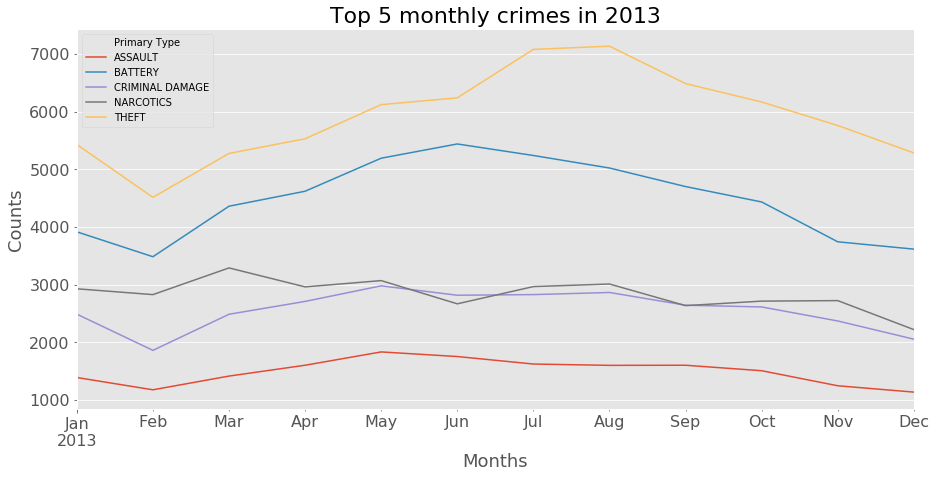

In [66]:
data_2013.plot(figsize=(15,7))
plt.title("Top 5 monthly crimes in 2013")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2014

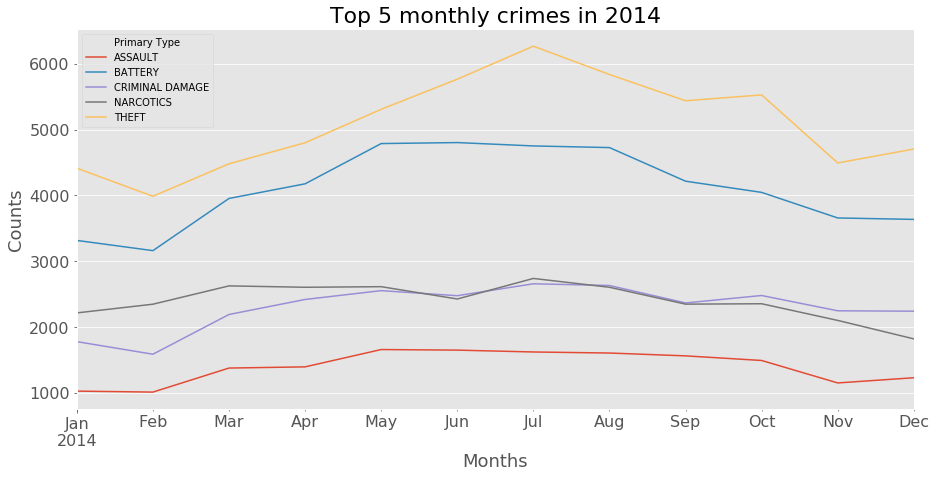

In [67]:
data_2014.plot(figsize=(15,7))
plt.title("Top 5 monthly crimes in 2014")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2015

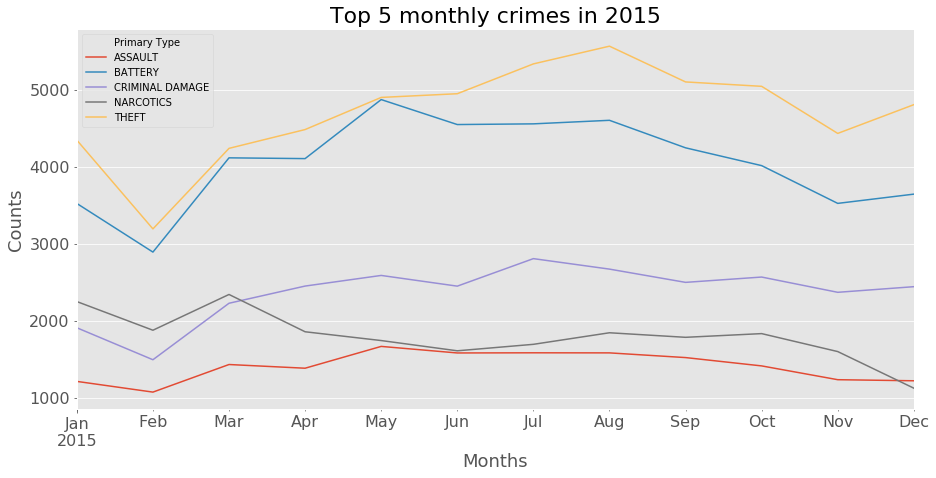

In [68]:
data_2015.plot(figsize=(15,7))
plt.title("Top 5 monthly crimes in 2015")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2016

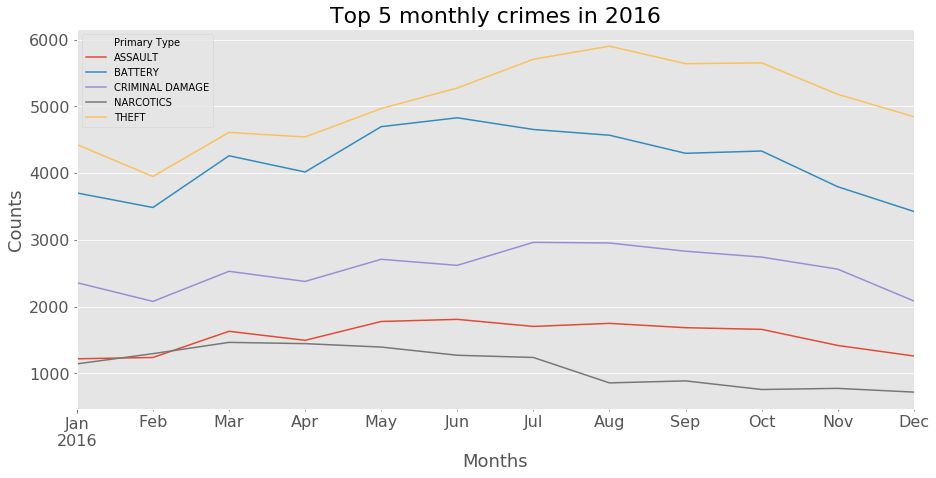

In [69]:
data_2016.plot(figsize=(15,7))
plt.title("Top 5 monthly crimes in 2016")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2017

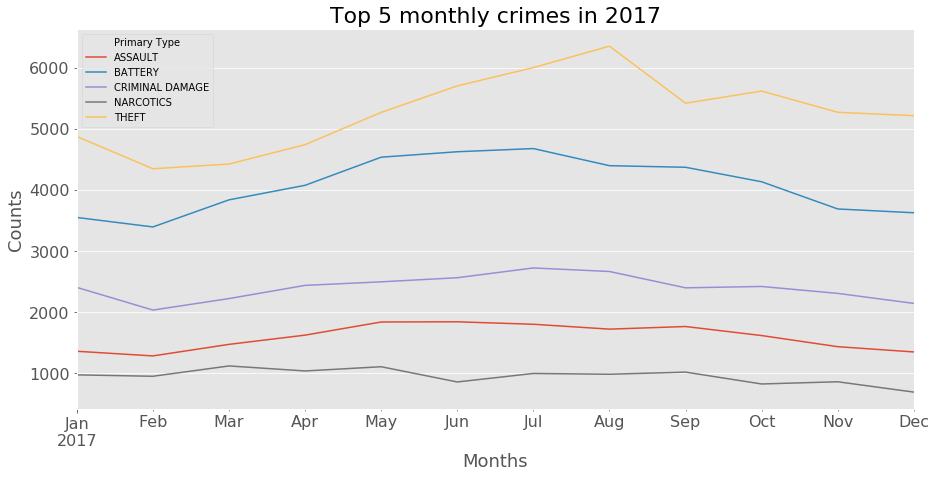

In [70]:
data_2017.plot(figsize=(15,7))
plt.title("Top 5 monthly crimes in 2017")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2018

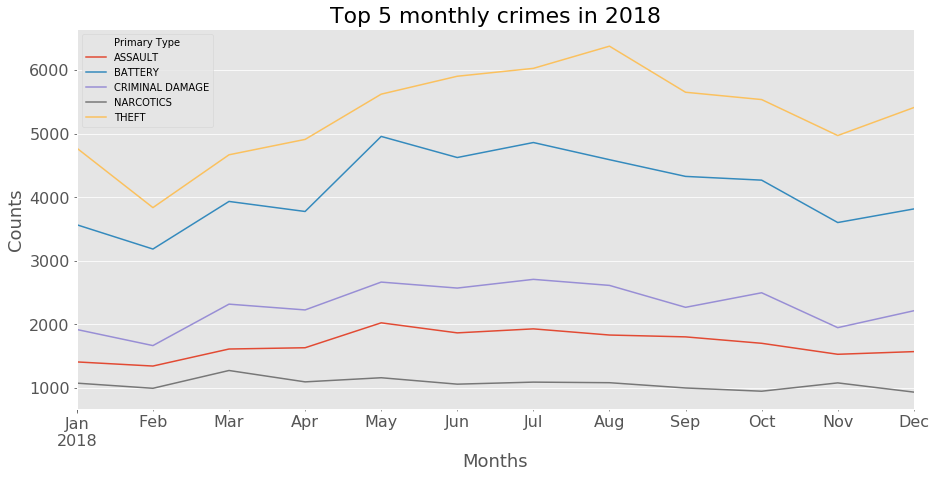

In [71]:
data_2018.plot(figsize=(15,7))
plt.title("Top 5 monthly crimes in 2018")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2019

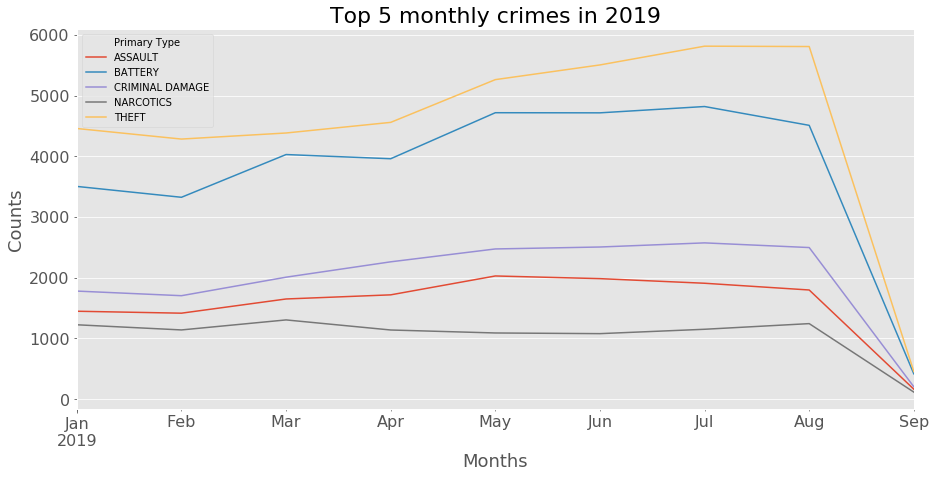

In [72]:
data_2019.plot(figsize=(15,7))
plt.title("Top 5 monthly crimes in 2019")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### Weekly

In [73]:
grouper_2010 = crimes_2010.groupby([pd.Grouper(freq = 'W'), 'Primary Type'])
grouper_2011 = crimes_2011.groupby([pd.Grouper(freq = 'W'), 'Primary Type'])
grouper_2012 = crimes_2012.groupby([pd.Grouper(freq = 'W'), 'Primary Type'])
grouper_2013 = crimes_2013.groupby([pd.Grouper(freq = 'W'), 'Primary Type'])
grouper_2014 = crimes_2014.groupby([pd.Grouper(freq = 'W'), 'Primary Type'])
grouper_2015 = crimes_2015.groupby([pd.Grouper(freq = 'W'), 'Primary Type'])
grouper_2016 = crimes_2016.groupby([pd.Grouper(freq = 'W'), 'Primary Type'])
grouper_2017 = crimes_2017.groupby([pd.Grouper(freq = 'W'), 'Primary Type'])
grouper_2018 = crimes_2018.groupby([pd.Grouper(freq = 'W'), 'Primary Type'])
grouper_2019 = crimes_2019.groupby([pd.Grouper(freq = 'W'), 'Primary Type'])

In [74]:
data_2010 = grouper_2010['Primary Type'].count().unstack()
data_2011 = grouper_2011['Primary Type'].count().unstack()
data_2012 = grouper_2012['Primary Type'].count().unstack()
data_2013 = grouper_2013['Primary Type'].count().unstack()
data_2014 = grouper_2014['Primary Type'].count().unstack()
data_2015 = grouper_2015['Primary Type'].count().unstack()
data_2016 = grouper_2016['Primary Type'].count().unstack()
data_2017 = grouper_2017['Primary Type'].count().unstack()
data_2018 = grouper_2018['Primary Type'].count().unstack()
data_2019 = grouper_2019['Primary Type'].count().unstack()

#### Plotting the graphs

#### 2010

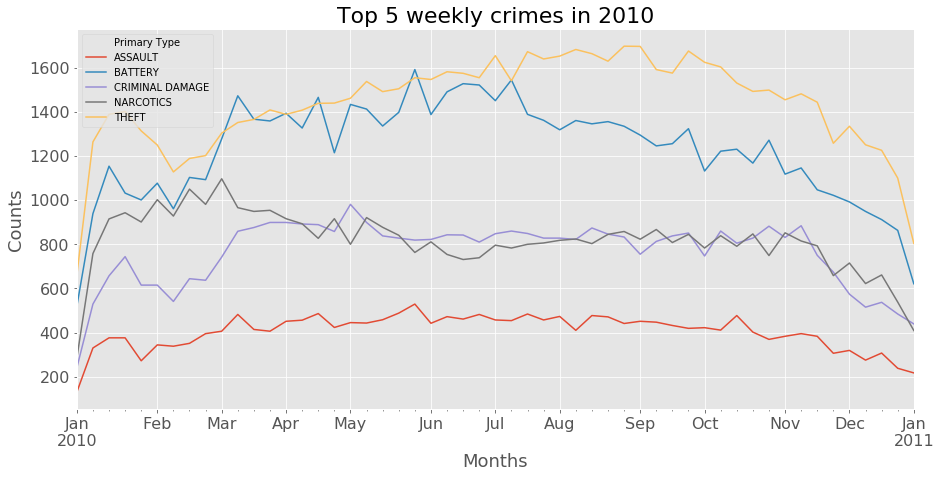

In [75]:
data_2010.plot(figsize=(15,7))
plt.title("Top 5 weekly crimes in 2010")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2011

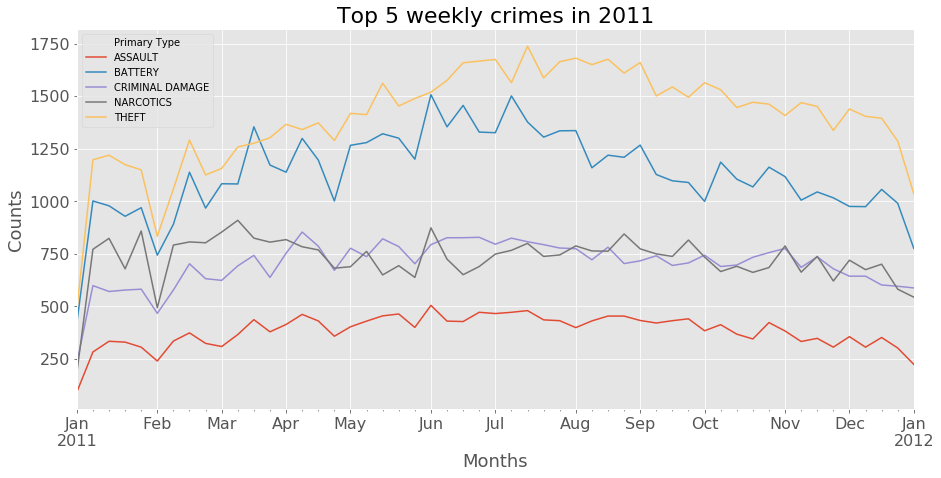

In [76]:
data_2011.plot(figsize=(15,7))
plt.title("Top 5 weekly crimes in 2011")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2012

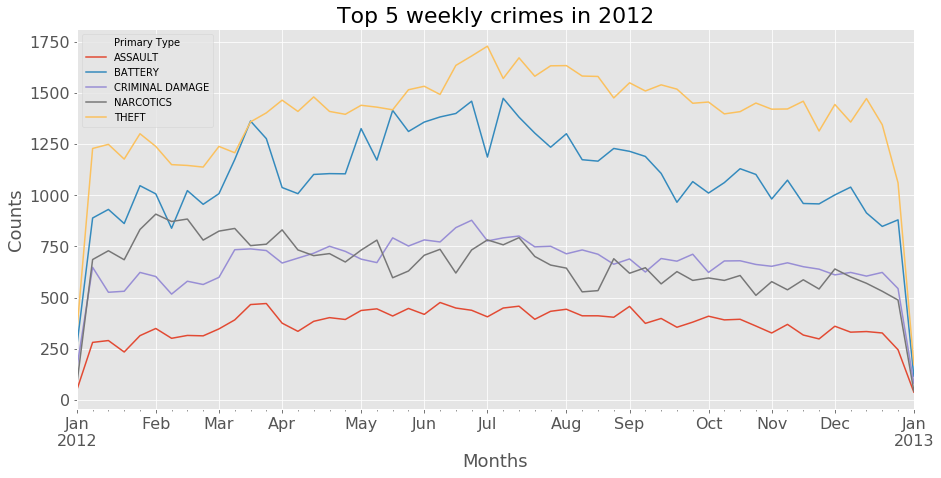

In [77]:
data_2012.plot(figsize=(15,7))
plt.title("Top 5 weekly crimes in 2012")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2013

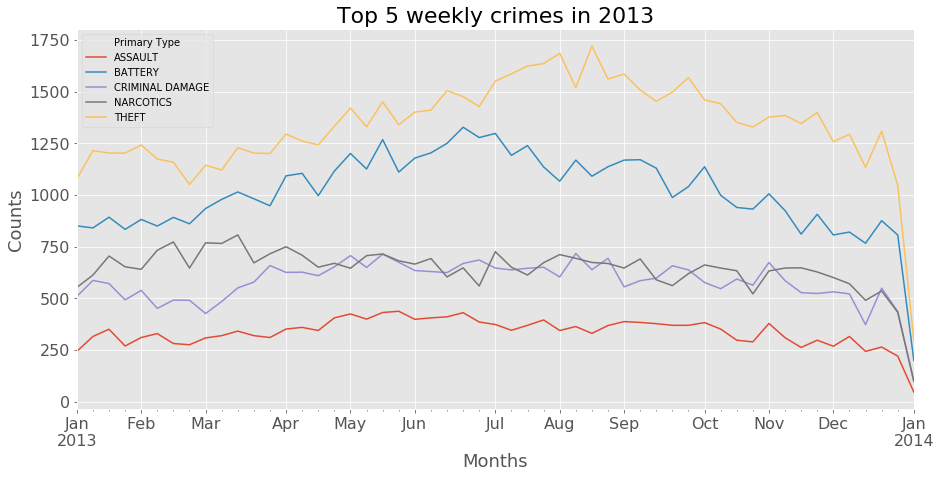

In [78]:
data_2013.plot(figsize=(15,7))
plt.title("Top 5 weekly crimes in 2013")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2014

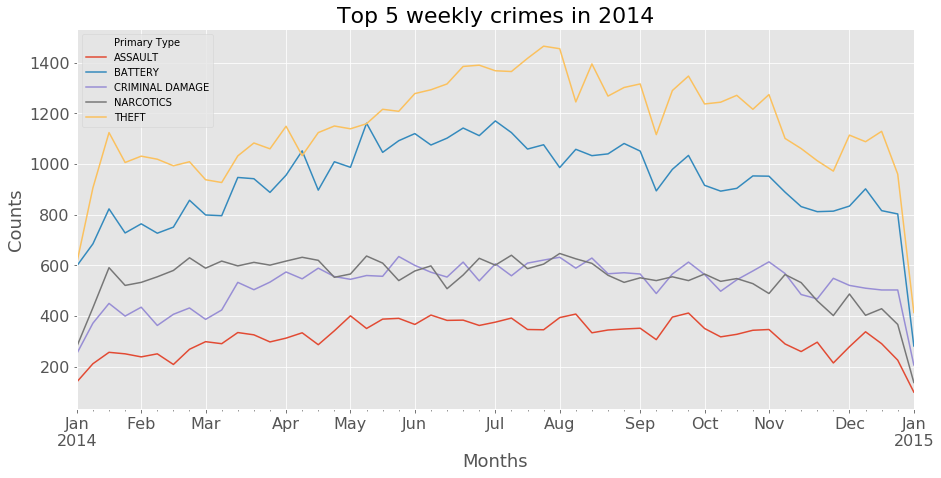

In [79]:
data_2014.plot(figsize=(15,7))
plt.title("Top 5 weekly crimes in 2014")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2015

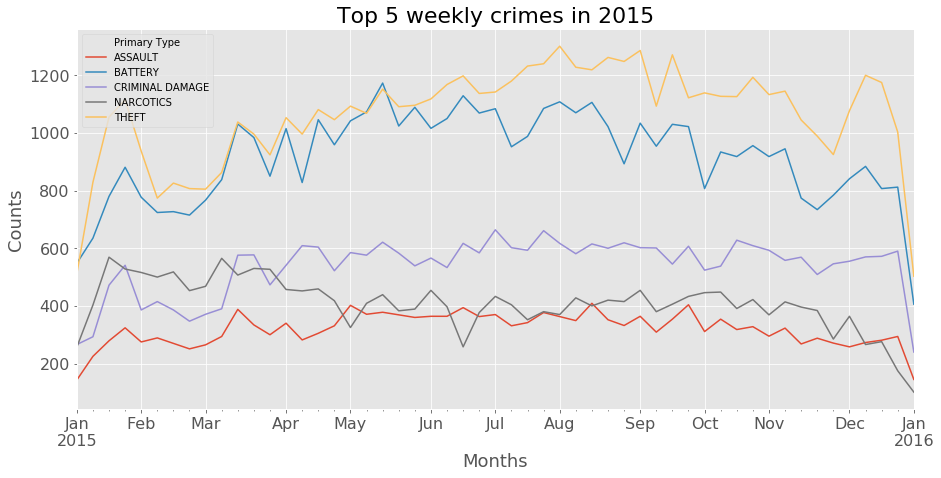

In [80]:
data_2015.plot(figsize=(15,7))
plt.title("Top 5 weekly crimes in 2015")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2016

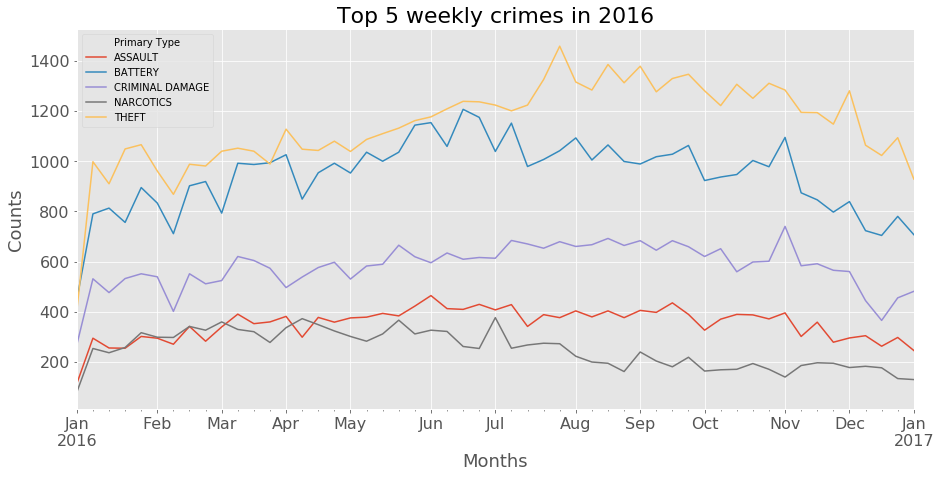

In [81]:
data_2016.plot(figsize=(15,7))
plt.title("Top 5 weekly crimes in 2016")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2017

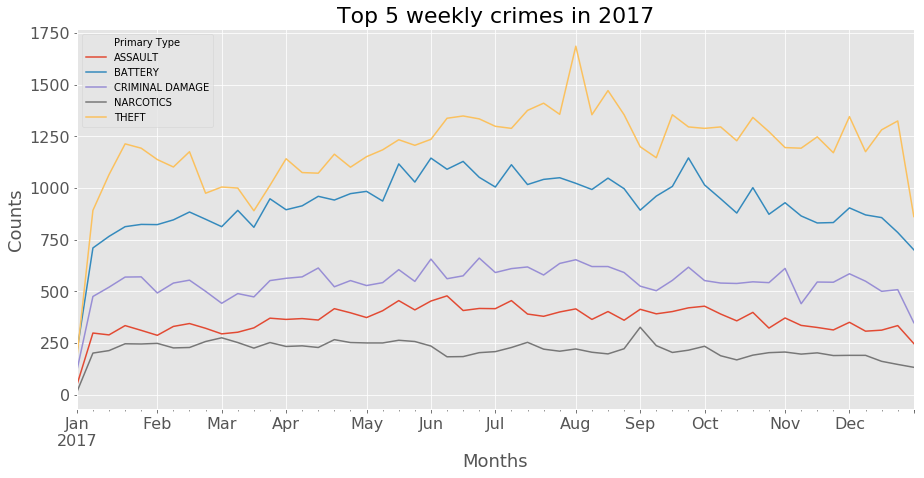

In [82]:
data_2017.plot(figsize=(15,7))
plt.title("Top 5 weekly crimes in 2017")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2018

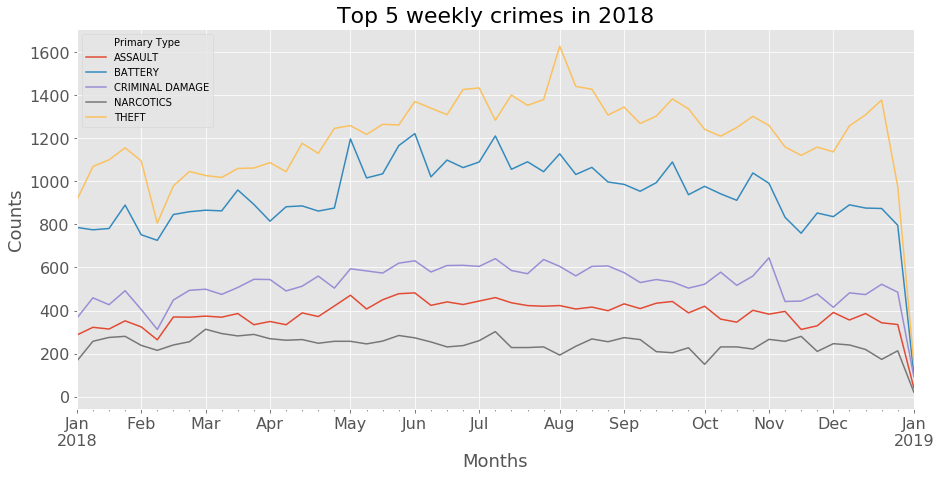

In [83]:
data_2018.plot(figsize=(15,7))
plt.title("Top 5 weekly crimes in 2018")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2019

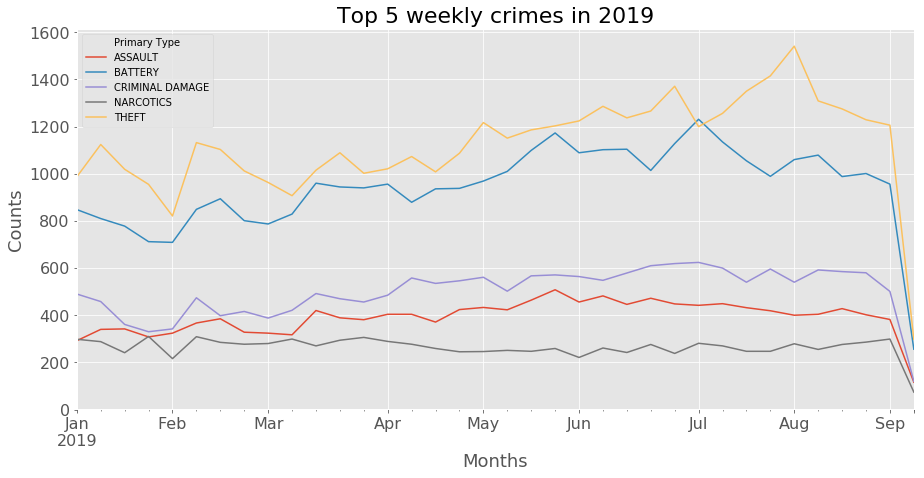

In [84]:
data_2019.plot(figsize=(15,7))
plt.title("Top 5 weekly crimes in 2019")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### Daily

In [85]:
grouper_2010 = crimes_2010.groupby([pd.Grouper(freq = 'D'), 'Primary Type'])
grouper_2011 = crimes_2011.groupby([pd.Grouper(freq = 'D'), 'Primary Type'])
grouper_2012 = crimes_2012.groupby([pd.Grouper(freq = 'D'), 'Primary Type'])
grouper_2013 = crimes_2013.groupby([pd.Grouper(freq = 'D'), 'Primary Type'])
grouper_2014 = crimes_2014.groupby([pd.Grouper(freq = 'D'), 'Primary Type'])
grouper_2015 = crimes_2015.groupby([pd.Grouper(freq = 'D'), 'Primary Type'])
grouper_2016 = crimes_2016.groupby([pd.Grouper(freq = 'D'), 'Primary Type'])
grouper_2017 = crimes_2017.groupby([pd.Grouper(freq = 'D'), 'Primary Type'])
grouper_2018 = crimes_2018.groupby([pd.Grouper(freq = 'D'), 'Primary Type'])
grouper_2019 = crimes_2019.groupby([pd.Grouper(freq = 'D'), 'Primary Type'])

In [86]:
data_2010 = grouper_2010['Primary Type'].count().unstack()
data_2011 = grouper_2011['Primary Type'].count().unstack()
data_2012 = grouper_2012['Primary Type'].count().unstack()
data_2013 = grouper_2013['Primary Type'].count().unstack()
data_2014 = grouper_2014['Primary Type'].count().unstack()
data_2015 = grouper_2015['Primary Type'].count().unstack()
data_2016 = grouper_2016['Primary Type'].count().unstack()
data_2017 = grouper_2017['Primary Type'].count().unstack()
data_2018 = grouper_2018['Primary Type'].count().unstack()
data_2019 = grouper_2019['Primary Type'].count().unstack()

#### Plotting the graphs

#### 2010

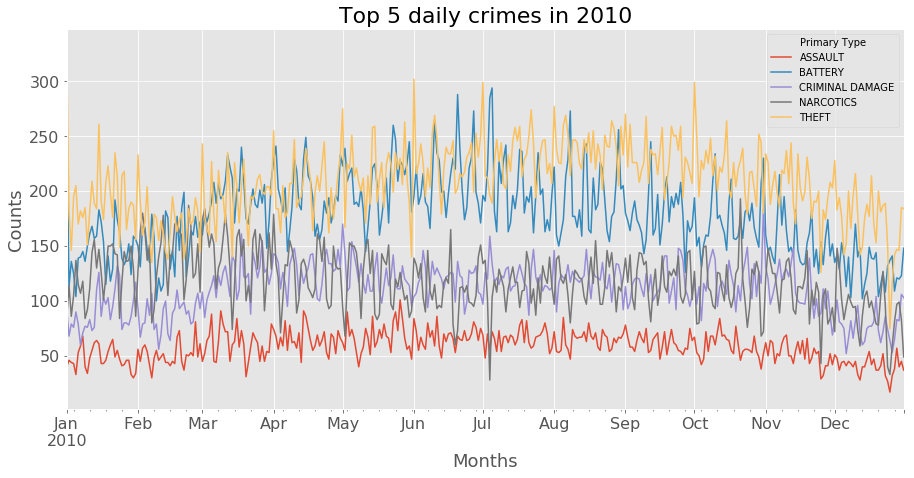

In [87]:
data_2010.plot(figsize=(15,7))
plt.title("Top 5 daily crimes in 2010")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2011

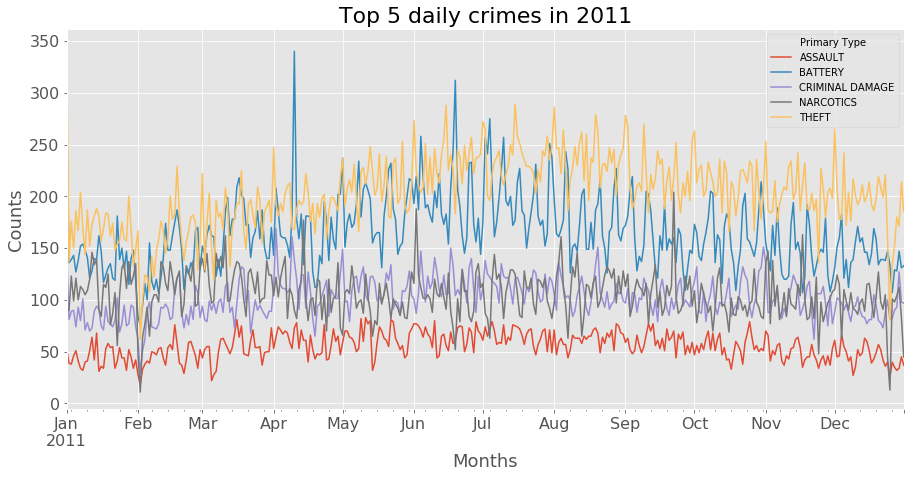

In [88]:
data_2011.plot(figsize=(15,7))
plt.title("Top 5 daily crimes in 2011")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2012

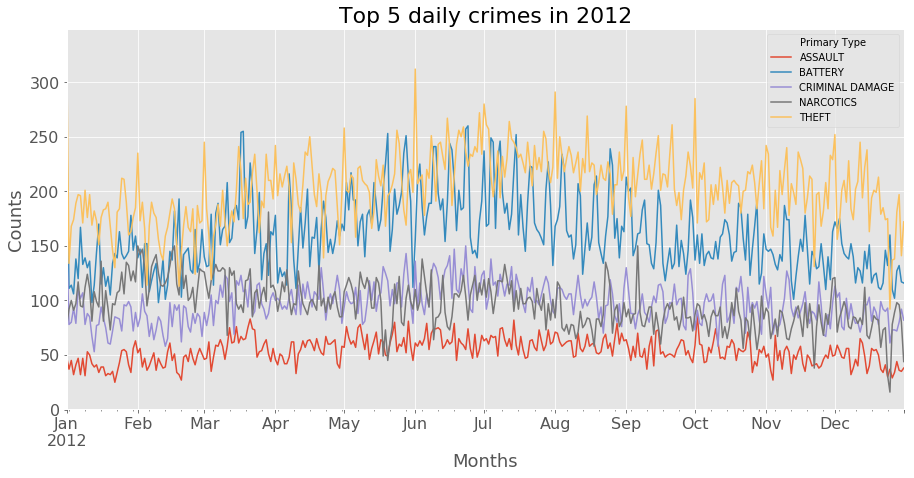

In [89]:
data_2012.plot(figsize=(15,7))
plt.title("Top 5 daily crimes in 2012")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2013

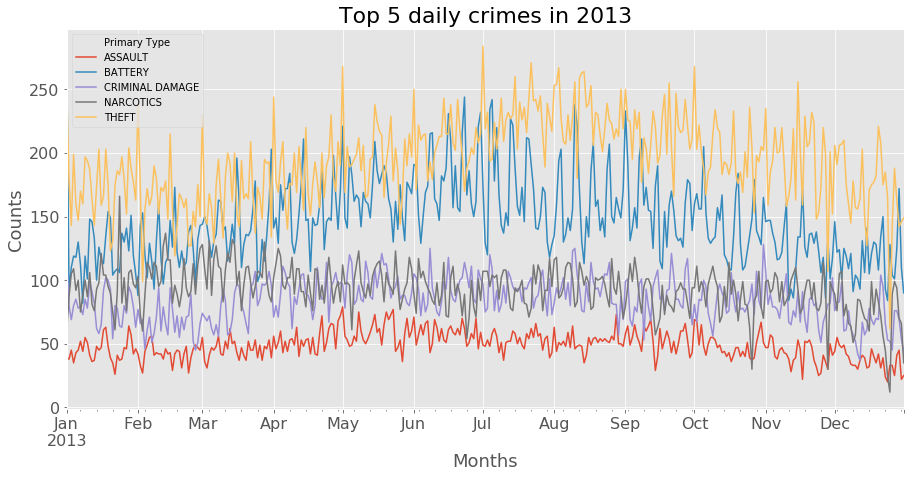

In [90]:
data_2013.plot(figsize=(15,7))
plt.title("Top 5 daily crimes in 2013")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2014

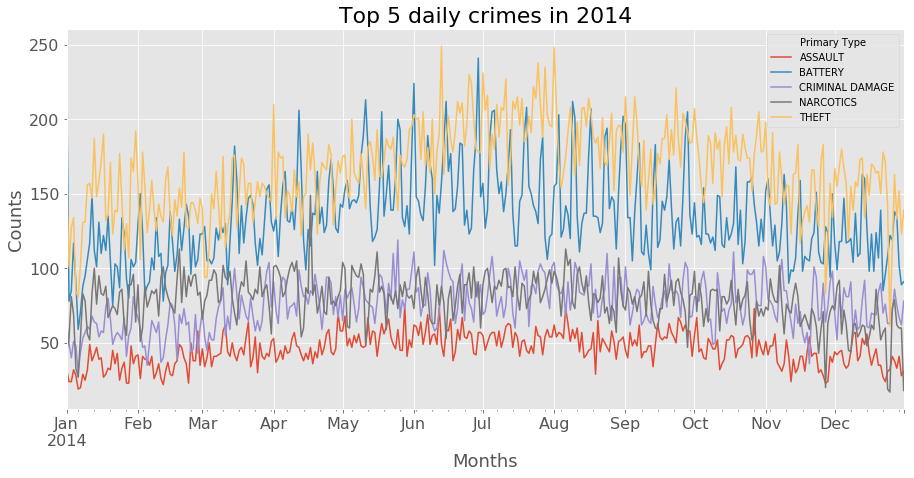

In [91]:
data_2014.plot(figsize=(15,7))
plt.title("Top 5 daily crimes in 2014")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2015

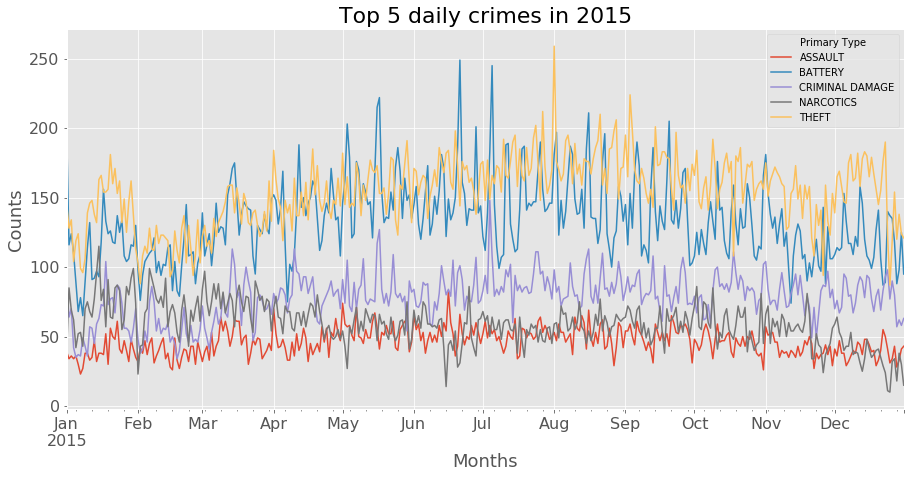

In [92]:
data_2015.plot(figsize=(15,7))
plt.title("Top 5 daily crimes in 2015")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2016

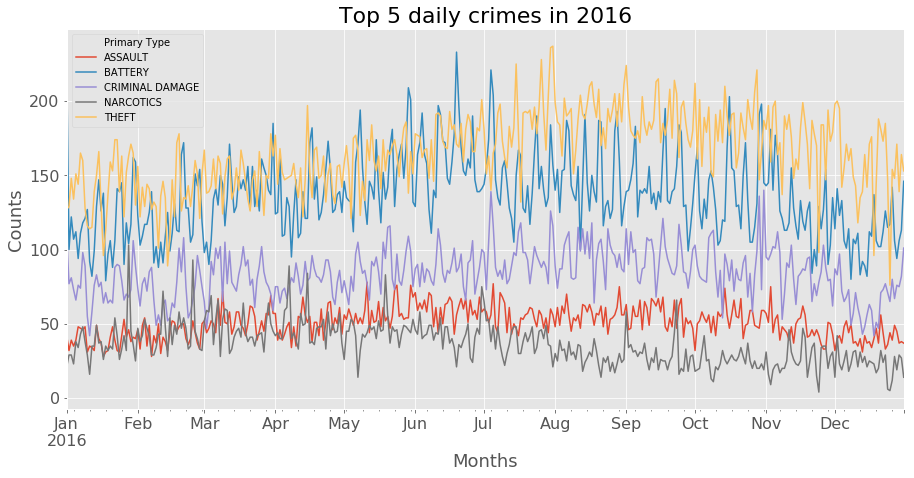

In [93]:
data_2016.plot(figsize=(15,7))
plt.title("Top 5 daily crimes in 2016")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2017

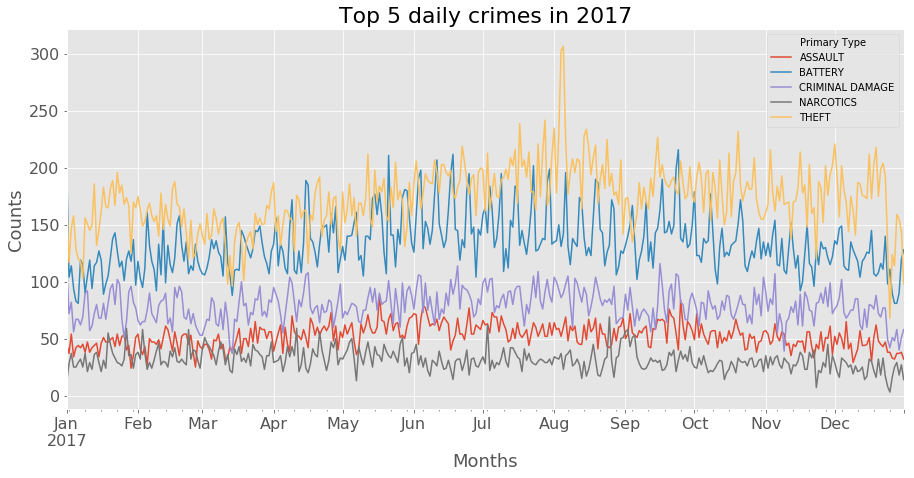

In [94]:
data_2017.plot(figsize=(15,7))
plt.title("Top 5 daily crimes in 2017")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2018

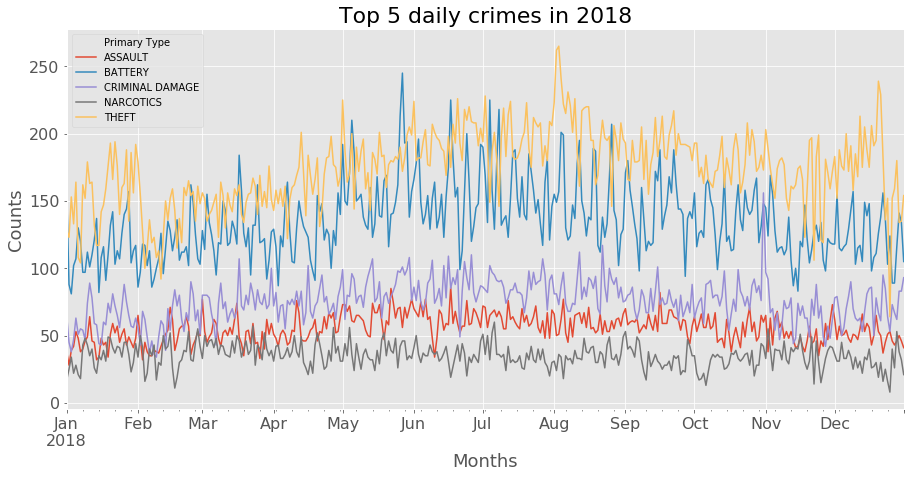

In [95]:
data_2018.plot(figsize=(15,7))
plt.title("Top 5 daily crimes in 2018")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

#### 2019

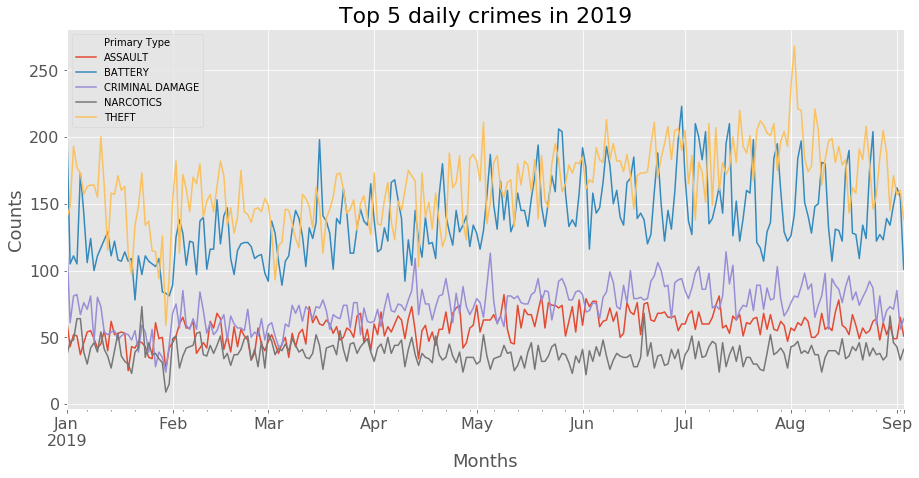

In [96]:
data_2019.plot(figsize=(15,7))
plt.title("Top 5 daily crimes in 2019")
plt.xlabel("Months")
plt.ylabel("Counts")
plt.show()

### Location Description

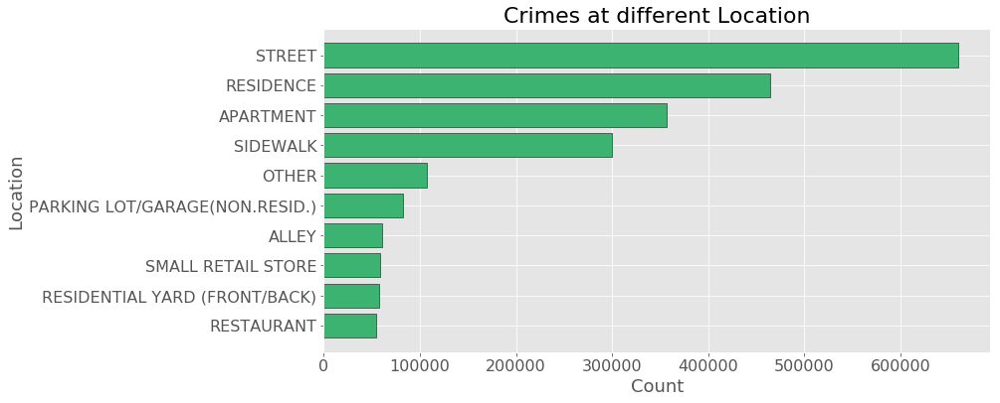

In [97]:
counts_loc_desc = crime2010To2019_df["Location Description"].value_counts()
custom_functions.barplot(counts_loc_desc[:10], xlab = "Count", ylab = "Location", title = "Crimes at different Location", 
                         color = "mediumseagreen")

#### Location by type

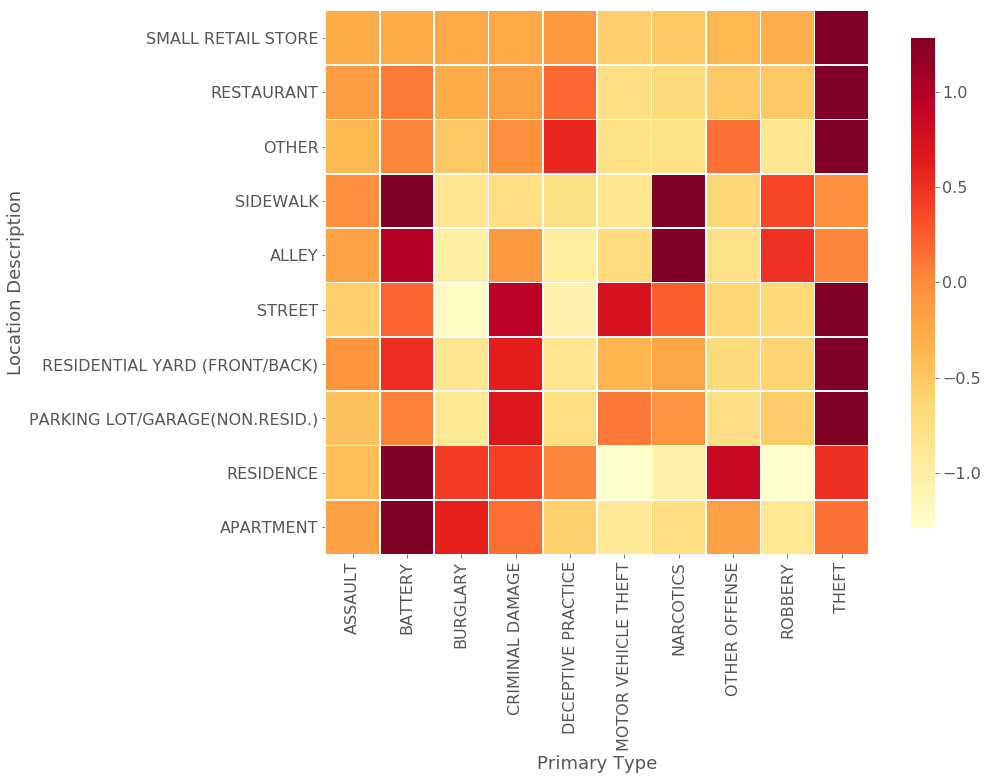

In [98]:
location_by_type = custom_functions.create_data(after_filter, kind = "location_by_type")
plt.figure(figsize=(15,10))
custom_functions.process_and_plot(location_by_type, shrink=0.9)
plt.show()

BATTERY related crimes were occurred at APARTMENTS, RESIDENCES, On SIDEWALKS and in ALLEY ways. NARCOTICS related activities were generally carried on SIDEWALKS and in ALLEY ways. And THEFT was occurred at almost all the places.

#### Location by hour

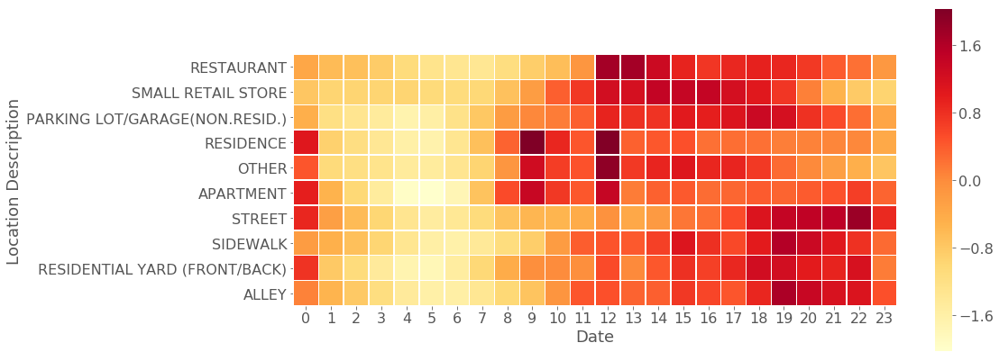

In [99]:
hour_by_location = custom_functions.create_data(after_filter, kind = "hour_by_location")
plt.figure(figsize=(15,10))
custom_functions.process_and_plot(hour_by_location, shrink=0.7)
plt.show()

Crime at midnight mostly took place in RESIDENTIAL YARDS, ON STREET, and NEAR RESIDENTIAL AREAS.

#### Location by day of the week

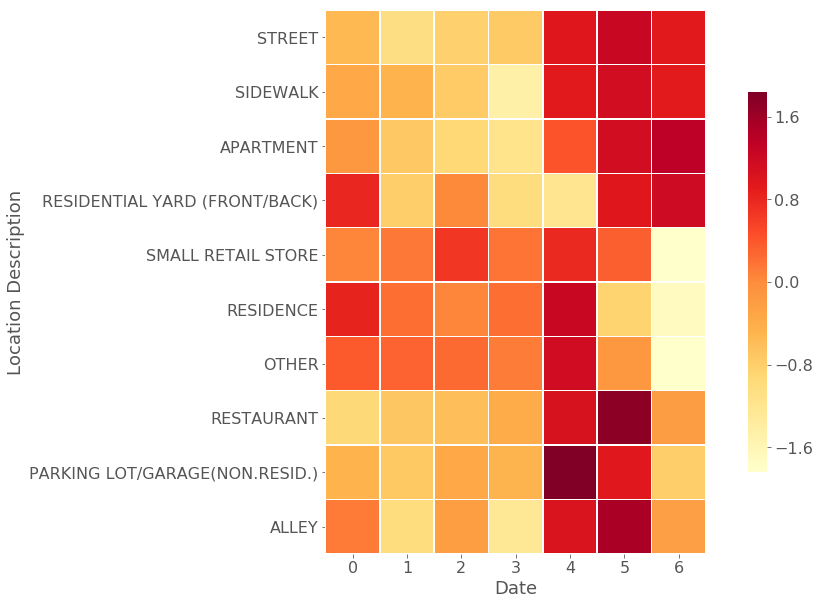

In [100]:
dayofweek_by_location = custom_functions.create_data(after_filter, kind = "dayofweek_by_location")
plt.figure(figsize=(15,10))
custom_functions.process_and_plot(dayofweek_by_location, shrink=0.7)
plt.show()

Most of the crimes were happened on Fridays and weekends at ALLEY, PARKING LOT and at a RESTAURANT.

### Arrest

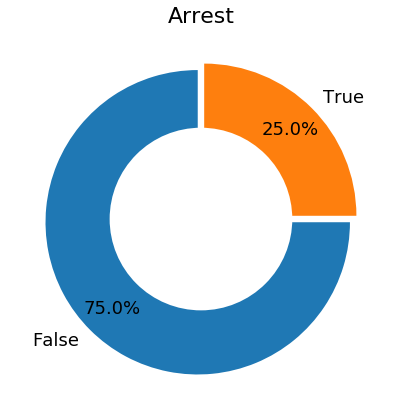

In [101]:
# Series for arrest counts
counts_arrest = crime2010To2019_df["Arrest"].value_counts()

custom_functions.donut_chart(counts_arrest, "Arrest")

In [102]:
crime2010To2019_df.index = crime2010To2019_df["Date"]
arrest_yearly = crime2010To2019_df[crime2010To2019_df['Arrest'] == True]['Arrest']

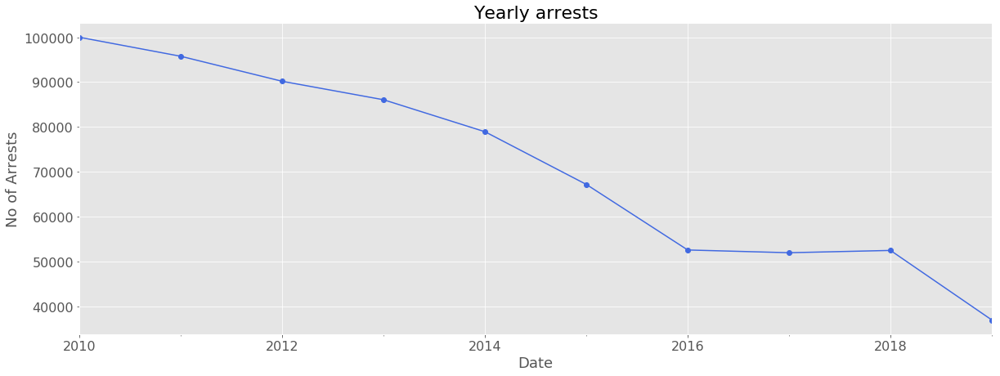

In [103]:
# yearly arrest
plt.figure(figsize=(20, 7))
arrest_yearly.resample('Y').count().plot(color = "royalblue", marker = "o")
plt.title('Yearly arrests')
plt.xlabel("Date")
plt.ylabel("No of Arrests")
plt.show()

Decreasing trend upto year 2016, from 2016 to 2018 arrest rates are nearly the same. In 2019 arrest rates were low as we took data upto september month.

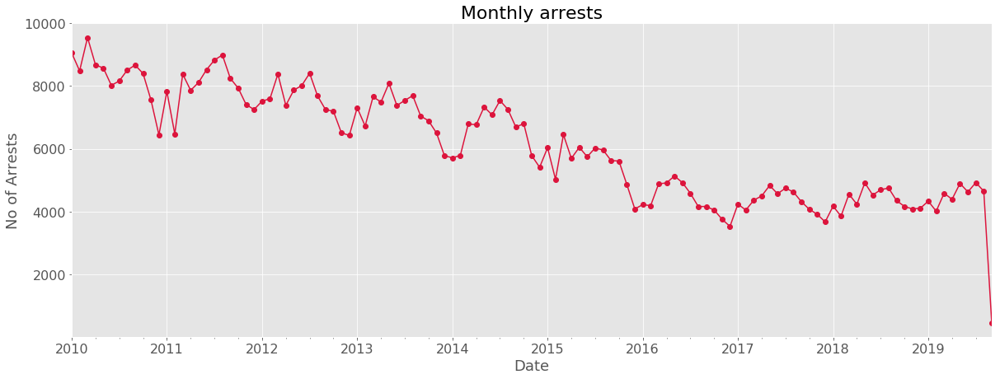

In [104]:
# Monthly arrest
plt.figure(figsize=(20, 7))
arrest_yearly.resample('M').count().plot(color = "crimson", marker = "o")
plt.title('Monthly arrests')
plt.xlabel("Date")
plt.ylabel("No of Arrests")
plt.show()

We can see that there is a decreasing trend, but we can see that there is similar pattern for each year upto year 2016.

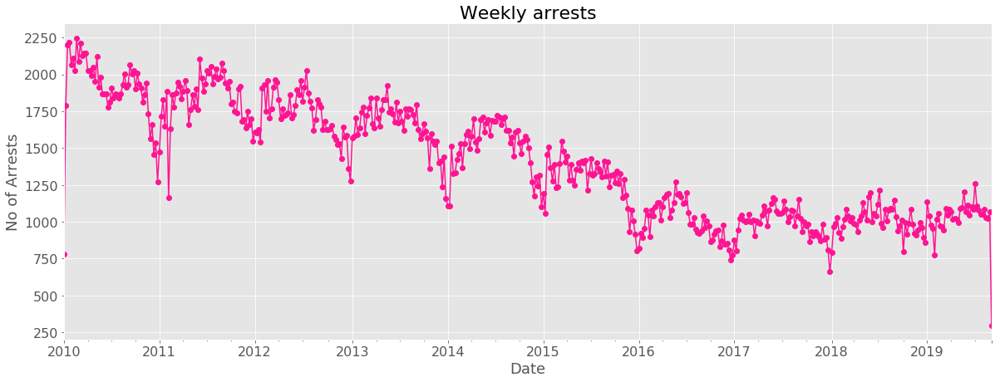

In [105]:
# Weekly arrest
plt.figure(figsize=(20, 7))
arrest_yearly.resample('W').count().plot(color = "deeppink", marker = "o")
plt.title('Weekly arrests')
plt.xlabel("Date")
plt.ylabel("No of Arrests")
plt.show()

We can clearly see decreasing trend in the weekly arrest rates.

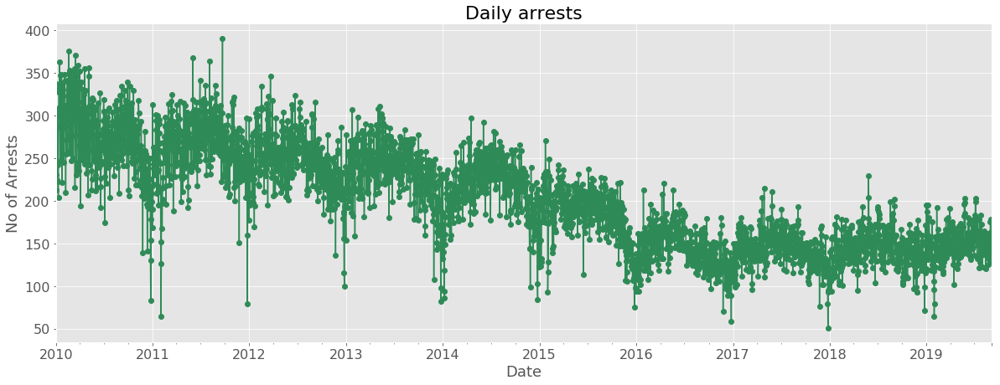

In [106]:
# daily arrest
plt.figure(figsize=(20, 7))
arrest_yearly.resample('D').count().plot(color = "seagreen", marker = "o")
plt.title('Daily arrests')
plt.xlabel("Date")
plt.ylabel("No of Arrests")
plt.show()

### Domestic

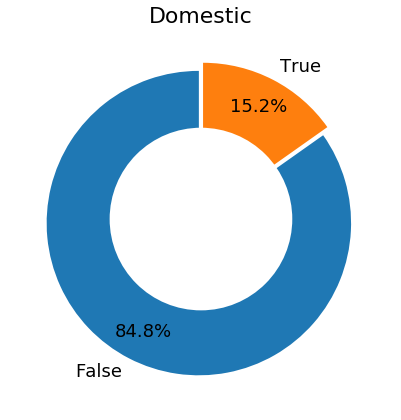

In [107]:
# Series for arrest counts
counts_domestic = crime2010To2019_df["Domestic"].value_counts()

custom_functions.donut_chart(counts_domestic, "Domestic")

In [108]:
domestic_yearly = crime2010To2019_df[crime2010To2019_df['Domestic'] == True]['Domestic']

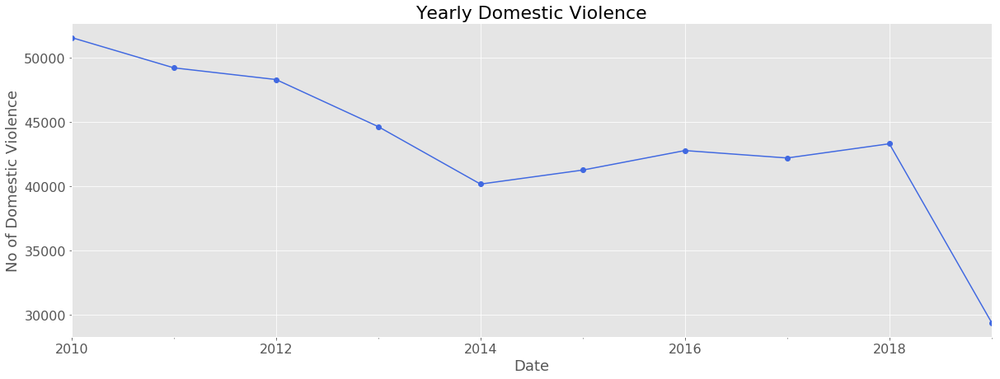

In [109]:
# yearly Domestic
plt.figure(figsize = (20, 7))
domestic_yearly.resample('Y').count().plot(color = "royalblue", marker = "o")
plt.title('Yearly Domestic Violence')
plt.xlabel("Date")
plt.ylabel("No of Domestic Violence")
plt.show()

Domestic violence rates are going down till year 2014, after that rates are increasing upto year 2018.

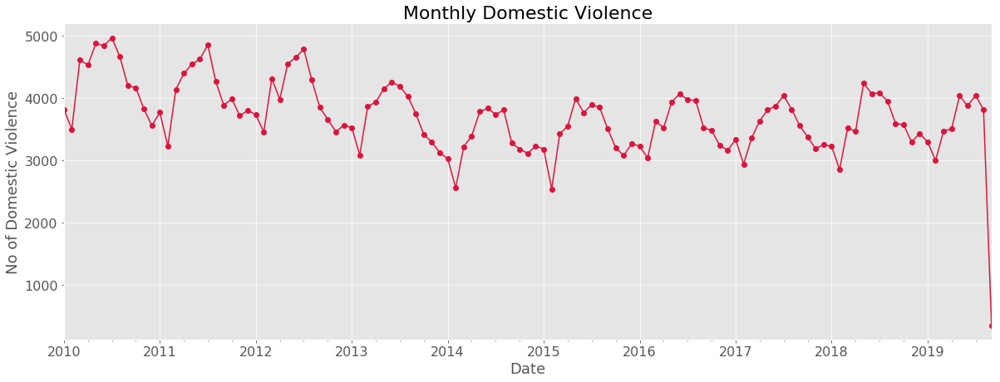

In [110]:
# Monthly Domestic
plt.figure(figsize = (20, 7))
domestic_yearly.resample('M').count().plot(color = "crimson", marker = "o")
plt.title('Monthly Domestic Violence')
plt.xlabel("Date")
plt.ylabel("No of Domestic Violence")
plt.show()

Monthly domestic violence seem somewhat constant throughout this decade.

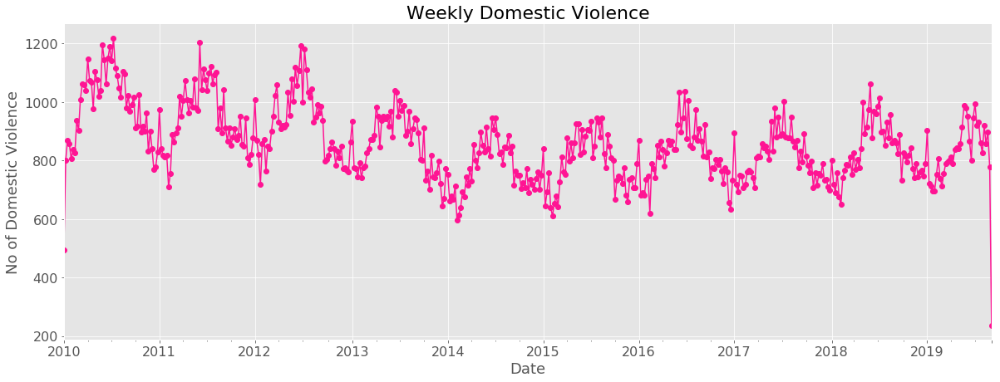

In [111]:
# Weekly domestic
plt.figure(figsize=(20, 7))
domestic_yearly.resample('W').count().plot(color = "deeppink", marker = "o")
plt.title('Weekly Domestic Violence')
plt.xlabel("Date")
plt.ylabel("No of Domestic Violence")
plt.show()

Weekly domestic violence seem somewhat constant throughout this decade.

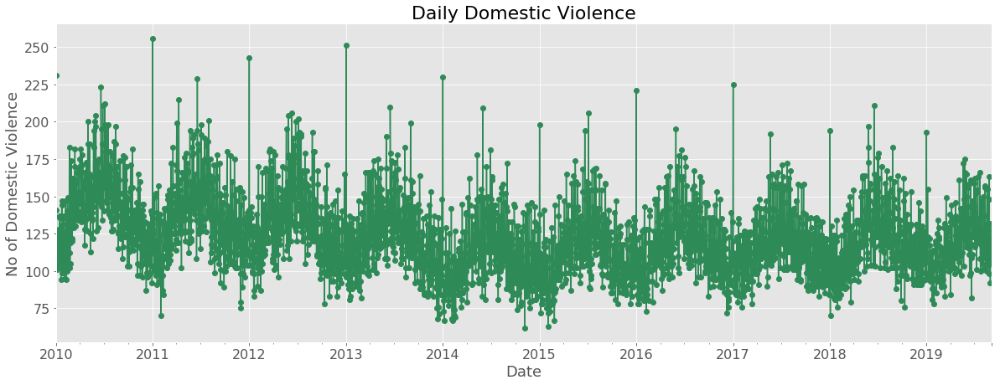

In [112]:
# daily domestic
plt.figure(figsize=(20, 7))
domestic_yearly.resample('D').count().plot(color = "seagreen", marker = "o")
plt.title('Daily Domestic Violence')
plt.xlabel("Date")
plt.ylabel("No of Domestic Violence")
plt.show()

#### Location and Crimes on MAP

In [113]:
location = []

for lat, long in zip(crime2010To2019_df["Latitude"], crime2010To2019_df["Longitude"]):
    location.append(str(lat) + ',' + str(long))

location_df = pd.DataFrame({"location_coord" : location})

frequent_loc = location_df["location_coord"].value_counts()

location_df = pd.DataFrame({"Raw_String" : frequent_loc.index, "ValueCount":frequent_loc})
location_df.index = range(len(frequent_loc))

In [114]:
location_df.head()

,Raw_String,ValueCount
0,"41.883500186999996,-87.627876698",4213
1,"41.754592961,-87.74152853700001",3644
2,"41.897895128,-87.624096605",2717
3,"41.979006297,-87.906463155",2245
4,"41.909664252,-87.742728815",2103


In [117]:
map_crime = folium.Map(location = [41.895140898, -87.624255632],
                        zoom_start = 13,
                        tiles = "CartoDB dark_matter")

for i in range(500):
    loc_str = location_df["Raw_String"].iloc[i]
    lat,long = [float(i) for i in loc_str.split(",")]
    counts = location_df['ValueCount'].iloc[i]
    radius = counts / 40
    
    
    if counts > 1000:
        color = "#FF4500"
    else:
        color = "#008080"
    
    popup_text = """Latitude : {}<br>Longitude : {}<br>Criminal Incidents : {}<br>"""
    popup_text = popup_text.format(lat, long, counts)
    folium.CircleMarker(location = [lat, long], popup = popup_text, radius = radius, 
                        color = color, fill = True).add_to(map_crime)

In [118]:
map_crime

#### Saving train, validation and test dataframes

In [119]:
training_df.to_csv("training.csv", index = False)
validate_df.to_csv("validate.csv", index = False)
testing_df.to_csv("testing.csv", index = False)

## 3 Modelling

### 3.1 Making 'Arrest' as the label variable in all the three datasets

In [120]:
#Training data preprocessing

training_df['Year']                 = training_df['Year'].astype("category").cat.codes

training_df['Month']                = training_df['Month'].astype("category").cat.codes

training_df['Week']                 = training_df['Week'].astype("category").cat.codes

training_df['Hour']                 = training_df['Hour'].astype("category").cat.codes


#Validation data preprocessing

validate_df['Year']                 = validate_df['Year'].astype("category").cat.codes

validate_df['Month']                = validate_df['Month'].astype("category").cat.codes

validate_df['Week']                 = validate_df['Week'].astype("category").cat.codes

validate_df['Hour']                 = validate_df['Hour'].astype("category").cat.codes

#Testing data preprocessing

testing_df['Year']                 = testing_df['Year'].astype("category").cat.codes

testing_df['Month']                = testing_df['Month'].astype("category").cat.codes

testing_df['Week']                 = testing_df['Week'].astype("category").cat.codes

testing_df['Hour']                 = testing_df['Hour'].astype("category").cat.codes

In [121]:
X_train    = training_df.loc[:,['Primary_Type_Codes','Description_Codes','Location_Desctiption_Codes', 
                             'Domestic_Codes', 'District', 'Ward', 
                             'Community Area', 'Latitude', 'Longitude',
                             'Year', 'Month', 'Week', 'Hour']]

y_train    = training_df.loc[:,"Arrest_Codes"]

In [122]:
X_validate = validate_df.loc[:,['Primary_Type_Codes','Description_Codes','Location_Desctiption_Codes',
                                'Domestic_Codes', 'District', 'Ward',
                                'Community Area', 'Latitude', 'Longitude',
                                'Year', 'Month', 'Week', 'Hour']]

y_validate = validate_df.loc[:,"Arrest_Codes"]

In [123]:
X_test     = testing_df.loc[:,["Primary_Type_Codes",'Description_Codes','Location_Desctiption_Codes',
                           'Domestic_Codes', 'District', 'Ward',
                           'Community Area', 'Latitude', 'Longitude',
                           'Year', 'Month', 'Week', 'Hour']]

y_test     = testing_df.loc[:,"Arrest_Codes"]

In [124]:
##Logistic Regression Algorithm

lr = LogisticRegression(random_state=23)
lr.fit(X_train, y_train)

C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=23, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [125]:
y_predLR_train = lr.predict(X_train)
y_predLR_val   = lr.predict(X_validate)

In [126]:
print("Logistic Regression Trial 1\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predLR_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predLR_val,   y_validate))

Logistic Regression Trial 1

Accuracy of Training Dataset:	 0.7510038186490319
Accuracy of Validation Dataset:	 0.750299765980643


In [127]:
#Enhancing parameters of the model

lr_temp1 = LogisticRegression(random_state=23, solver='lbfgs',multi_class = 'ovr')

lr_temp1.fit(X_train, y_train)

C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr',
          n_jobs=None, penalty='l2', random_state=23, solver='lbfgs',
          tol=0.0001, verbose=0, warm_start=False)

In [128]:
y_predLR_train = lr_temp1.predict(X_train)
y_predLR_val   = lr_temp1.predict(X_validate)

In [129]:
print("Logistic Regression Trial 2\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predLR_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predLR_val,   y_validate))

Logistic Regression Trial 2

Accuracy of Training Dataset:	 0.7509862627950825
Accuracy of Validation Dataset:	 0.7502874768921246


In [130]:
#Enhancing parameters of the model

lr_temp2 = LogisticRegression(random_state=23, solver='saga',multi_class = 'ovr',penalty = 'l2')

lr_temp2.fit(X_train, y_train)

C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\sag.py:334: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr',
          n_jobs=None, penalty='l2', random_state=23, solver='saga',
          tol=0.0001, verbose=0, warm_start=False)

In [131]:
y_predLR_train = lr_temp2.predict(X_train)
y_predLR_val   = lr_temp2.predict(X_validate)

In [132]:
print("Logistic Regression Trial 3\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predLR_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predLR_val,   y_validate))

Logistic Regression Trial 3

Accuracy of Training Dataset:	 0.750955665449628
Accuracy of Validation Dataset:	 0.7502664098832361


In [133]:
#Selecting Model lr_temp1 as best model due to accuracy score

y_predLR_train = lr_temp1.predict(X_train)
y_predLR_val   = lr_temp1.predict(X_validate)
y_predLR_test   = lr_temp1.predict(X_test)

print("Logistic Regression final model\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predLR_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predLR_val,   y_validate))
print("Accuracy of Testing Dataset:\t",    accuracy_score(y_predLR_test,  y_test))

Logistic Regression final model

Accuracy of Training Dataset:	 0.7509862627950825
Accuracy of Validation Dataset:	 0.7502874768921246
Accuracy of Testing Dataset:	 0.7504371396670014


In [134]:
print("Confusion matrix")

print(confusion_matrix(y_predLR_test, y_test))

Confusion matrix
[[213391  70939]
 [   138    338]]


In [135]:
#RFE feature elimination

rfe_log_model = LogisticRegression()

rfe = RFE(estimator = rfe_log_model, n_features_to_select = 5, step = 1)

rfe.fit(X_train, y_train)

C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to

RFE(estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False),
  n_features_to_select=5, step=1, verbose=0)

In [136]:
y_predRFE_train = rfe.predict(X_train)
y_predRFE_val   = rfe.predict(X_validate)
y_predRFE_test   = rfe.predict(X_test)

print("Logistic Regression RFE \n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predRFE_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predRFE_val,   y_validate))
print("Accuracy of Testing Dataset:\t",    accuracy_score(y_predRFE_test,  y_test))

Logistic Regression RFE 

Accuracy of Training Dataset:	 0.7502373802251864
Accuracy of Validation Dataset:	 0.7494781526339905
Accuracy of Testing Dataset:	 0.749734907270212


In [137]:
print(rfe.support_)

print(X_train.columns[rfe.support_])

[False False False  True False False False  True  True  True False False
  True]
Index(['Domestic_Codes', 'Latitude', 'Longitude', 'Year', 'Hour'], dtype='object')


C:\Users\bharath\Anaconda3\lib\site-packages\scikitplot\plotters.py:37: DeprecationWarning: This module was deprecated in version 0.3.0 and its functions are spread throughout different modules. Please check the documentation and update your function calls as soon as possible. This module will be removed in 0.4.0
  DeprecationWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=DeprecationWarning)


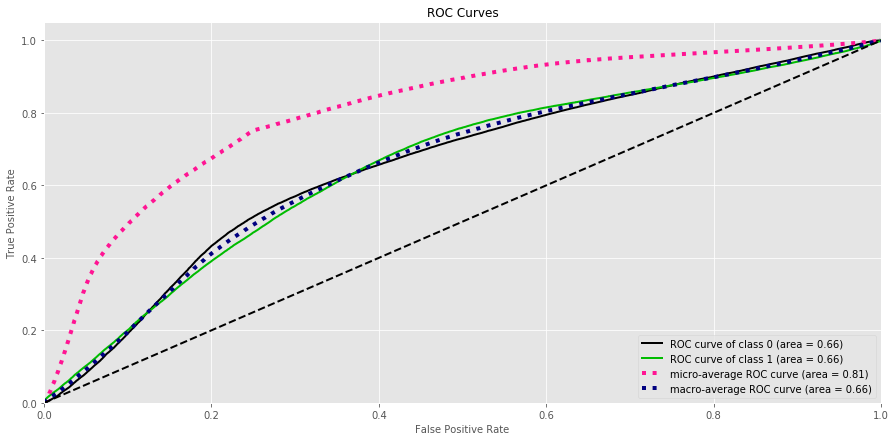

In [138]:
import scikitplot as skplt
import matplotlib.pyplot as plt
y_true = y_test
y_probas = lr_temp1.predict_proba(X_test)
skplt.metrics.plot_roc_curve(y_true, y_probas)
plt.show()

In [139]:
#Random Forest Model

rf = RandomForestClassifier(random_state=23)

rf.fit(X_train, y_train)

C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=23, verbose=0, warm_start=False)

In [140]:
y_predRF_train = rf.predict(X_train)
y_predRF_val   = rf.predict(X_validate)

In [141]:
print("Random Forest Classifier Trial 1\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predRF_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predRF_val,   y_validate))

Random Forest Classifier Trial 1

Accuracy of Training Dataset:	 0.9866781164274138
Accuracy of Validation Dataset:	 0.8870825879415952


In [142]:
#Enhancing Random Forest Model

rf_tmp1 = RandomForestClassifier(n_estimators = 100,max_depth = 2,random_state =23)

rf_tmp1.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=2, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=23, verbose=0, warm_start=False)

In [143]:
y_predRF_train = rf_tmp1.predict(X_train)
y_predRF_val   = rf_tmp1.predict(X_validate)

In [144]:
print("Random Forest Classifier Trial 2\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predRF_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predRF_val,   y_validate))

Random Forest Classifier Trial 2

Accuracy of Training Dataset:	 0.7502373802251864
Accuracy of Validation Dataset:	 0.7494781526339905


In [145]:
#Enhancing Random Forest Model

rf_tmp2 = RandomForestClassifier(n_estimators = 100,max_depth = 8,random_state =23)

rf_tmp2.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=8, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=23, verbose=0, warm_start=False)

In [146]:
y_predRF_train = rf_tmp2.predict(X_train)
y_predRF_val   = rf_tmp2.predict(X_validate)

In [147]:
print("Random Forest Classifier Trial 3\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predRF_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predRF_val,   y_validate))

Random Forest Classifier Trial 3

Accuracy of Training Dataset:	 0.8771180510795095
Accuracy of Validation Dataset:	 0.8771459820825089


In [148]:
#Selecting Model rf_tmp2 as best model due to accuracy score

y_predRF_train = rf_tmp2.predict(X_train)
y_predRF_val   = rf_tmp2.predict(X_validate)
y_predRF_test   = rf_tmp2.predict(X_test)

print("Random Forest Classifier\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predRF_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predRF_val,   y_validate))
print("Accuracy of Testing Dataset:\t",    accuracy_score(y_predRF_test,  y_test))

Random Forest Classifier

Accuracy of Training Dataset:	 0.8771180510795095
Accuracy of Validation Dataset:	 0.8771459820825089
Accuracy of Testing Dataset:	 0.877053151970113


In [149]:
print("Confusion matrix")

print(confusion_matrix(y_predRF_test, y_test))

Confusion matrix
[[209538  31025]
 [  3991  40252]]


Text(0.5, 1.0, 'Feature importance plot')

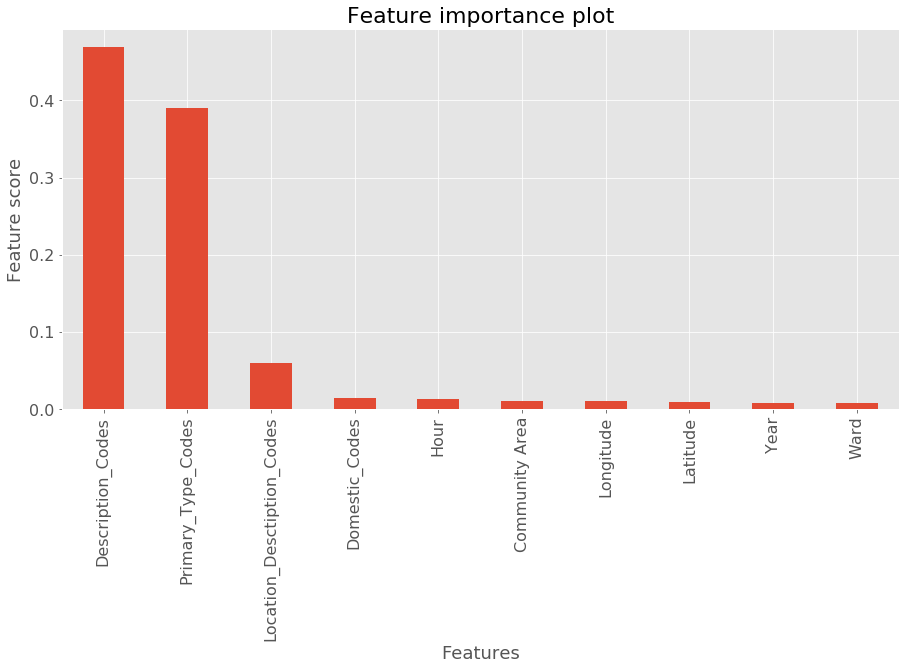

In [150]:
#Plotting feature importance plot:

(pd.Series(rf_tmp2.feature_importances_, index=X_train.columns)
   .nlargest(10)
   .plot(kind='bar')) 

plt.xlabel("Features")

plt.ylabel("Feature score")

plt.title("Feature importance plot")

In [151]:
##Naive Baye's Classifier Algorithm 

nb = GaussianNB()

nb.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [152]:
y_predNB_train = nb.predict(X_train)
y_predNB_val   = nb.predict(X_validate)
y_predNB_test  = nb.predict(X_test)

In [153]:
print("Naive Baye's Classifier\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predNB_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predNB_val,   y_validate))
print("Accuracy of Testing Dataset:\t",    accuracy_score(y_predNB_test,  y_test))

Naive Baye's Classifier

Accuracy of Training Dataset:	 0.7715511901113392
Accuracy of Validation Dataset:	 0.7708418552310261
Accuracy of Testing Dataset:	 0.77131450882355


In [154]:
print("Confusion matrix")

print(confusion_matrix(y_predNB_test, y_test))

Confusion matrix
[[205139  56741]
 [  8390  14536]]


In [155]:
##Neural Networks - MLP Classifier Algorithm

mlp = MLPClassifier(random_state=23)

mlp.fit(X_train, y_train)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=23, shuffle=True, solver='adam', tol=0.0001,
       validation_fraction=0.1, verbose=False, warm_start=False)

In [156]:
y_predNN_train = mlp.predict(X_train)
y_predNN_val   = mlp.predict(X_validate)
y_predNN_test  = mlp.predict(X_test)

In [157]:
print("Multilayer Perceptron Classifier\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predNN_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predNN_val,   y_validate))
print("Accuracy of Testing Dataset:\t",    accuracy_score(y_predNN_test,  y_test))

Multilayer Perceptron Classifier

Accuracy of Training Dataset:	 0.8755600944404623
Accuracy of Validation Dataset:	 0.8759398958236411
Accuracy of Testing Dataset:	 0.8757540220360526


In [158]:
model  = ['Logistic Regression', 'Random Forest', "Naive Baye's", 'Neural Network']

trAcc  = [accuracy_score(y_predLR_train, y_train), accuracy_score(y_predRF_train, y_train),
          accuracy_score(y_predNB_train, y_train), accuracy_score(y_predNN_train, y_train)]

valAcc = [accuracy_score(y_predLR_val,   y_validate), accuracy_score(y_predRF_val,   y_validate),
          accuracy_score(y_predNB_val,   y_validate), accuracy_score(y_predNN_val,   y_validate)]

tesAcc = [accuracy_score(y_predLR_test,  y_test), accuracy_score(y_predRF_test,  y_test),
          accuracy_score(y_predNB_test,  y_test), accuracy_score(y_predNN_test,  y_test)]

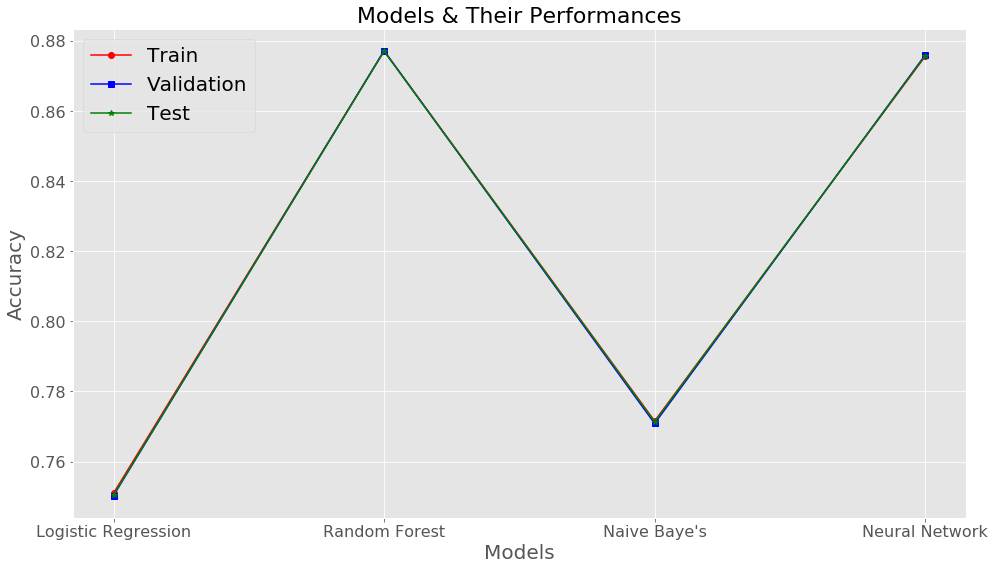

In [159]:
plt.figure(figsize = (16, 9))

plt.plot(model, trAcc,  "o-",  label = "Train",      color = "red")
plt.plot(model, valAcc, "s-",  label = "Validation", color = "blue")
plt.plot(model, tesAcc, "*-",  label = "Test",       color = "green")

plt.legend(fontsize=20)

plt.xlabel("Models", fontsize = 20)
plt.ylabel("Accuracy", fontsize = 20)
plt.title("Models & Their Performances", fontsize = 22)

plt.show()

### 3.2 District as an outcome variable¶

In [160]:
import pandas as pd
training_df = pd.read_csv("training.csv")
validate_df = pd.read_csv("validate.csv")
testing_df = pd.read_csv("testing.csv")

In [161]:
#Dividing the columns to create Independednt and Predictor variables

X_train = training_df.loc[:,['Primary_Type_Codes','Location_Desctiption_Codes', 'Arrest_Codes', 'Domestic_Codes', 'Beat',
                             'Ward', 'Community Area', 'Latitude', 'Longitude']]

y_train = training_df.loc[:,'District']

X_validate = validate_df.loc[:,['Primary_Type_Codes','Location_Desctiption_Codes', 'Arrest_Codes', 'Domestic_Codes', 'Beat',
                             'Ward', 'Community Area', 'Latitude', 'Longitude']]

y_validate = validate_df.loc[:,'District']

X_test = testing_df.loc[:,['Primary_Type_Codes','Location_Desctiption_Codes', 'Arrest_Codes', 'Domestic_Codes', 'Beat',
                             'Ward', 'Community Area', 'Latitude', 'Longitude']]

y_test = testing_df.loc[:,'District']

In [162]:
##Logistic Regression Algorithm

lr = LogisticRegression(random_state=23)
lr.fit(X_train, y_train)

C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=23, solver='warn',
          tol=0.0001, verbose=0, warm_start=False)

In [163]:
y_predLR_train = lr.predict(X_train)
y_predLR_val   = lr.predict(X_validate)

In [164]:
print("Logistic Regression Trail 1\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predLR_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predLR_val,   y_validate))

Logistic Regression Trail 1

Accuracy of Training Dataset:	 0.5584045641207501
Accuracy of Validation Dataset:	 0.5584565607054639


In [165]:
#Enhancing parameters of the model

lr_temp1 = LogisticRegression(random_state=23, solver='lbfgs',multi_class = 'ovr')

lr_temp1.fit(X_train, y_train)

C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", ConvergenceWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:758: ConvergenceWarning: lbfgs failed to converge. Increase the number of iterations.
  "of iterations.", 

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr',
          n_jobs=None, penalty='l2', random_state=23, solver='lbfgs',
          tol=0.0001, verbose=0, warm_start=False)

In [166]:
y_predLR_train = lr_temp1.predict(X_train)
y_predLR_val   = lr_temp1.predict(X_validate)

In [167]:
print("Logistic Regression Trail 2\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predLR_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predLR_val,   y_validate))

Logistic Regression Trail 2

Accuracy of Training Dataset:	 0.5145314819096957
Accuracy of Validation Dataset:	 0.513759390180316


In [168]:
#Enhancing parameters of the model

lr_temp2 = LogisticRegression(random_state=23, solver='saga',multi_class = 'ovr',penalty = 'l2')

lr_temp2.fit(X_train, y_train)

C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\sag.py:334: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr',
          n_jobs=None, penalty='l2', random_state=23, solver='saga',
          tol=0.0001, verbose=0, warm_start=False)

In [169]:
y_predLR_train = lr_temp2.predict(X_train)
y_predLR_val   = lr_temp2.predict(X_validate)

In [170]:
print("Logistic Regression Trail 3\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predLR_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predLR_val,   y_validate))

Logistic Regression Trail 3

Accuracy of Training Dataset:	 0.523472929124008
Accuracy of Validation Dataset:	 0.5233396124723715


In [171]:
#Selecting Model lr_temp1 as best model due to accuracy score

y_predLR_train = lr_temp1.predict(X_train)
y_predLR_val   = lr_temp1.predict(X_validate)
y_predLR_test   = lr_temp1.predict(X_test)

print("Logistic Regression final model\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predLR_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predLR_val,   y_validate))
print("Accuracy of Testing Dataset:\t",    accuracy_score(y_predLR_test,  y_test))

Logistic Regression final model

Accuracy of Training Dataset:	 0.5145314819096957
Accuracy of Validation Dataset:	 0.513759390180316
Accuracy of Testing Dataset:	 0.5145537664234602


In [172]:
print("Confusion matrix")

print(confusion_matrix(y_predLR_test, y_test))

Confusion matrix
[[12175   460     0     0     0     0     0     1     0     0     0     5
      0     0     0     0     5     0     0     0     0     0     0]
 [    1  4073  1260   669     0  1110     0     1   171     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [   24  2427  5557   282     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [   51  3597  5249 14463  7211  4350     0     3     9     0     0     0
      0     0     0     0     0     0     0     1     0     0     0]
 [    0   327  2035   104  4668  1057    65   743   160     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0     0     0   805   647   624   273  1592   905     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0     0    13     6     0  9063  9620  3189     0     0     0     0
      0     0     0     0     0     0     0     1  

In [173]:
#RFE feature elimination

model = LogisticRegression()

rfe = RFE(estimator = model, n_features_to_select = 5, step = 1)

rfe.fit(X_train, y_train)

C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: 

RFE(estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False),
  n_features_to_select=5, step=1, verbose=0)

In [174]:
y_pred = rfe.predict(X_test)

print("Test accuracy: ",accuracy_score(y_test, y_pred))

print("Confusion matrix")

print(confusion_matrix(y_pred,y_test))

Test accuracy:  0.48295681972992144
Confusion matrix
[[ 8943     0     0     0     0     0     0     0    11     0     0   282
   1437     0     6  1177    12     0     0     0     0     0     0]
 [  184     0     0     0     0     0     0     0     0     0     0    28
      0     0     0     0     0     0     0     0     0     0     0]
 [   87  2014   341    80     0     0     0     5   329     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0  3232  7789 12990   303  3794     0    23   509     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0     0     2   633 12308  2536     0    52     0     0     0     0
      0     0     0     0     0     0     0   865     0     0     0]
 [    0     0     0   637     0     0     0  1463   179     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0    92  3346     6     0  4494  9914  3083  3153     0     0     0
      0     0  

In [175]:
print(rfe.support_)

print(X_train.columns[rfe.support_])

[False False  True  True False False  True  True  True]
Index(['Arrest_Codes', 'Domestic_Codes', 'Community Area', 'Latitude',
       'Longitude'],
      dtype='object')


C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:77: DeprecationWarning: Function plot_roc_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_roc instead.
  warnings.warn(msg, category=DeprecationWarning)


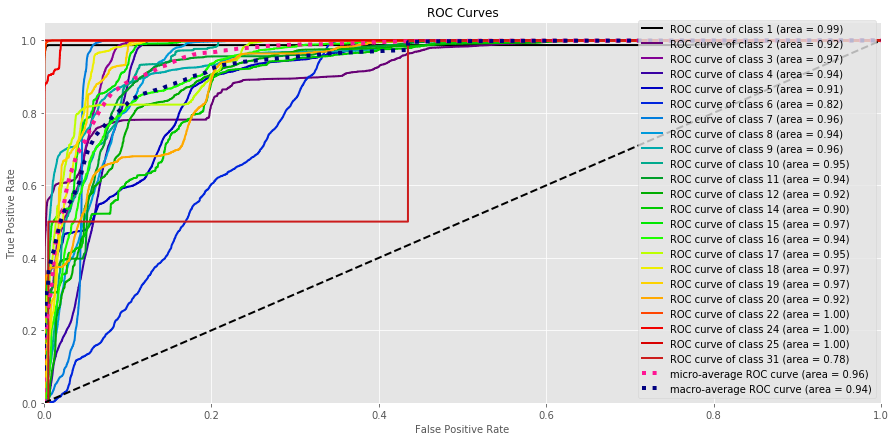

In [176]:

import scikitplot as skplt
import matplotlib.pyplot as plt
y_true = y_test
y_probas = lr_temp1.predict_proba(X_test)
skplt.metrics.plot_roc_curve(y_true, y_probas)
plt.show()

In [177]:
#Random Forest Model

rf = RandomForestClassifier(random_state=23)

rf.fit(X_train, y_train)

C:\Users\bharath\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=23, verbose=0, warm_start=False)

In [178]:
y_predRF_train = rf.predict(X_train)
y_predRF_val   = rf.predict(X_validate)

In [179]:
print("Random Forest Classifier\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predRF_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predRF_val,   y_validate))

Random Forest Classifier

Accuracy of Training Dataset:	 0.9999894664876304
Accuracy of Validation Dataset:	 0.9999490880618528


In [180]:
#Enhancing Random Forest Model

rf_tmp1 = RandomForestClassifier(n_estimators = 100,max_depth = 2,random_state =23)

rf_tmp1.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=2, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=23, verbose=0, warm_start=False)

In [181]:
y_predRF_train = rf_tmp1.predict(X_train)
y_predRF_val   = rf_tmp1.predict(X_validate)

In [182]:
print("Random Forest Classifier\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predRF_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predRF_val,   y_validate))

Random Forest Classifier

Accuracy of Training Dataset:	 0.5177582478655843
Accuracy of Validation Dataset:	 0.517751588364691


In [183]:
#Enhancing Random Forest Model

rf_tmp2 = RandomForestClassifier(n_estimators = 100,max_depth = 8,random_state =23)

rf_tmp2.fit(X_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=8, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=23, verbose=0, warm_start=False)

In [184]:
y_predRF_train = rf_tmp2.predict(X_train)
y_predRF_val   = rf_tmp2.predict(X_validate)

In [185]:
print("Random Forest Classifier\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predRF_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predRF_val,   y_validate))

Random Forest Classifier

Accuracy of Training Dataset:	 0.9995154584309982
Accuracy of Validation Dataset:	 0.9995435481407486


In [186]:
#Selecting Model lr_temp1 as best model due to accuracy score

y_predRF_train = rf_tmp2.predict(X_train)
y_predRF_val   = rf_tmp2.predict(X_validate)
y_predRF_test   = rf_tmp2.predict(X_test)

print("Random Forest Classifier\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predRF_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predRF_val,   y_validate))
print("Accuracy of Testing Dataset:\t",    accuracy_score(y_predRF_test,  y_test))

Random Forest Classifier

Accuracy of Training Dataset:	 0.9995154584309982
Accuracy of Validation Dataset:	 0.9995435481407486
Accuracy of Testing Dataset:	 0.9995400377801029


In [187]:
print("Confusion matrix")

print(confusion_matrix(y_predRF_test, y_test))

Confusion matrix
[[12405     0     0     0     0     0     0     0     0     0     0     5
      0     0     0     0     5     0     0     0     0     0     0]
 [    5 12120     0     0     0     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0     8 14211     0     0     0     0     2     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0     0     0 16335     0     0     0     1     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0     0     0     0 12611     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0     0     0     0     0 17248     0     0     0     0     0     0
      0     0     0     0     0     0     0     1     0     0     0]
 [    0     0     4     0     0     0 16423     0     0     0     0     0
      0     0     0     0     0     0     0     0  

Text(0.5, 1.0, 'Feature importance plot')

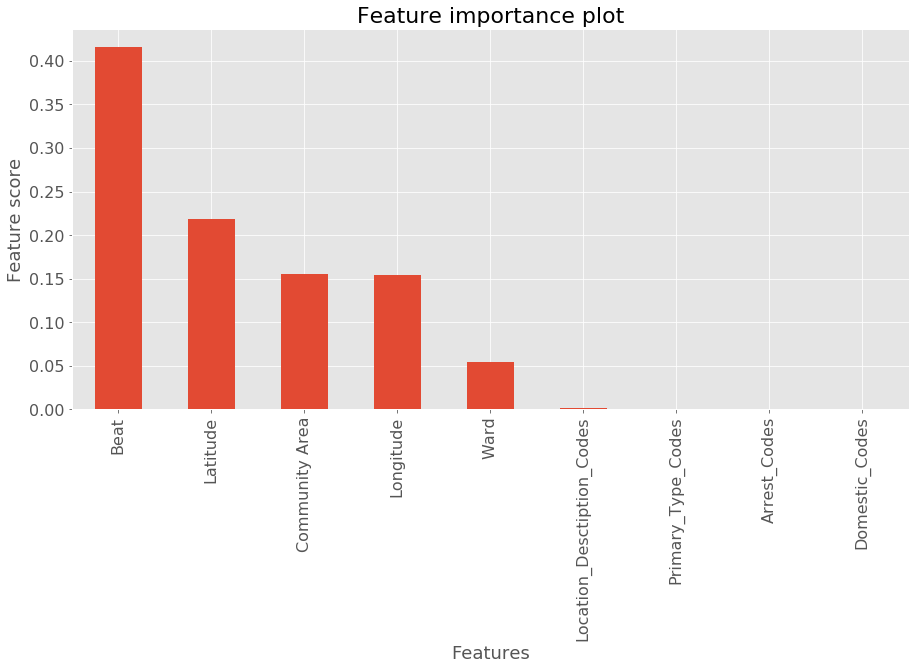

In [188]:
#Plotting feature importance plot:

(pd.Series(rf_tmp2.feature_importances_, index=X_train.columns)
   .nlargest(10)
   .plot(kind='bar')) 

plt.xlabel("Features")

plt.ylabel("Feature score")

plt.title("Feature importance plot")

In [189]:
##Naive Baye's Classifier Algorithm 

nb = GaussianNB()

nb.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [190]:
y_predNB_train = nb.predict(X_train)
y_predNB_val   = nb.predict(X_validate)
y_predNB_test  = nb.predict(X_test)

In [191]:
print("Naive Baye's Classifier\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predNB_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predNB_val,   y_validate))
print("Accuracy of Testing Dataset:\t",    accuracy_score(y_predNB_test,  y_test))

Naive Baye's Classifier

Accuracy of Training Dataset:	 0.9797957200834455
Accuracy of Validation Dataset:	 0.9798441392459064
Accuracy of Testing Dataset:	 0.979473747041846


In [192]:
print("Confusion matrix")

print(confusion_matrix(y_predNB_test, y_test))

Confusion matrix
[[11480     6     0     0     0     0     0     0   364     0     0     5
      0     0     0     0     5     0     0     0     0     0     0]
 [  931 12035     0     0     0     0     0     0  1509     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0    44 14199     1     0     0     0     2     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0     0     0 16329     0     0     0     2     0     0     0     0
      0     0     0     0     0     0     0     1     0     0     0]
 [    0     0     0     0 12611     0     0     0     0     0     0     0
      0     0     0     0     0     0     0     0     0     0     0]
 [    0     0     0     0     0 17248     0     0     0     0     0     0
      0     0     0     0     0     0     0     1     0     0     0]
 [    0     0    16     0     0     0 16423     0     0     0     0     0
      0     0     0     0     0     0     0     0  

In [193]:
##Neural Networks - MLP Classifier Algorithm

mlp = MLPClassifier(random_state=23)

mlp.fit(X_train, y_train)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=23, shuffle=True, solver='adam', tol=0.0001,
       validation_fraction=0.1, verbose=False, warm_start=False)

In [194]:
y_predNN_train = mlp.predict(X_train)
y_predNN_val   = mlp.predict(X_validate)
y_predNN_test  = mlp.predict(X_test)

In [195]:
print("Multilayer Perceptron Classifier\n")
print("Accuracy of Training Dataset:\t",   accuracy_score(y_predNN_train, y_train))
print("Accuracy of Validation Dataset:\t", accuracy_score(y_predNN_val,   y_validate))
print("Accuracy of Testing Dataset:\t",    accuracy_score(y_predNN_test,  y_test))

Multilayer Perceptron Classifier

Accuracy of Training Dataset:	 0.9992320567886732
Accuracy of Validation Dataset:	 0.9991766310692736
Accuracy of Testing Dataset:	 0.9992802117932909


In [196]:
model  = ['Logistic Regression', 'Random Forest', "Naive Baye's", 'Neural Network']

trAcc  = [accuracy_score(y_predLR_train, y_train), accuracy_score(y_predRF_train, y_train),
          accuracy_score(y_predNB_train, y_train), accuracy_score(y_predNN_train, y_train)]

valAcc = [accuracy_score(y_predLR_val,   y_validate), accuracy_score(y_predRF_val,   y_validate),
          accuracy_score(y_predNB_val,   y_validate), accuracy_score(y_predNN_val,   y_validate)]

tesAcc = [accuracy_score(y_predLR_test,  y_test), accuracy_score(y_predRF_test,  y_test),
          accuracy_score(y_predNB_test,  y_test), accuracy_score(y_predNN_test,  y_test)]

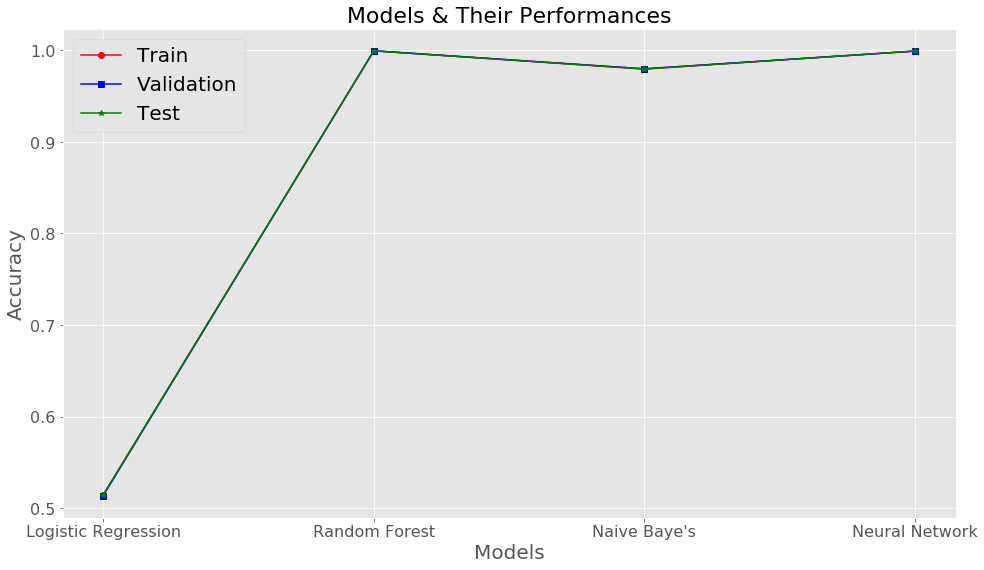

In [197]:
plt.figure(figsize = (16, 9))

plt.plot(model, trAcc,  "o-",  label = "Train",      color = "red")
plt.plot(model, valAcc, "s-",  label = "Validation", color = "blue")
plt.plot(model, tesAcc, "*-",  label = "Test",       color = "green")

plt.legend(fontsize=20)

plt.xlabel("Models", fontsize = 20)
plt.ylabel("Accuracy", fontsize = 20)
plt.title("Models & Their Performances", fontsize = 22)

plt.show()

### 3.3 Time Series Analysis

### What is ARIMA?

In statistics and econometrics, and in particular in time series analysis, an autoregressive integrated moving average (ARIMA) model is a generalization of an autoregressive moving average (ARMA) model. Both of these models are fitted to time series data either to better understand the data or to predict future points in the series (forecasting). ARIMA models are applied in some cases where data show evidence of non-stationarity, where an initial differencing step (corresponding to the "integrated" part of the model) can be applied one or more times to eliminate the non-stationarity.

The AR part of ARIMA indicates that the evolving variable of interest is regressed on its own lagged (i.e., prior) values. The MA part indicates that the regression error is actually a linear combination of error terms whose values occurred contemporaneously and at various times in the past. The I (for "integrated") indicates that the data values have been replaced with the difference between their values and the previous values (and this differencing process may have been performed more than once). The purpose of each of these features is to make the model fit the data as well as possible.

Non-seasonal ARIMA models are generally denoted ARIMA(p,d,q) where parameters p, d, and q are non-negative integers, p is the order (number of time lags) of the autoregressive model, d is the degree of differencing (the number of times the data have had past values subtracted), and q is the order of the moving-average model. 

When two out of the three terms are zeros, the model may be referred to based on the non-zero parameter, dropping "AR", "I" or "MA" from the acronym describing the model. For example, ARIMA (1,0,0) is AR(1), ARIMA(0,1,0) is I(1), and ARIMA(0,0,1) is MA(1).


Source - https://en.wikipedia.org/wiki/Autoregressive_integrated_moving_average 

### Generating data

In [198]:
# Converting Date column to datatime object
crime2010To2019_df["Date"] = pd.to_datetime(crime2010To2019_df["Date"])
crime2010To2019_df.index = crime2010To2019_df["Date"]

# Creating data for time series modeling
day_col = []
total_crimes_day = []
temp_crime_type_day = {}
crime_type_dict_day = {}
unique_crimes = crime2010To2019_df["Primary Type"].unique()


# Creating a dictionary with all the crime types and initializing their count to zero.
for crime in unique_crimes:
    temp_crime_type_day[crime] = 0

# Grouping data by day
grouped_by_day = crime2010To2019_df.groupby(crime2010To2019_df["Date"].dt.date)

# Extracting data for days from grouped by object
for key, item in grouped_by_day:
    
    # Creating a copy of a dictionary
    crime_type = temp_crime_type_day.copy()
    
    # Appending a key to day_col [key = date]
    day_col.append(key)
    
    # Appending total number of crimes by taking number of rows from the dataframe item
    total_crimes_day.append(item.shape[0])
    
    # Looping through primary type of crime in item dataframe
    for crime in item["Primary Type"]:
        
        # Increamenting the crime count
        crime_type[crime] += 1
    
    # Storing the count of the crime by using key to a dictionary
    crime_type_dict_day[key] = crime_type

# Initializing an empty dataframe
arima_df_day = pd.DataFrame()

# Creating a columns of the dataframe
arima_df_day["Date"] = day_col
arima_df_day["Crimes"] = total_crimes_day

# Creating a new dataframe by using dictionary crime_type_dict_day
temp_df_day = pd.DataFrame.from_dict(crime_type_dict_day, orient="index")

# Dropping the index of the dataframe
temp_df_day.reset_index(drop = True, inplace = True)

# Joining the two dataframe.
arima_df_day = arima_df_day.join(temp_df_day)

# Columns which are not important
## Reason - These types of crimes are rarely occuring and have low total count. Model won't be able to learn/traing much 
## and in turn won't able to predict values of these columns accurately.
delete_cols = ['INTERFERENCE WITH PUBLIC OFFICER', 'LIQUOR LAW VIOLATION', 'PROSTITUTION', 'CRIM SEXUAL ASSAULT',
               'INTIMIDATION','SEX OFFENSE', 'CONCEALED CARRY LICENSE VIOLATION', 'HOMICIDE', 'KIDNAPPING', 'ARSON',
               'GAMBLING', 'OFFENSE INVOLVING CHILDREN', 'STALKING', 'OBSCENITY', 'HUMAN TRAFFICKING', 'PUBLIC INDECENCY',
               'OTHER NARCOTIC VIOLATION', 'NON-CRIMINAL', 'NON - CRIMINAL', 'NON-CRIMINAL (SUBJECT SPECIFIED)']

# Dropping the columns
arima_df_day.drop(delete_cols, axis = 1, inplace = True);

## Crimes
Crimes column contains total number of crimes happened on a particulare day.

### Plotting graph(Sequence plot)

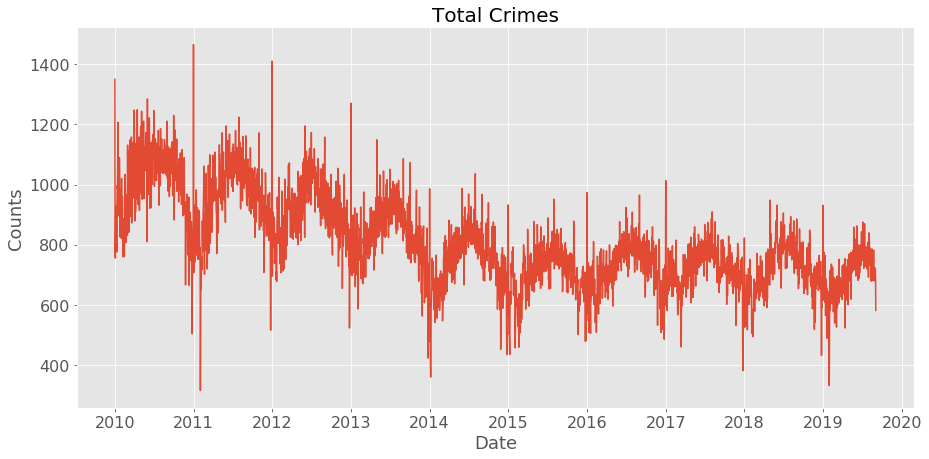

In [199]:
# Plotting a sequence plot
custom_functions.sequence_plot(arima_df_day["Crimes"], arima_df_day["Date"], "Total Crimes")

Before applying Time series model ARIMA we need to check stationarity of the data which can be assessed by assessing following two things.

1. Data should fluctuate around the constant mean/value.
2. Variation of the data must be within a constant band.

If both conditions are true that means data comes from a **stationary process**(that means we can use it to predict and forecast) then only we can fit the ARIMA model to it. For the above graph condition 1 is not true(We can see decreasing trend in the data) but for to start we will fit ARIMA model anyway.

### Plotting ACF and PACF plots to decide the model parameters

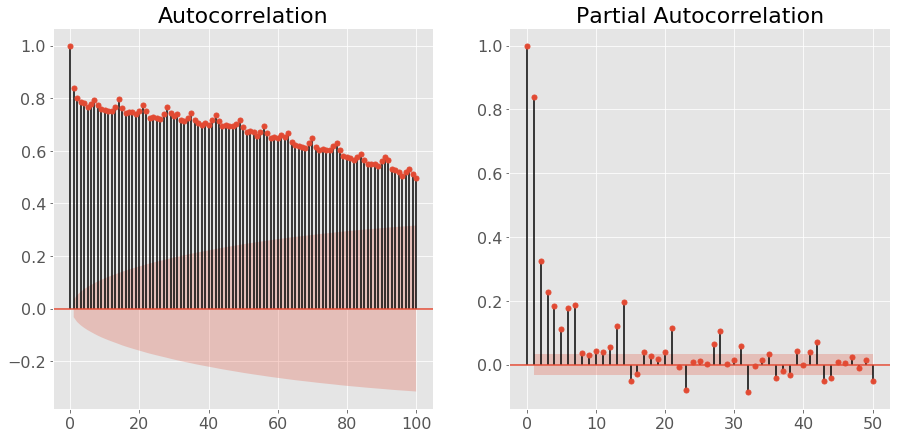

In [200]:
# Plot ACF and PACF plot
custom_functions.plot_ACF_PACF(arima_df_day["Crimes"])

To decide model parameters, We need to look at ACF and PACF plots. 
There are three classic cases.

1. CASE1 - Gradual decrease in ACF and Definite cut off in PACF plot. That suggests AR(Auto Regressive) terms. To decide how many AR(Auto Regressive) terms we need to look at PACF plot and see how many bars are significantly out of confindence interval(red zone).

2. CASE2 - Gradual decrease in PACF and Definite cut off in ACF plot. That suggests MA(Moving Average) terms. To decide how many MA(Moving Average) terms we need to look at ACF plot and see how many bars are significantly out of confindence interval(red zone).

3. CASE3 - Definite cut off in both ACF and PACF plots. That suggests both AR(Auto Regressive) and MA(Moving Average) terms. To decide how many AR(Auto Regressive) terms we need to look at PACF plot and to decide how many MA(Moving Average) terms we need to look at ACF plot and see how many bars are significantly out of confindence interval(red zone).


**Here we can see CASE1 in the above plots.** And 15 lags are outside of the confidence interval in PACF plot.

## Choosing model ARIMA(15, 0, 0)

In [201]:
# Creating training data for the model
series = pd.Series(arima_df_day["Crimes"][:-10])
series.index = arima_df_day["Date"][:-10]

# Fitting an ARIMA model
custom_functions.fit_ARIMA(series, series.index, title = "Crimes", order=(15, 0, 0), print_summary=True);

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:                 Crimes   No. Observations:                 3523
Model:                    ARMA(15, 0)   Log Likelihood              -19819.322
Method:                       css-mle   S.D. of innovations             67.109
Date:                Tue, 05 Nov 2019   AIC                          39672.645
Time:                        05:53:05   BIC                          39777.485
Sample:                    01-01-2010   HQIC                         39710.049
                         - 08-24-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const           810.1310     42.795     18.931      0.000     726.255     894.007
ar.L1.Crimes      0.3544      0.017     20.941      0.000       0.321       0.388
ar.L2.Crimes      0.1011      0.018     

We can see that all the AR terms are highly significant as AR15 is highly significant. (P-value < 0.05)

## Fitting model without constant as standard error of the model is high

                              ARMA Model Results                              
Dep. Variable:                 Crimes   No. Observations:                 3523
Model:                    ARMA(15, 0)   Log Likelihood              -19825.295
Method:                       css-mle   S.D. of innovations             67.187
Date:                Tue, 05 Nov 2019   AIC                          39682.589
Time:                        05:53:42   BIC                          39781.263
Sample:                    01-01-2010   HQIC                         39717.793
                         - 08-24-2019                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
ar.L1.Crimes      0.3568      0.017     21.170      0.000       0.324       0.390
ar.L2.Crimes      0.1031      0.018      5.850      0.000       0.069       0.138
ar.L3.Crimes      0.0615      0.018     

<Figure size 1080x504 with 0 Axes>

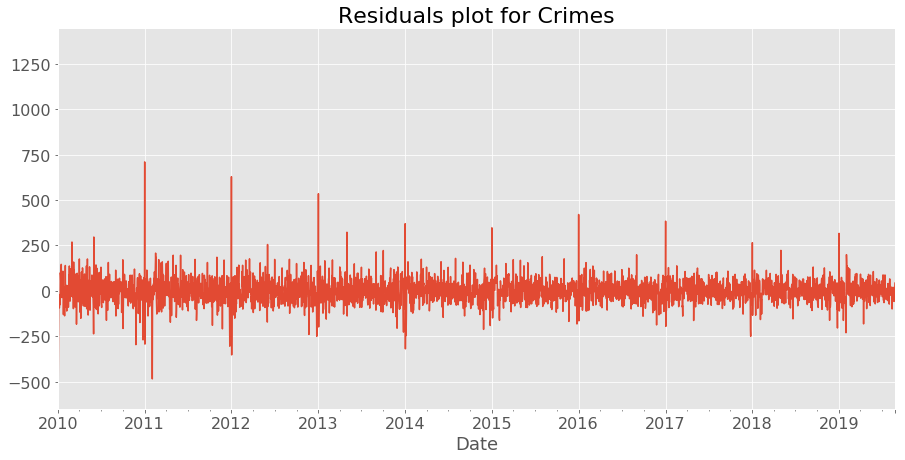

In [202]:
# Storing forecast in a variable
forecast = custom_functions.fit_ARIMA(series, series.index, order=(15, 0, 0), trend = "nc", title = "Crimes",
                                      print_summary = True, residual_plot = True)

AS we can see residual sequence plot looks like it comes from a stationary process except for some spikes.

## Forecasting using the model

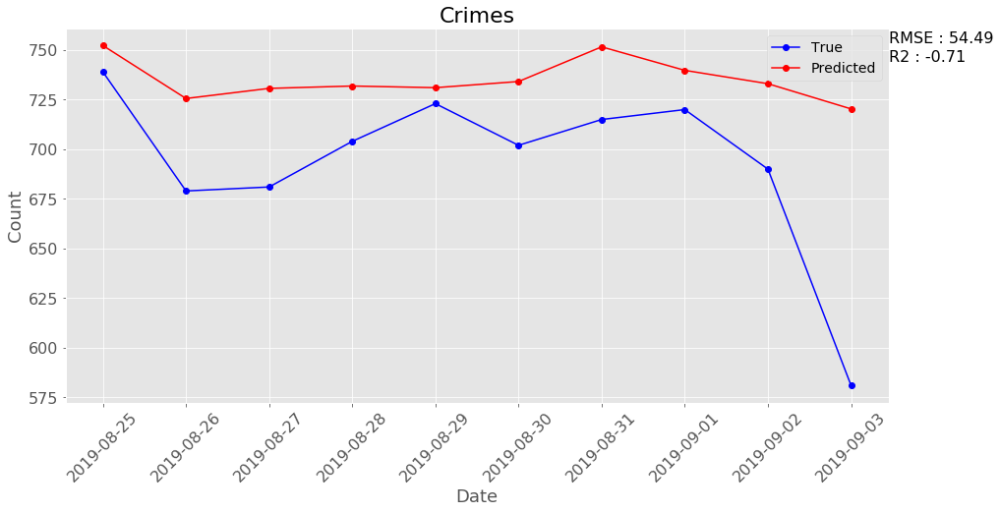

In [203]:
# Testing data
true_values = arima_df_day.tail(10)["Crimes"]
dates = arima_df_day.tail(10)["Date"]

# Plotting the true vs predicted values
custom_functions.plot_true_vs_predicted(true_values, forecast, dates, title = "Crimes")

Looks like model is getting pattern of the original values. But still model is not performing well so now we will take first order difference of the data.

## Model with First order Difference

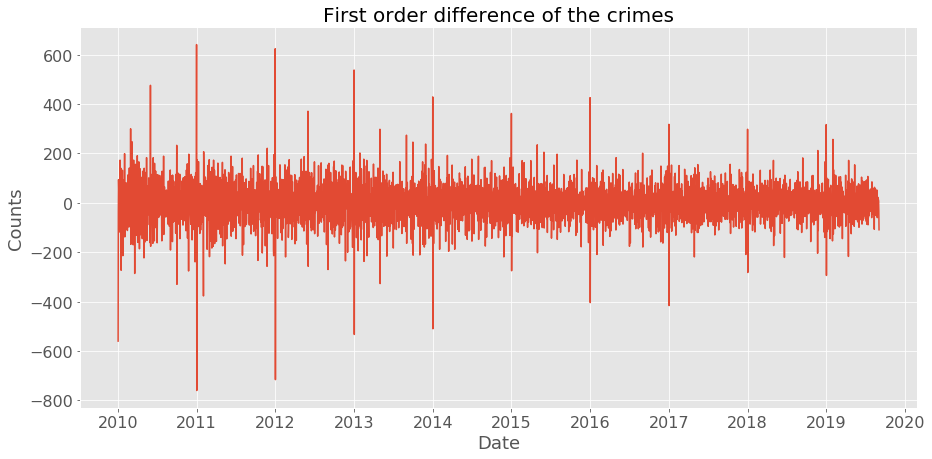

In [204]:
# Calculating first order difference of the data
differenced = custom_functions.difference(arima_df_day["Crimes"], interval = 1)

# Sequence plot
custom_functions.sequence_plot(differenced, arima_df_day["Date"][1:], 
                               "First order difference of the crimes")

First order difference looks like it comes from a stationary process so now we will fit an ARIMA model on it.

### Plotting ACF and PACF plot to decide the model

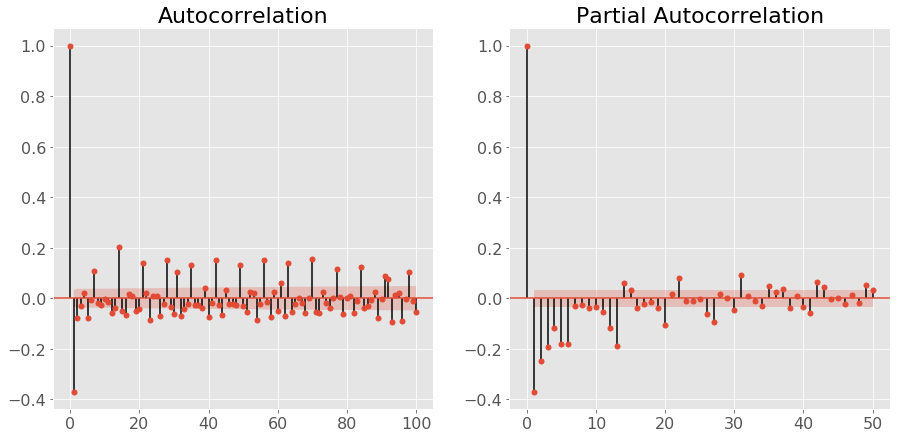

In [205]:
# Plotting ACF and PACF
custom_functions.plot_ACF_PACF(differenced)

Choosing ARIMA(15, 1, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms. But AR15 term was insignificant so removing that erm.

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                             ARIMA Model Results                              
Dep. Variable:               D.Crimes   No. Observations:                 3522
Model:                ARIMA(14, 1, 0)   Log Likelihood              -19817.194
Method:                       css-mle   S.D. of innovations             67.188
Date:                Tue, 05 Nov 2019   AIC                          39666.387
Time:                        05:54:27   BIC                          39765.056
Sample:                    01-02-2010   HQIC                         39701.589
                         - 08-24-2019                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              -0.0623      0.214     -0.291      0.771      -0.483       0.358
ar.L1.D.Crimes     -0.6432      0.017    -37.989      0.000      -0.676      -0.610
ar.L2.D.Crimes     -0.5401      

<Figure size 1080x504 with 0 Axes>

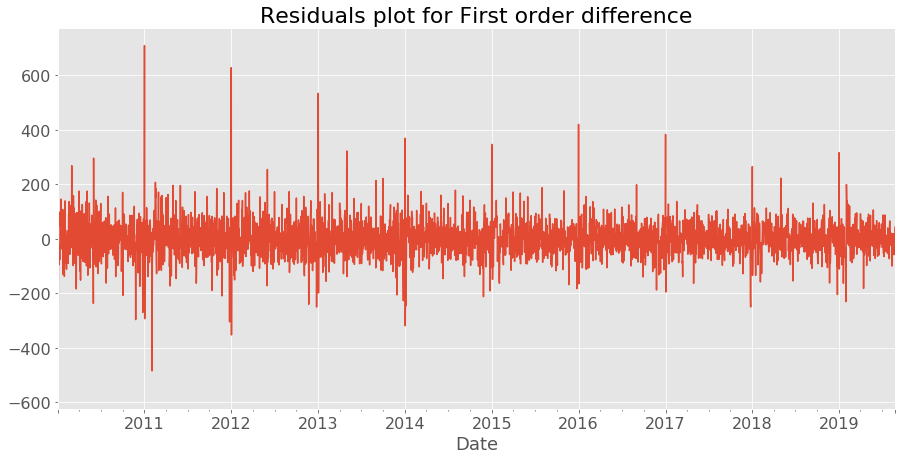

In [206]:
forecast_diff = custom_functions.fit_ARIMA(series, series.index, order = (14, 1, 0), title = "First order difference", 
                           print_summary = True, residual_plot = True)

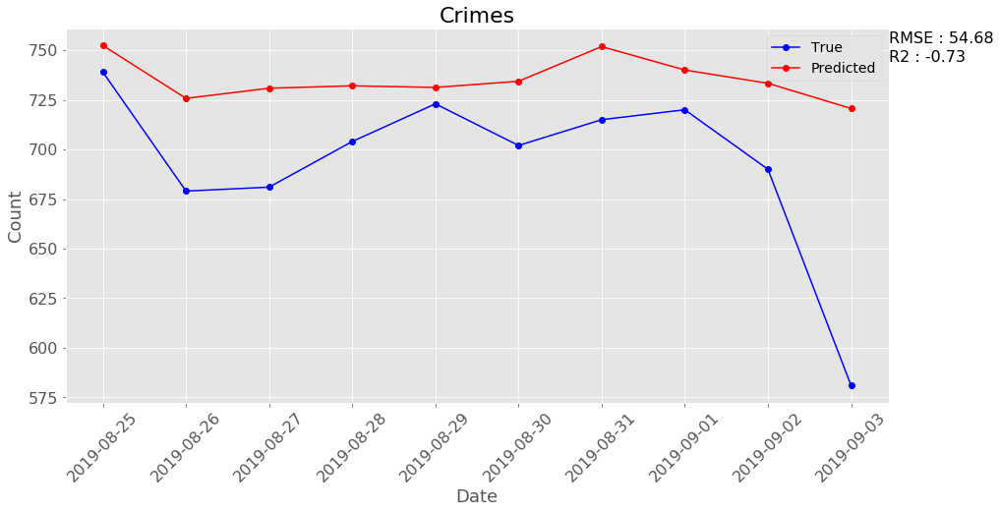

In [207]:
# Plotting true vs predicted values
custom_functions.plot_true_vs_predicted(true_values, forecast_diff, dates, title = "Crimes")

AR15 term was insignificant so I had to drop it. RMSE For Model ARIMA(14, 1, 0) : 54.68  which is little more than the RMSE of the Model ARIMA(15, 0 ,0) which was 54.49. And also we can see the graph model is just not getting the pattern which is in the original data. R2 value has also gone up by 0.02 that is an improvement. As these both models have negative R2 this models are worse than fitting the mean to the data. Now we will try ARIMA model on other variables.

## BATTERY

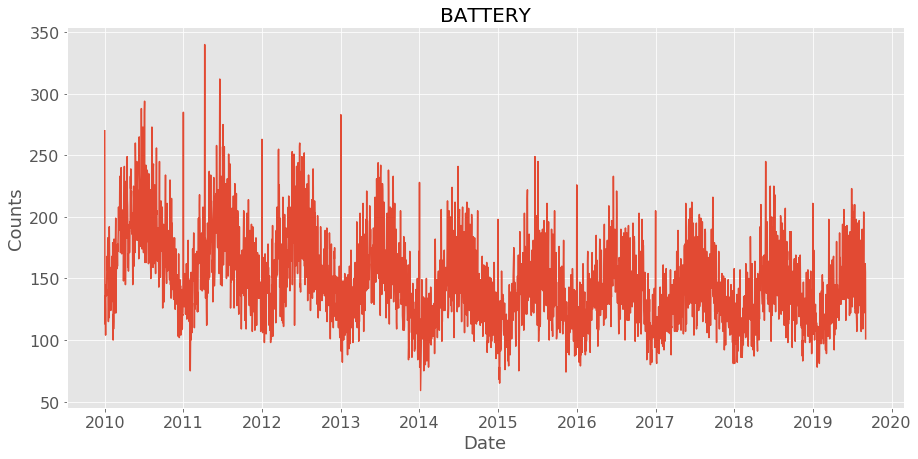

In [208]:
# Data looks like it comes from a stationary process
custom_functions.sequence_plot(arima_df_day["BATTERY"], arima_df_day["Date"], "BATTERY")

### Plotting ACF and PACF to decide the model

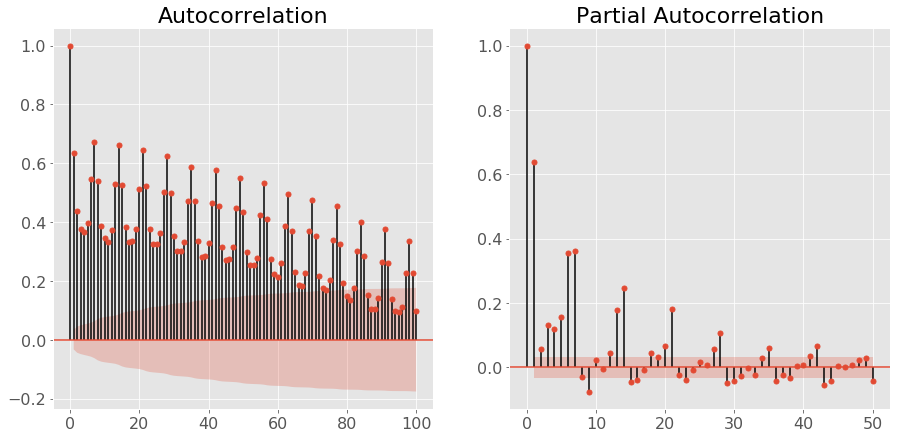

In [209]:
# Plotting ACF and PACF plot
custom_functions.plot_ACF_PACF(arima_df_day["BATTERY"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms.

### Fitting ARIMA(15, 0, 0) to BATTERY

In [210]:
# Creating data for model
series = arima_df_day["BATTERY"][:-10]
series.index = arima_df_day.index[:-10]

# Fitting an ARIMA model
forecast_bat = custom_functions.fit_ARIMA(series, series.index, order = (15, 0, 0), title = "BATTERY", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:                BATTERY   No. Observations:                 3523
Model:                    ARMA(15, 0)   Log Likelihood              -15804.802
Method:                       css-mle   S.D. of innovations             21.471
Date:                Tue, 05 Nov 2019   AIC                          31643.605
Time:                        05:55:10   BIC                          31748.445
Sample:                    01-01-1970   HQIC                         31681.009
                         - 01-01-1970                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const            146.8639      5.542     26.499      0.000     136.001     157.726
ar.L1.BATTERY      0.3521      0.017     20.818      0.000       0.319       0.385
ar.L2.BATTERY      0.0209      0.017

### Evaluating the model

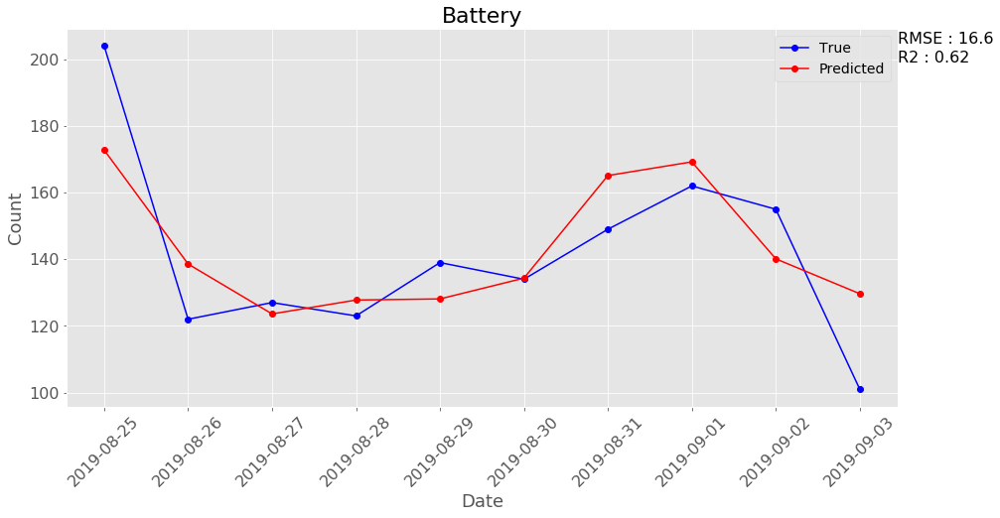

In [211]:
true_values = arima_df_day["BATTERY"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_bat, dates, title = "Battery")

ARIMA(15,0,0) can predict BATTERY crime more accurately then predicting Total crimes as we can see that the R2 value is 0.62 which means model can explain 62% variation in the data. RMSE is 16.6 which is quite low compare to previous models. Let's try fitting the first order difference to the BATTERY.

### First order difference of the BATTERY<a id='battery_ARIMA'></a>

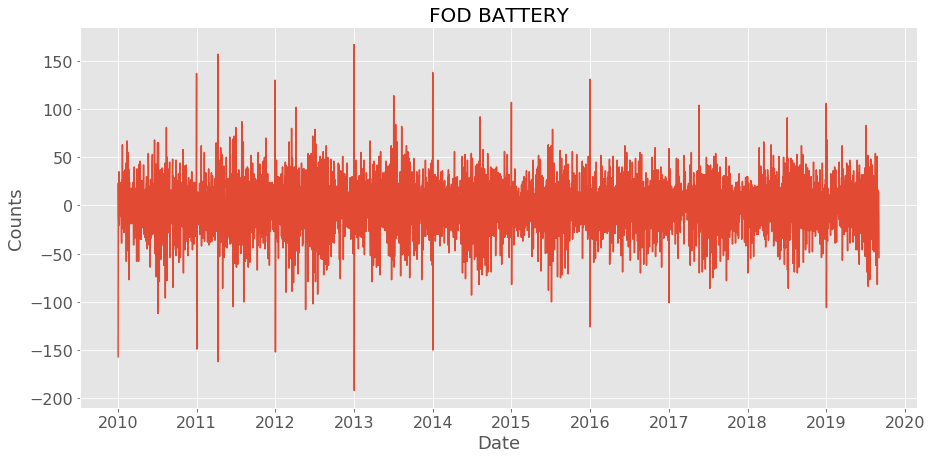

In [212]:
# Creating FOD
differenced_bat = custom_functions.difference(arima_df_day["BATTERY"], interval = 1)

# Plotting sequence plot
custom_functions.sequence_plot(differenced_bat, arima_df_day["Date"][1:], title = "FOD BATTERY")

# FOD of BATTERy comes from a stationary proecess

In [213]:
forecast_bat1 = custom_functions.fit_ARIMA(series, series.index, order = (15, 1, 0), trend = "nc", title = "FOD BATTERY", 
                                           print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                             ARIMA Model Results                              
Dep. Variable:              D.BATTERY   No. Observations:                 3522
Model:                ARIMA(15, 1, 0)   Log Likelihood              -15807.709
Method:                       css-mle   S.D. of innovations             21.517
Date:                Tue, 05 Nov 2019   AIC                          31647.418
Time:                        05:55:59   BIC                          31746.086
Sample:                    01-01-1970   HQIC                         31682.620
                         - 01-01-1970                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
ar.L1.D.BATTERY     -0.6443      0.017    -38.057      0.000      -0.677      -0.611
ar.L2.D.BATTERY     -0.6101      0.020    -30.367      0.000      -0.650      -0.571
ar.L3.D.BATTERY     -0.5677 

AR15 term is a borderline as P-value = 0.053, but we will still consider this term.

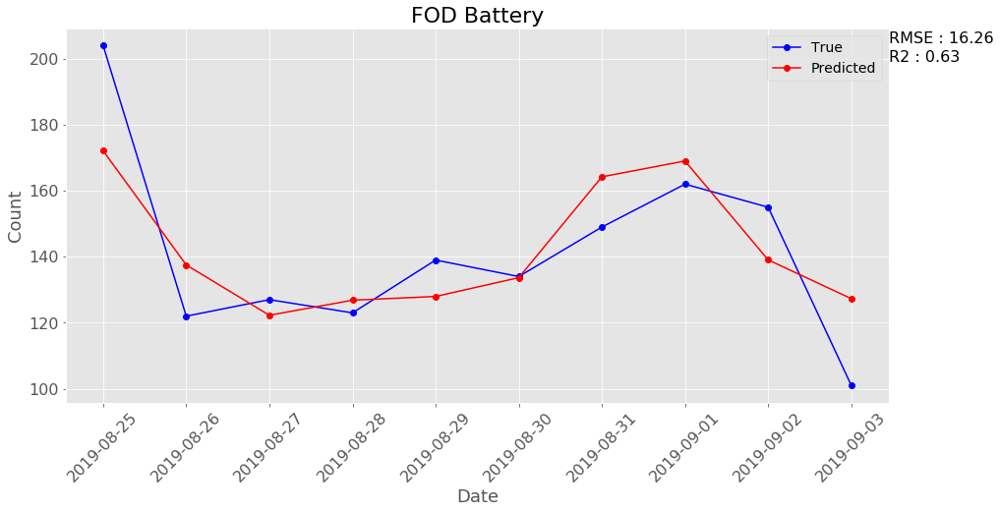

In [214]:
custom_functions.plot_true_vs_predicted(true_values, forecast_bat1, dates, title = "FOD Battery")

ARIMA model on FOD is performing better than the previous model as we have 1% increase in R2.

## MOTOR VEHICLE THEFT

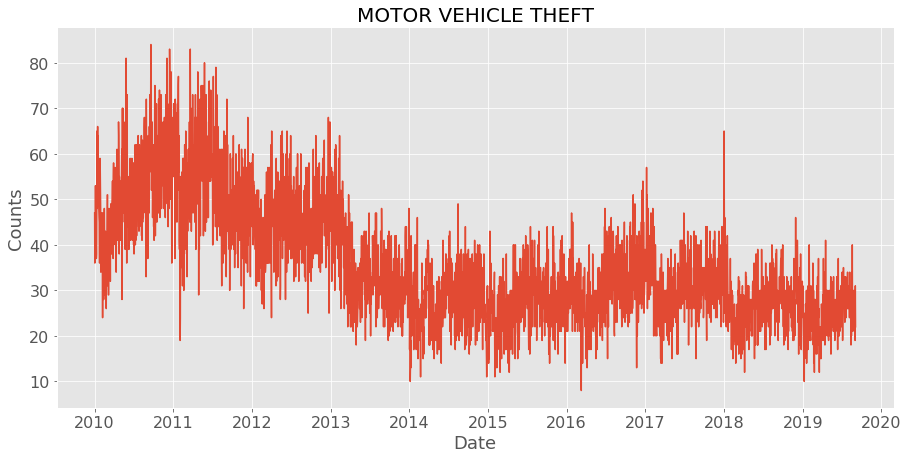

In [215]:
# MOTOR VEHICLE THEFT does not come from a stationary process, fitting ARIMA anyway.
custom_functions.sequence_plot(arima_df_day["MOTOR VEHICLE THEFT"], arima_df_day["Date"], "MOTOR VEHICLE THEFT")

### Plotting ACF and PACF to decide the model

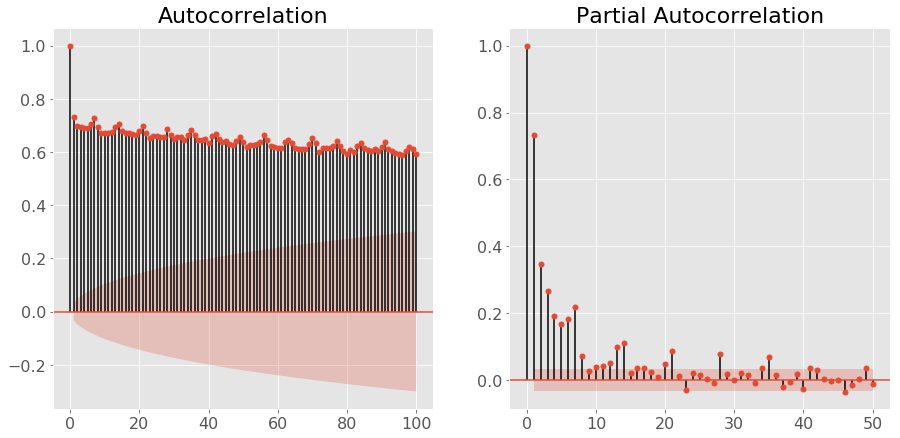

In [216]:
# ACF and PACF plot
custom_functions.plot_ACF_PACF(arima_df_day["MOTOR VEHICLE THEFT"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms. I have fitted ARIMA(15,0,0) but AR15 term is insignificant so We will fit ARIMA(14,0,0).

### Fitting ARIMA(14, 0, 0) to MOTOR VEHICLE THEFT

In [217]:
# Creating data for model
series = arima_df_day["MOTOR VEHICLE THEFT"][:-10]
series.index = arima_df_day.index[:-10]

# Fitting an ARIMA model
forecast_mot = custom_functions.fit_ARIMA(series, series.index, order = (14, 0, 0), title = "MOTOR VEHICLE THEFT", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                               ARMA Model Results                              
Dep. Variable:     MOTOR VEHICLE THEFT   No. Observations:                 3523
Model:                     ARMA(14, 0)   Log Likelihood              -11979.636
Method:                        css-mle   S.D. of innovations              7.251
Date:                 Tue, 05 Nov 2019   AIC                          23991.271
Time:                         05:56:33   BIC                          24089.944
Sample:                     01-01-1970   HQIC                         24026.475
                          - 01-01-1970                                         
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         35.5209      3.293     10.786      0.000      29.066      41.976
ar.L1.MOTOR VEHICLE THEFT      0.1932      0.017     11.545      0.000     

### Evaluating the model

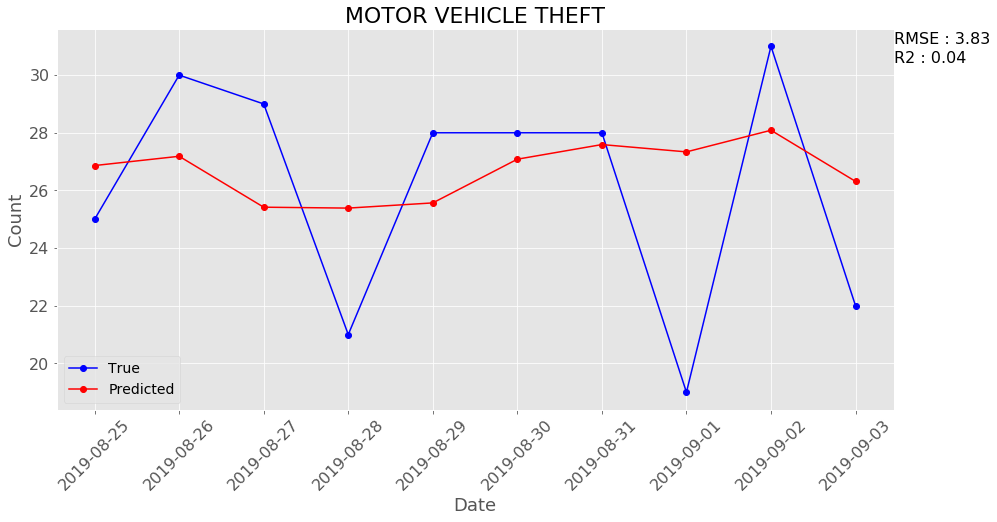

In [218]:
true_values = arima_df_day["MOTOR VEHICLE THEFT"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_mot, dates, title = "MOTOR VEHICLE THEFT")

ARIMA(14,0,0) can predict MOTOR VEHICLE THEFT with the R2 value of 0.04 which means model can explain 4% variation in the data. RMSE is 3.83 which is quite low compare to previous models(Explained by low value of variable). I have fitted FOD(First order difference) to MOTOR VEHICLE THEFT and SOD(Second order difference) to MOTOR VEHICLE THEFT. SOD(R2 = 0.09) is much better than FOD(R2 = 0.04).

### Second order difference of the BATTERY

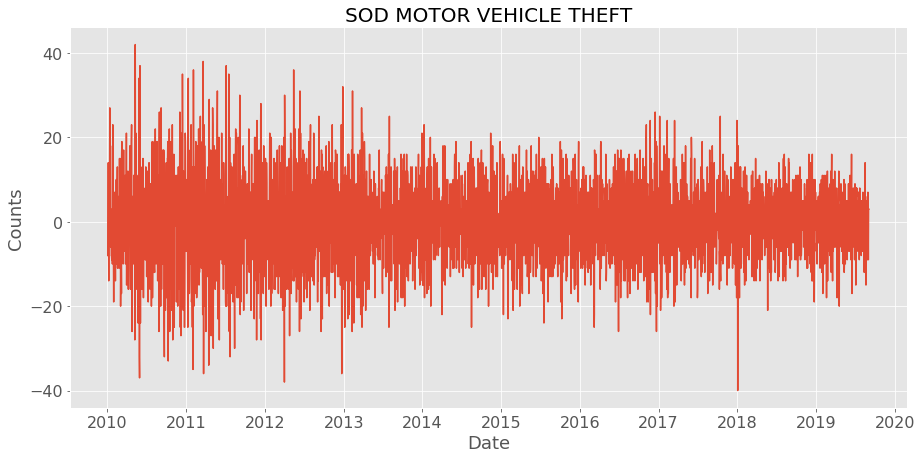

In [219]:
# Creating SOD of the data
differenced_mot = custom_functions.difference(arima_df_day["MOTOR VEHICLE THEFT"], interval = 2)

# Sequence plot - data is from stationary process
custom_functions.sequence_plot(differenced_mot, arima_df_day["Date"][2:], title = "SOD MOTOR VEHICLE THEFT")

In [220]:
# Fitting an ARIMA model
forecast_mot2 = custom_functions.fit_ARIMA(series, series.index, order = (15, 2, 0), trend = "nc", 
                                           title = "DIFF MOTOR VEHICLE THEFT", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                               ARIMA Model Results                                
Dep. Variable:     D2.MOTOR VEHICLE THEFT   No. Observations:                 3521
Model:                    ARIMA(15, 2, 0)   Log Likelihood              -12235.262
Method:                           css-mle   S.D. of innovations              7.809
Date:                    Tue, 05 Nov 2019   AIC                          24502.523
Time:                            05:57:11   BIC                          24601.187
Sample:                        01-01-1970   HQIC                         24537.725
                             - 01-01-1970                                         
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
ar.L1.D2.MOTOR VEHICLE THEFT     -1.6550      0.017    -98.831      0.000      -1.688      -1.622
ar.L2.D2.MOTOR VEHICLE THEFT     -2.1265  

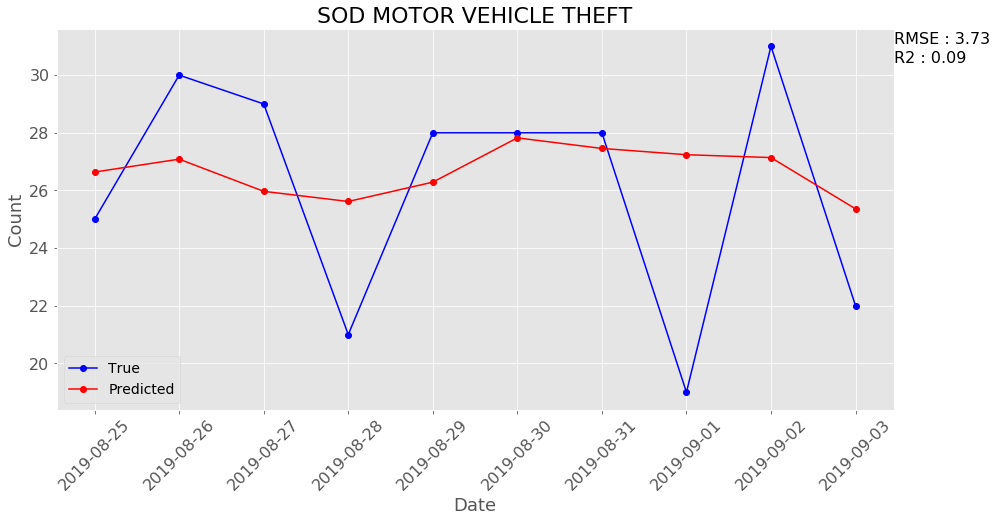

In [221]:
custom_functions.plot_true_vs_predicted(true_values, forecast_mot2, dates, title = "SOD MOTOR VEHICLE THEFT")

## CRIMINAL DAMAGE

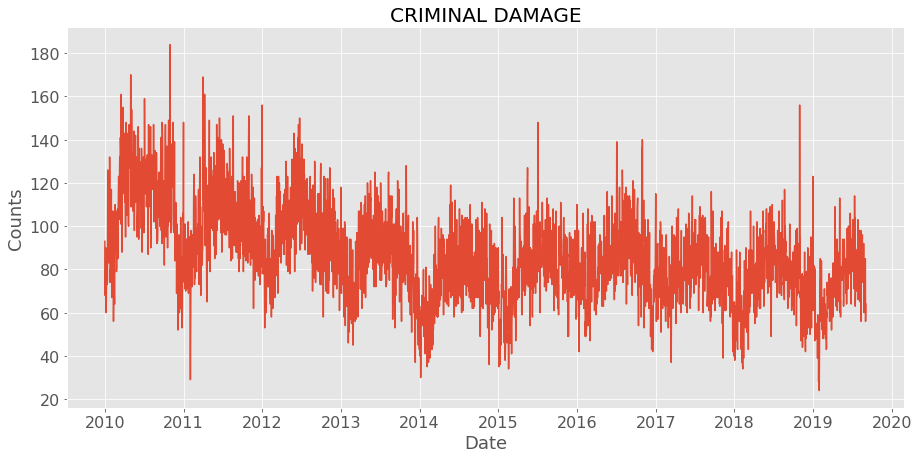

In [222]:
# Sequence plot - data looks like it comes from a stationary process
custom_functions.sequence_plot(arima_df_day["CRIMINAL DAMAGE"], arima_df_day["Date"], "CRIMINAL DAMAGE")

### Plotting ACF and PACF to decide the model

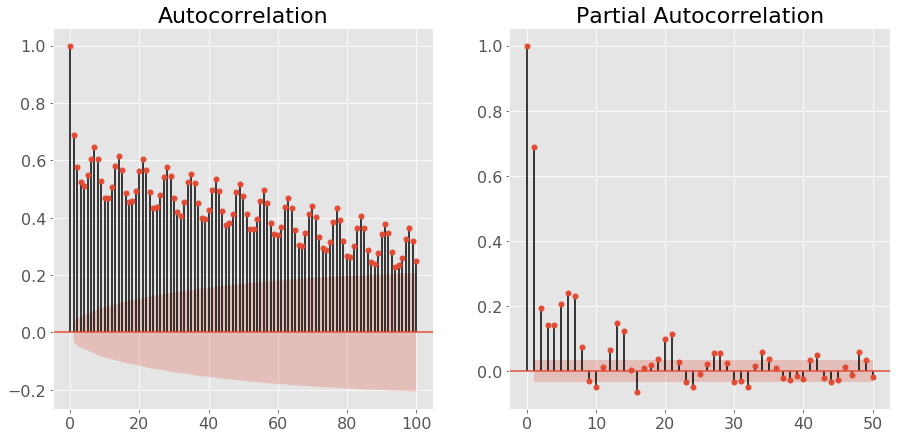

In [223]:
# ACF and PACF plot
custom_functions.plot_ACF_PACF(arima_df_day["CRIMINAL DAMAGE"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms. I have fitted ARIMA(15,0,0) but AR15 term is insignificant so We will fit ARIMA(14,0,0).

### Fitting ARIMA(14, 0, 0) to CRIMINAL DAMAGE

In [224]:
# Creating data for the model
series = arima_df_day["CRIMINAL DAMAGE"][:-10]
series.index = arima_df_day.index[:-10]

# Fitting an ARIMA model
forecast_cri = custom_functions.fit_ARIMA(series, series.index, order = (14, 0, 0), title = "CRIMINAL DAMAGE", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:        CRIMINAL DAMAGE   No. Observations:                 3523
Model:                    ARMA(14, 0)   Log Likelihood              -14105.399
Method:                       css-mle   S.D. of innovations             13.257
Date:                Tue, 05 Nov 2019   AIC                          28242.798
Time:                        05:57:45   BIC                          28341.471
Sample:                    01-01-1970   HQIC                         28278.001
                         - 01-01-1970                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     86.3078      3.588     24.055      0.000      79.275      93.340
ar.L1.CRIMINAL DAMAGE      0.3302      0.017     19.742      0.000       0.297       0.363
ar.L

### Evaluating the model

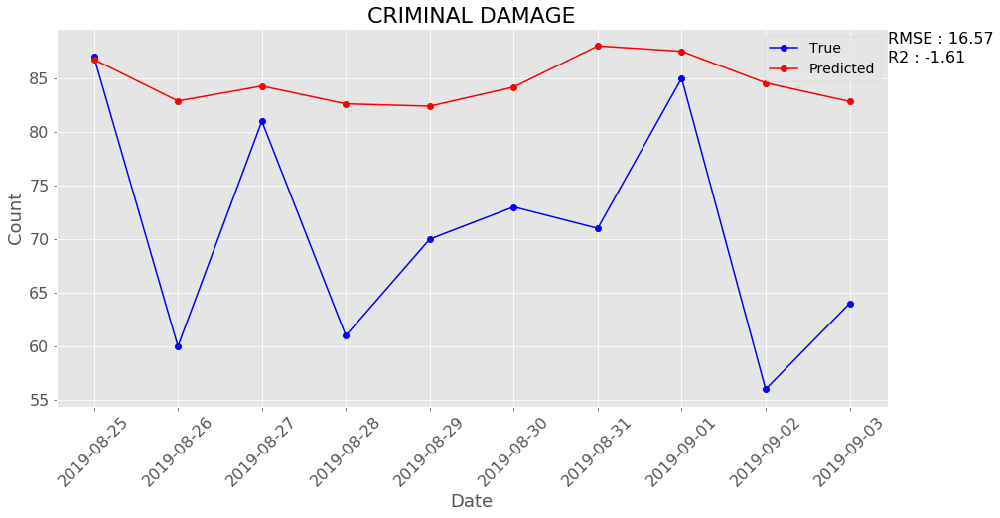

In [225]:
true_values = arima_df_day["CRIMINAL DAMAGE"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_cri, dates, title = "CRIMINAL DAMAGE")

ARIMA(14,0,0) can predict CRIMINAL DAMAGE with the R2 value of -1.61 which means model is worse than fitting mean to the data. RMSE is 16.57.

### First order difference of the CRIMINAL DAMAGE

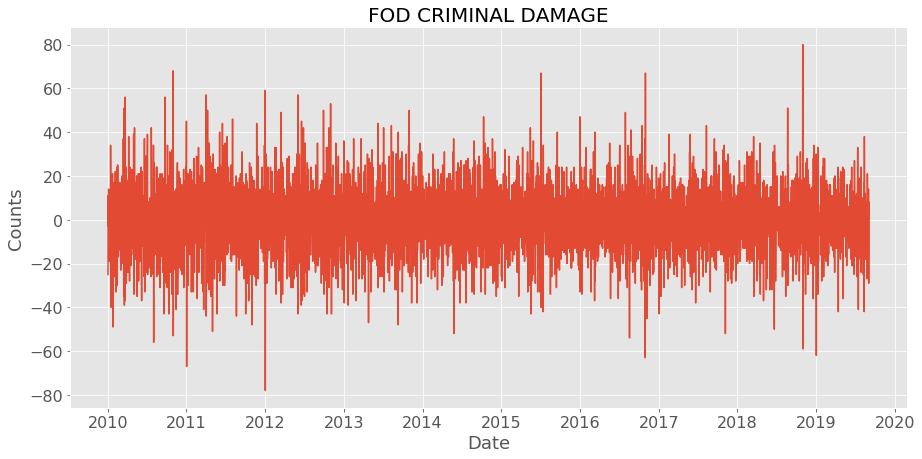

In [226]:
# Creating FOD of the data
differenced_cri = custom_functions.difference(arima_df_day["CRIMINAL DAMAGE"], interval = 1)

# Sequence plot
custom_functions.sequence_plot(differenced_cri, arima_df_day["Date"][1:], title = "FOD CRIMINAL DAMAGE")

In [227]:
# Fitting an ARIMA model
forecast_cri1 = custom_functions.fit_ARIMA(series, series.index, order = (15, 1, 0), trend = "nc", 
                                           title = "FOD CRIMINAL DAMAGE", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                             ARIMA Model Results                              
Dep. Variable:      D.CRIMINAL DAMAGE   No. Observations:                 3522
Model:                ARIMA(15, 1, 0)   Log Likelihood              -14104.868
Method:                       css-mle   S.D. of innovations             13.271
Date:                Tue, 05 Nov 2019   AIC                          28241.735
Time:                        05:58:23   BIC                          28340.404
Sample:                    01-01-1970   HQIC                         28276.938
                         - 01-01-1970                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
ar.L1.D.CRIMINAL DAMAGE     -0.6640      0.017    -39.472      0.000      -0.697      -0.631
ar.L2.D.CRIMINAL DAMAGE     -0.5940      0.020    -29.404      0.000      -0.634      -0.

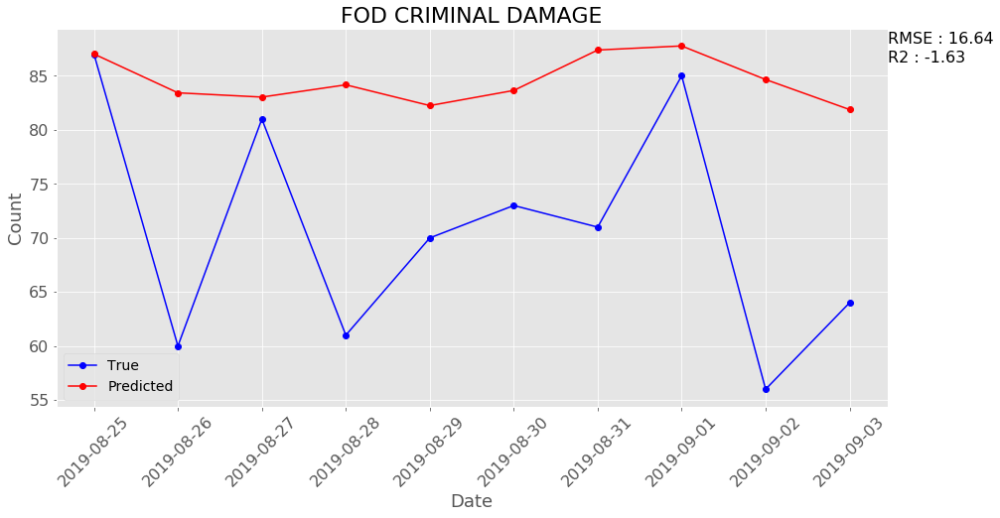

In [228]:
custom_functions.plot_true_vs_predicted(true_values, forecast_cri1, dates, title = "FOD CRIMINAL DAMAGE")

Latter model is worse than the previous model R2 score has gone down and there is an increase in RMSE compare to former model.

## ASSAULT

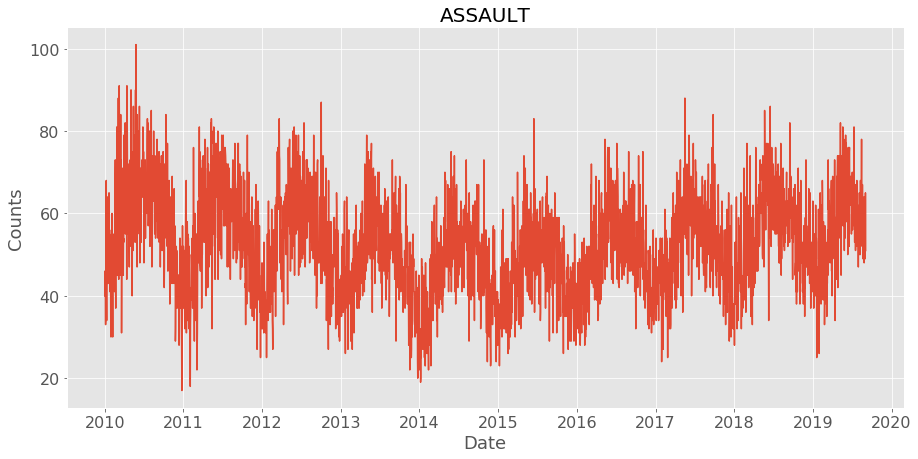

In [229]:
# Data comes from a stationary process
custom_functions.sequence_plot(arima_df_day["ASSAULT"], arima_df_day["Date"], "ASSAULT")

### Plotting ACF and PACF to decide the model

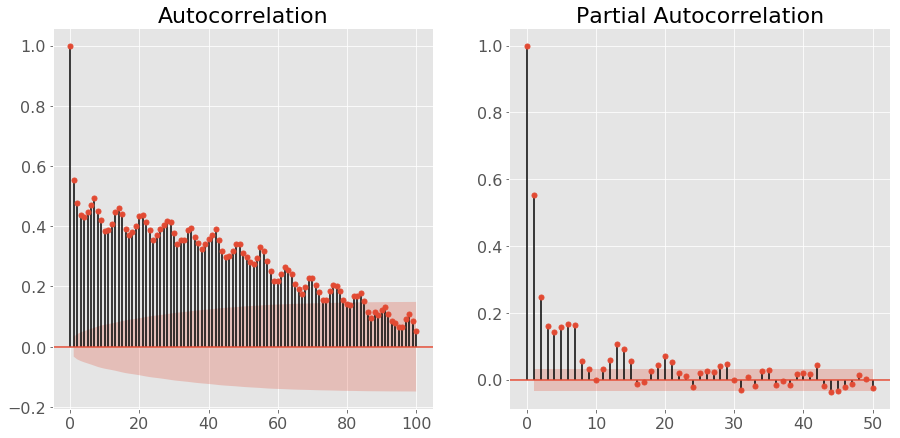

In [230]:
# ACF and PACF plot
custom_functions.plot_ACF_PACF(arima_df_day["ASSAULT"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms.

### Fitting ARIMA(15, 0, 0) to ASSAULT

In [231]:
# Creating data
series = arima_df_day["ASSAULT"][:-10]
series.index = arima_df_day.index[:-10]

# Fitting ARIMA(15, 0, 0)
forecast_ass = custom_functions.fit_ARIMA(series, series.index, order = (15, 0, 0), title = "ASSAULT", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:                ASSAULT   No. Observations:                 3523
Model:                    ARMA(15, 0)   Log Likelihood              -12706.419
Method:                       css-mle   S.D. of innovations              8.913
Date:                Tue, 05 Nov 2019   AIC                          25446.838
Time:                        05:59:03   BIC                          25551.678
Sample:                    01-01-1970   HQIC                         25484.242
                         - 01-01-1970                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             52.4318      1.588     33.015      0.000      49.319      55.544
ar.L1.ASSAULT      0.2463      0.017     14.638      0.000       0.213       0.279
ar.L2.ASSAULT      0.0869      0.017

### Evaluating the model

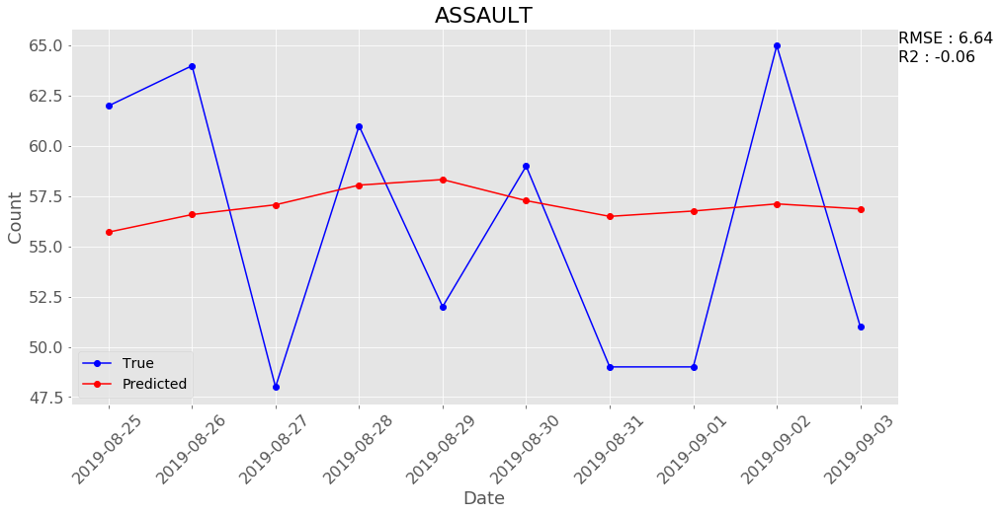

In [232]:
true_values = arima_df_day["ASSAULT"][-10:]
dates = arima_df_day["Date"][-10:]

# True values vs predicted
custom_functions.plot_true_vs_predicted(true_values, forecast_ass, dates, title = "ASSAULT")

ARIMA(15,0,0) can predict ASSAULT with the R2 value of -0.06 which means model is worse than fitting mean to the data. RMSE is 16.57.

### First order difference of the ASSAULT

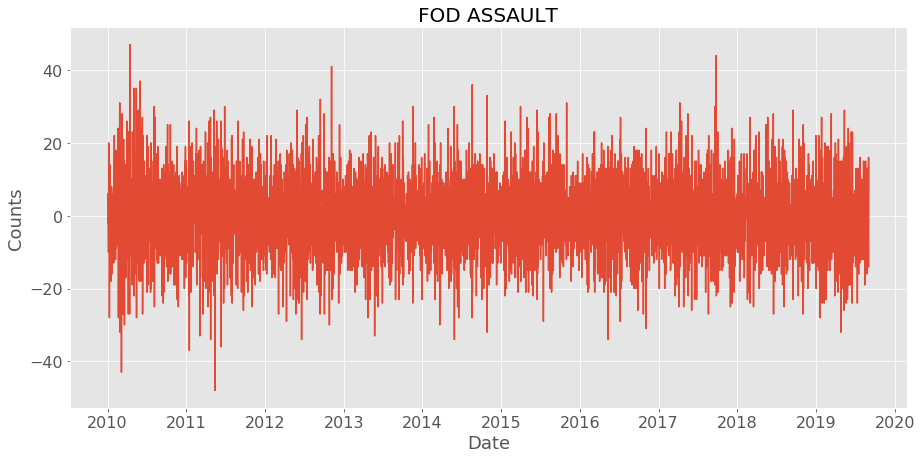

In [233]:
differenced_ass = custom_functions.difference(arima_df_day["ASSAULT"], interval = 1)
custom_functions.sequence_plot(differenced_ass, arima_df_day["Date"][1:], title = "FOD ASSAULT")

In [234]:
forecast_ass1 = custom_functions.fit_ARIMA(series, series.index, order = (14, 1, 0), trend = "nc", 
                                           title = "FOD ASSAULT", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                             ARIMA Model Results                              
Dep. Variable:              D.ASSAULT   No. Observations:                 3522
Model:                ARIMA(14, 1, 0)   Log Likelihood              -12716.344
Method:                       css-mle   S.D. of innovations              8.948
Date:                Tue, 05 Nov 2019   AIC                          25462.689
Time:                        05:59:42   BIC                          25555.190
Sample:                    01-01-1970   HQIC                         25495.691
                         - 01-01-1970                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
ar.L1.D.ASSAULT     -0.7456      0.017    -44.324      0.000      -0.779      -0.713
ar.L2.D.ASSAULT     -0.6520      0.021    -31.258      0.000      -0.693      -0.611
ar.L3.D.ASSAULT     -0.5985 

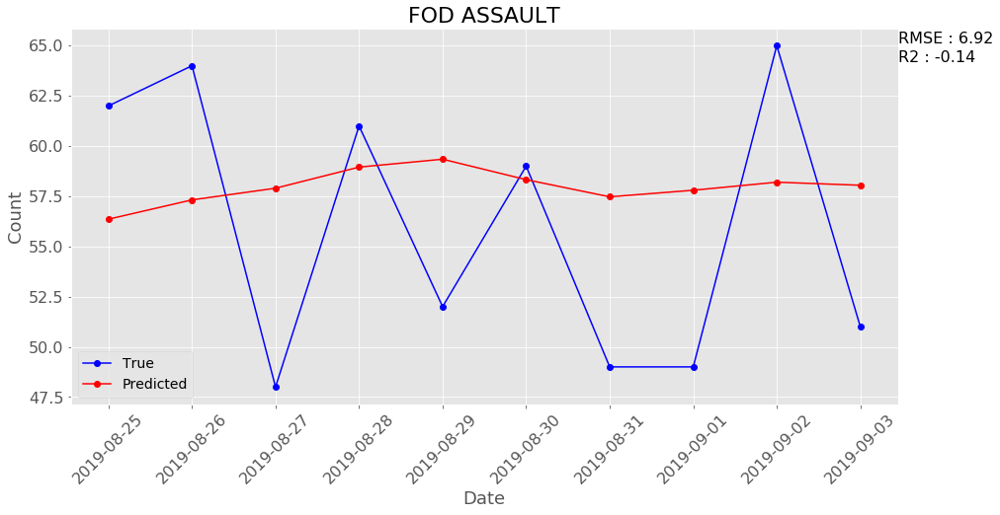

In [235]:
custom_functions.plot_true_vs_predicted(true_values, forecast_ass1, dates, title = "FOD ASSAULT")

FOD of the data produces worse model than the Model fitted on the original data

## ROBBERY

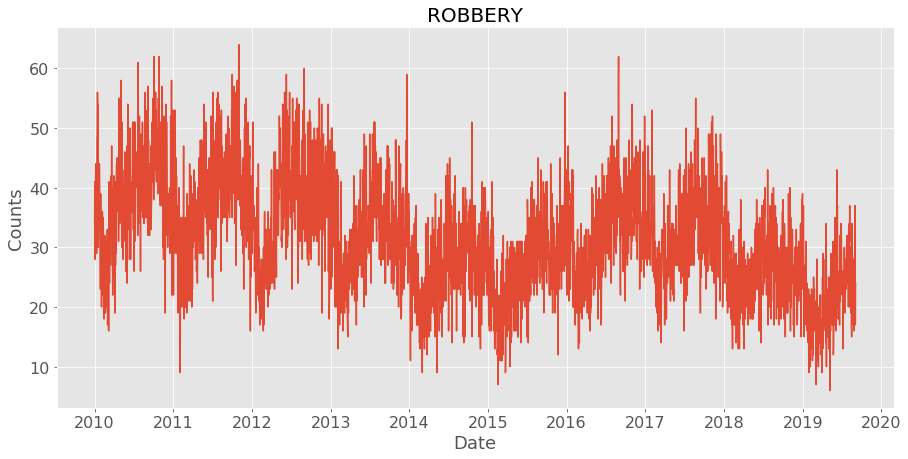

In [236]:
custom_functions.sequence_plot(arima_df_day["ROBBERY"], arima_df_day["Date"], "ROBBERY")

### Plotting ACF and PACF to decide the model

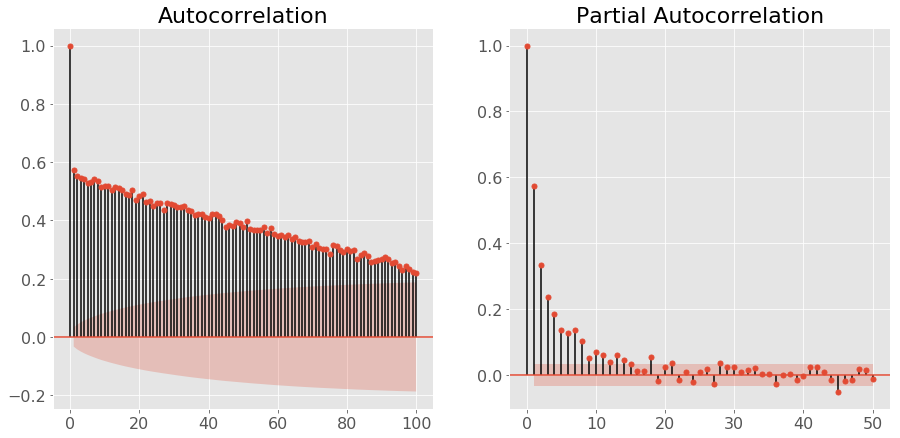

In [237]:
custom_functions.plot_ACF_PACF(arima_df_day["ROBBERY"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms.

### Fitting ARIMA(15, 0, 0) to ROBBERY

In [238]:
series = arima_df_day["ROBBERY"][:-10]
series.index = arima_df_day.index[:-10]
forecast_rob = custom_functions.fit_ARIMA(series, series.index, order = (15, 0, 0), title = "ROBBERY", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:                ROBBERY   No. Observations:                 3523
Model:                    ARMA(15, 0)   Log Likelihood              -11666.747
Method:                       css-mle   S.D. of innovations              6.635
Date:                Tue, 05 Nov 2019   AIC                          23367.494
Time:                        06:00:18   BIC                          23472.335
Sample:                    01-01-1970   HQIC                         23404.898
                         - 01-01-1970                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
const             31.4772      1.556     20.234      0.000      28.428      34.526
ar.L1.ROBBERY      0.1621      0.017      9.628      0.000       0.129       0.195
ar.L2.ROBBERY      0.1040      0.017

### Evaluating the model

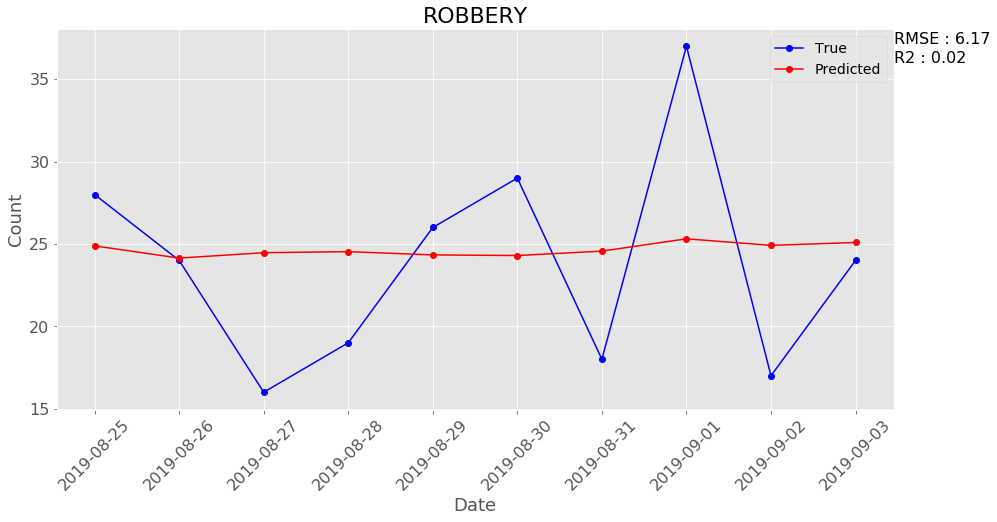

In [239]:
true_values = arima_df_day["ROBBERY"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_rob, dates, title = "ROBBERY")

ARIMA(15,0,0) can predict CRIMINAL DAMAGE with the R2 value of 0.02 which means model explains 2% of the variation in the model. RMSE is 6.17.

### First order difference of the ROBBERY

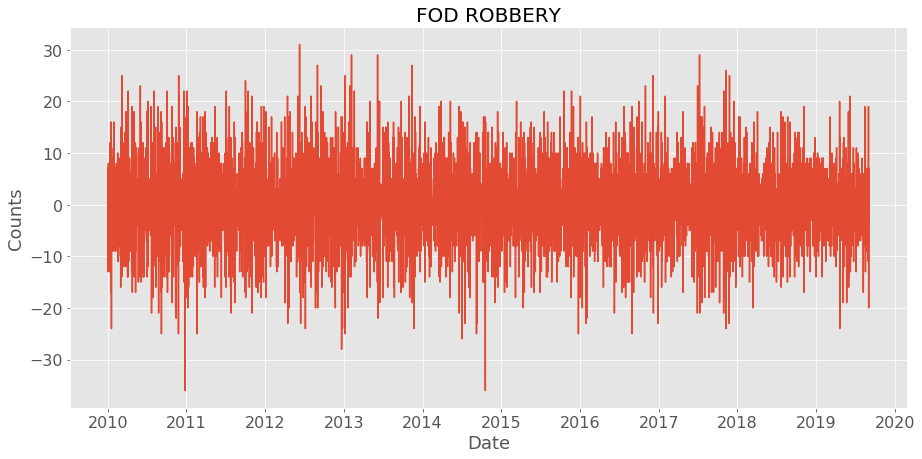

In [240]:
differenced_rob = custom_functions.difference(arima_df_day["ROBBERY"], interval = 1)
custom_functions.sequence_plot(differenced_rob, arima_df_day["Date"][1:], title = "FOD ROBBERY")

In [241]:
forecast_rob1 = custom_functions.fit_ARIMA(series, series.index, order = (14, 1, 0), trend = "nc", 
                                           title = "FOD ROBBERY", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                             ARIMA Model Results                              
Dep. Variable:              D.ROBBERY   No. Observations:                 3522
Model:                ARIMA(14, 1, 0)   Log Likelihood              -11673.261
Method:                       css-mle   S.D. of innovations              6.654
Date:                Tue, 05 Nov 2019   AIC                          23376.522
Time:                        06:00:58   BIC                          23469.024
Sample:                    01-01-1970   HQIC                         23409.524
                         - 01-01-1970                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
ar.L1.D.ROBBERY     -0.8321      0.017    -49.415      0.000      -0.865      -0.799
ar.L2.D.ROBBERY     -0.7229      0.022    -33.063      0.000      -0.766      -0.680
ar.L3.D.ROBBERY     -0.6353 

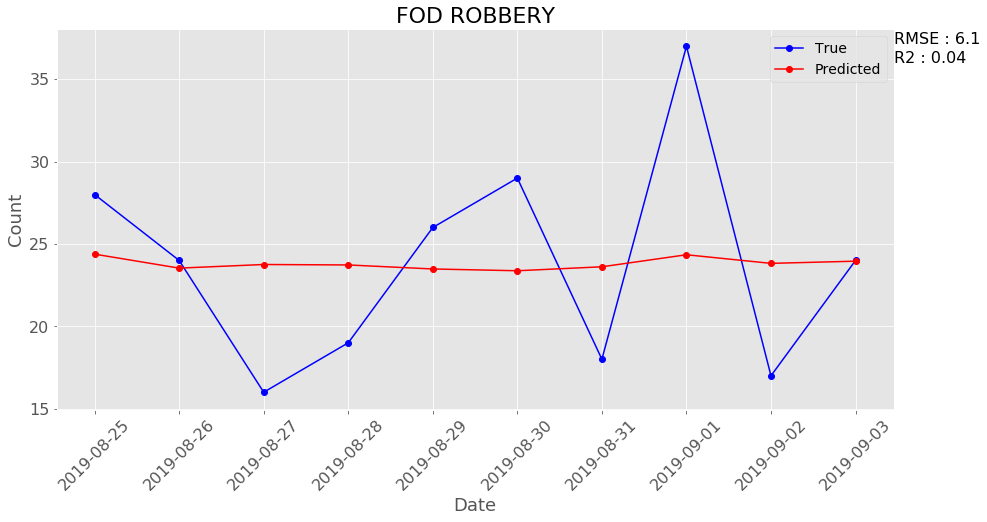

In [242]:
custom_functions.plot_true_vs_predicted(true_values, forecast_rob1, dates, title = "FOD ROBBERY")

FOD of the data with ARIMA model created better model than the original data. There is 2% increase in R2 value.

## WEAPONS VIOLATION

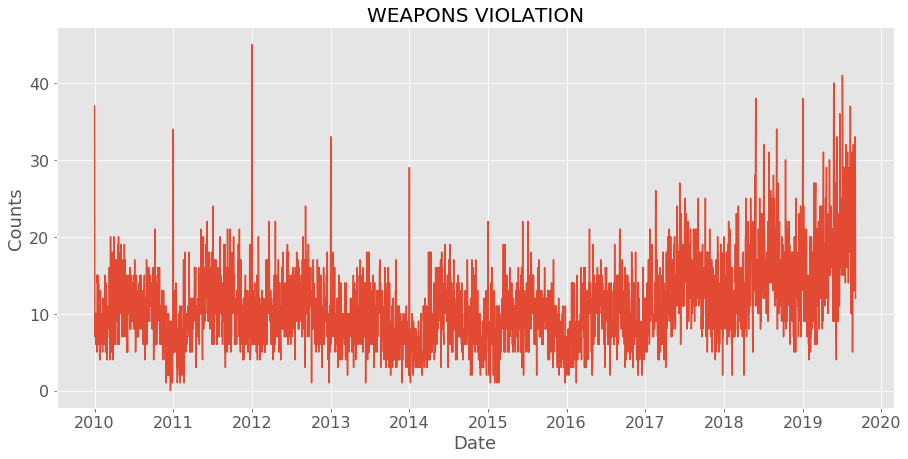

In [243]:
custom_functions.sequence_plot(arima_df_day["WEAPONS VIOLATION"], arima_df_day["Date"], "WEAPONS VIOLATION")

### Plotting ACF and PACF to decide the model

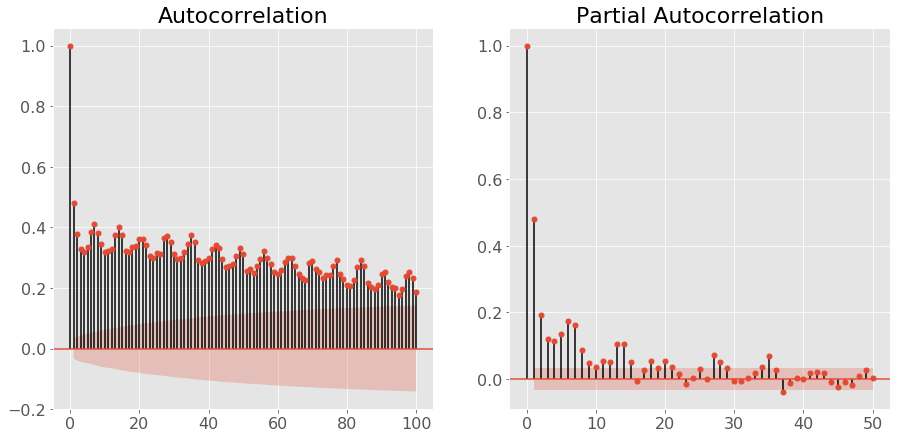

In [244]:
custom_functions.plot_ACF_PACF(arima_df_day["WEAPONS VIOLATION"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms.

### Fitting ARIMA(15, 0, 0) to WEAPONS VIOLATION

In [245]:
series = arima_df_day["WEAPONS VIOLATION"][:-10]
series.index = arima_df_day.index[:-10]
forecast_wea = custom_functions.fit_ARIMA(series, series.index, order = (15, 0, 0), title = "WEAPONS VIOLATION", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:      WEAPONS VIOLATION   No. Observations:                 3523
Model:                    ARMA(15, 0)   Log Likelihood              -10004.686
Method:                       css-mle   S.D. of innovations              4.140
Date:                Tue, 05 Nov 2019   AIC                          20043.372
Time:                        06:01:31   BIC                          20148.212
Sample:                    01-01-1970   HQIC                         20080.776
                         - 01-01-1970                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       11.2256      0.653     17.190      0.000       9.946      12.506
ar.L1.WEAPONS VIOLATION      0.2339      0.017     13.813      0.000       0.201       0.

### Evaluating the model

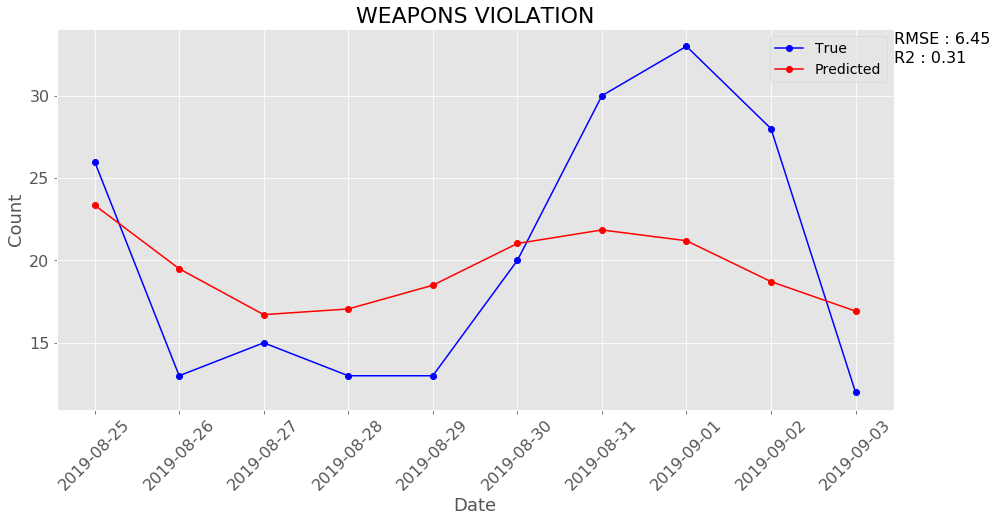

In [246]:
true_values = arima_df_day["WEAPONS VIOLATION"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_wea, dates, title = "WEAPONS VIOLATION")

ARIMA(15,0,0) can predict WEAPONS VIOLATION with the R2 value of 0.31 which means model explains 31% of the variation in the model. RMSE is 6.45.

### First order difference of the WEAPONS VIOLATION <a id = 'wp_ARIMA'></a> 

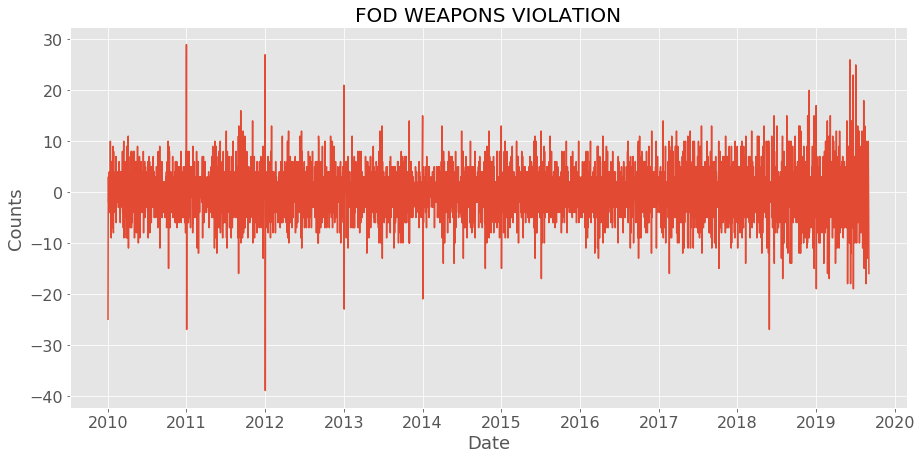

In [247]:
differenced_wea = custom_functions.difference(arima_df_day["WEAPONS VIOLATION"], interval = 1)
custom_functions.sequence_plot(differenced_wea, arima_df_day["Date"][1:], title = "FOD WEAPONS VIOLATION")

In [248]:
forecast_wea1 = custom_functions.fit_ARIMA(series, series.index, order = (14, 1, 0), trend = "nc", 
                                           title = "FOD WEAPONS VIOLATION", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARIMA Model Results                              
Dep. Variable:     D.WEAPONS VIOLATION   No. Observations:                 3522
Model:                 ARIMA(14, 1, 0)   Log Likelihood              -10014.334
Method:                        css-mle   S.D. of innovations              4.154
Date:                 Tue, 05 Nov 2019   AIC                          20058.668
Time:                         06:02:11   BIC                          20151.170
Sample:                     01-01-1970   HQIC                         20091.670
                          - 01-01-1970                                         
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
ar.L1.D.WEAPONS VIOLATION     -0.7585      0.017    -44.808      0.000      -0.792      -0.725
ar.L2.D.WEAPONS VIOLATION     -0.6930      0.021    -32.818      0.000     

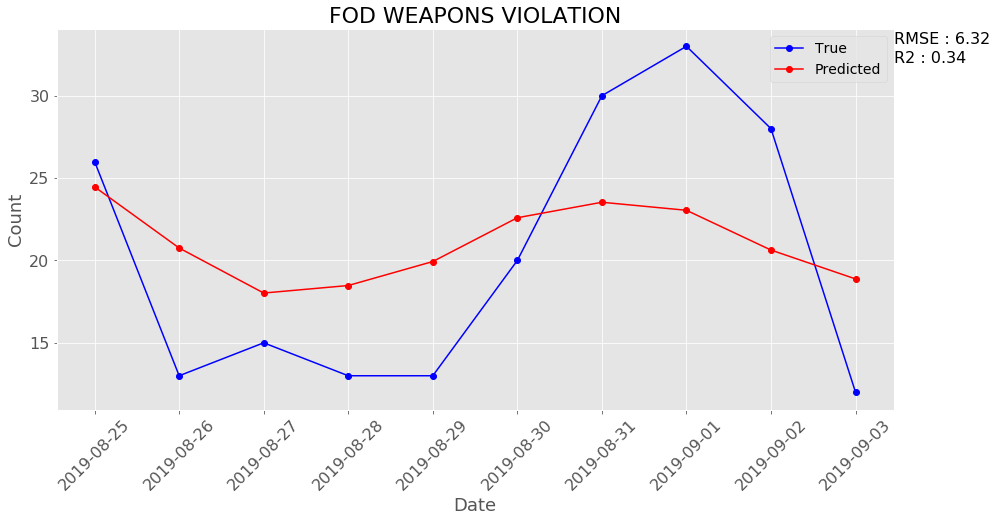

In [249]:
custom_functions.plot_true_vs_predicted(true_values, forecast_wea1, dates, title = "FOD WEAPONS VIOLATION")

## OTHER OFFENSE

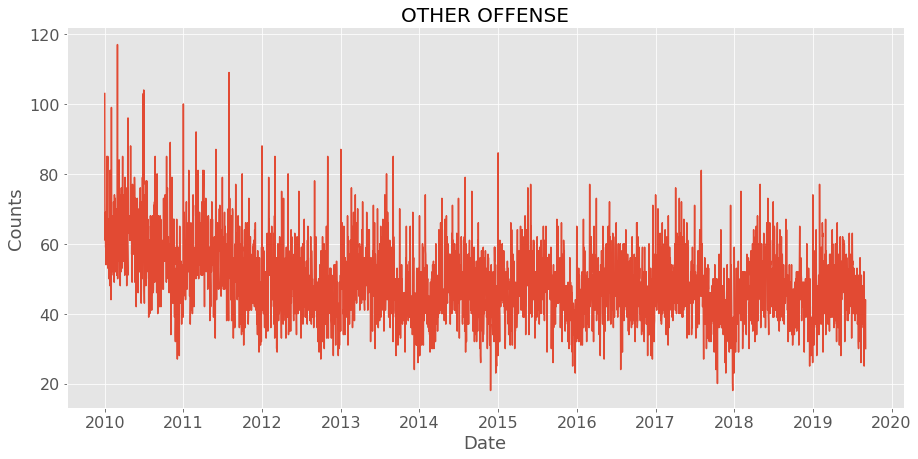

In [250]:
custom_functions.sequence_plot(arima_df_day["OTHER OFFENSE"], arima_df_day["Date"], "OTHER OFFENSE")

### Plotting ACF and PACF to decide the model

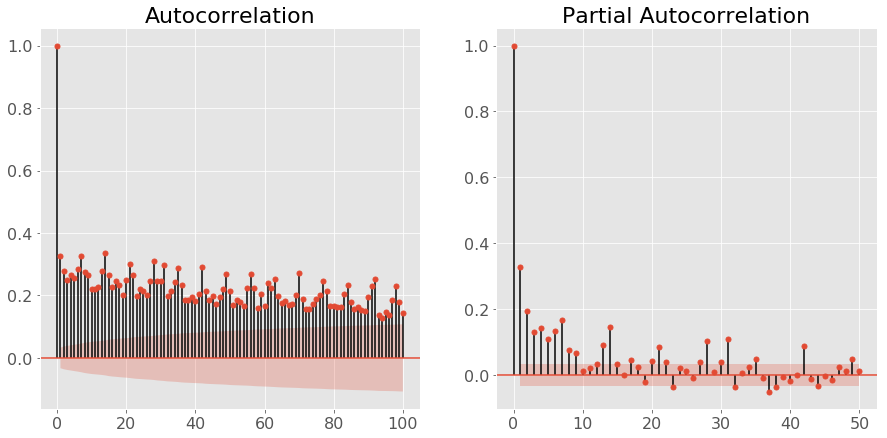

In [251]:
custom_functions.plot_ACF_PACF(arima_df_day["OTHER OFFENSE"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms.

### Fitting ARIMA(15, 0, 0) to OTHER OFFENSE

In [252]:
series = arima_df_day["OTHER OFFENSE"][:-10]
series.index = arima_df_day.index[:-10]
forecast_oo = custom_functions.fit_ARIMA(series, series.index, order = (15, 0, 0), title = "OTHER OFFENSE", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:          OTHER OFFENSE   No. Observations:                 3523
Model:                    ARMA(15, 0)   Log Likelihood              -12865.757
Method:                       css-mle   S.D. of innovations              9.326
Date:                Tue, 05 Nov 2019   AIC                          25765.514
Time:                        06:02:46   BIC                          25870.355
Sample:                    01-01-1970   HQIC                         25802.918
                         - 01-01-1970                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   49.3365      1.064     46.375      0.000      47.251      51.422
ar.L1.OTHER OFFENSE      0.1276      0.017      7.564      0.000       0.095       0.161
ar.L2.OTHER 

### Evaluating the model

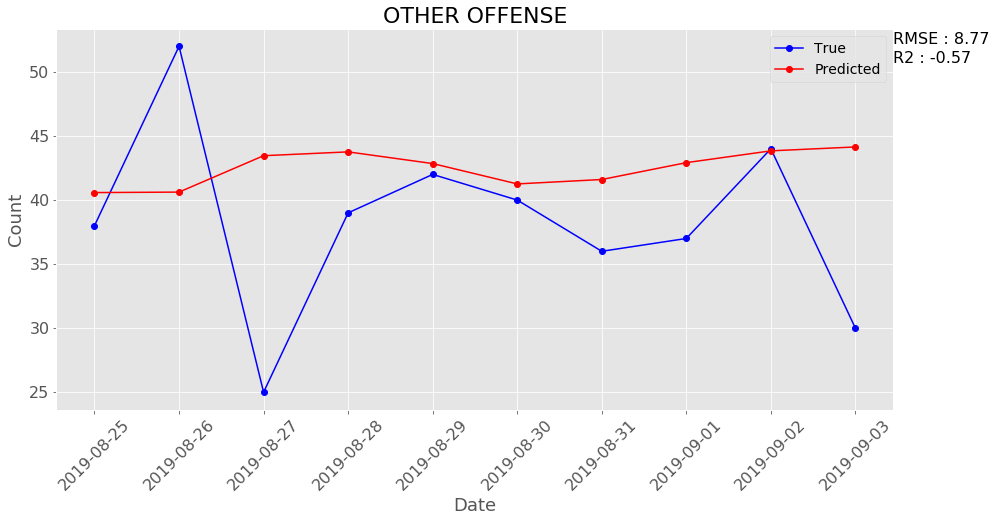

In [253]:
true_values = arima_df_day["OTHER OFFENSE"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_oo, dates, title = "OTHER OFFENSE")

ARIMA(15,0,0) can predict OTHER OFFENSE with the R2 value of -0.57 which means model is worse than fitting the mean to the data. RMSE is 8.77.

### First order difference of the OTHER OFFENSE

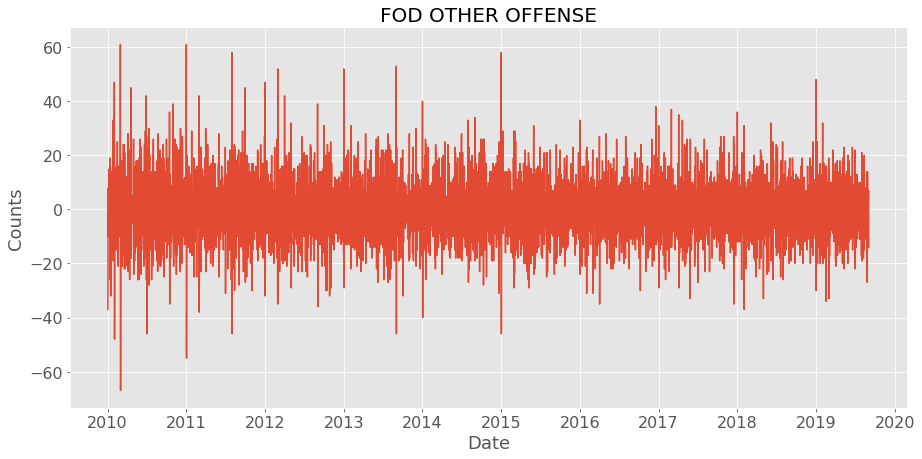

In [254]:
differenced_oo = custom_functions.difference(arima_df_day["OTHER OFFENSE"], interval = 1)
custom_functions.sequence_plot(differenced_oo, arima_df_day["Date"][1:], title = "FOD OTHER OFFENSE")

In [255]:
forecast_oo1 = custom_functions.fit_ARIMA(series, series.index, order = (14, 1, 0), trend = "nc", 
                                           title = "FOD OTHER OFFENSE", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                             ARIMA Model Results                              
Dep. Variable:        D.OTHER OFFENSE   No. Observations:                 3522
Model:                ARIMA(14, 1, 0)   Log Likelihood              -12878.374
Method:                       css-mle   S.D. of innovations              9.368
Date:                Tue, 05 Nov 2019   AIC                          25786.748
Time:                        06:03:25   BIC                          25879.250
Sample:                    01-01-1970   HQIC                         25819.750
                         - 01-01-1970                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
ar.L1.D.OTHER OFFENSE     -0.8625      0.017    -51.147      0.000      -0.896      -0.829
ar.L2.D.OTHER OFFENSE     -0.7839      0.022    -35.608      0.000      -0.827      -0.741
ar.L

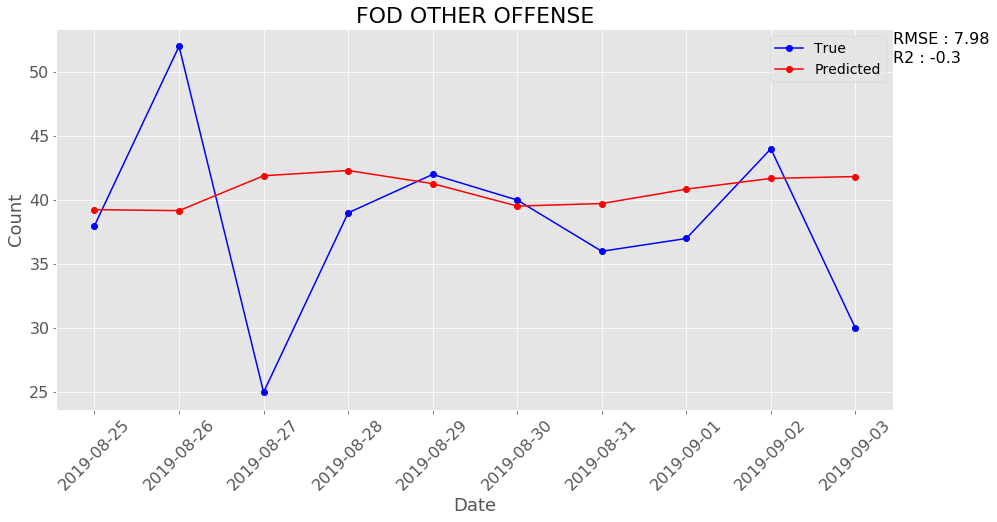

In [256]:
custom_functions.plot_true_vs_predicted(true_values, forecast_oo1, dates, title = "FOD OTHER OFFENSE")

Model with FOD data is performing better than the former model. But these two models are useless as they give negative R2 value.

## BURGLARY

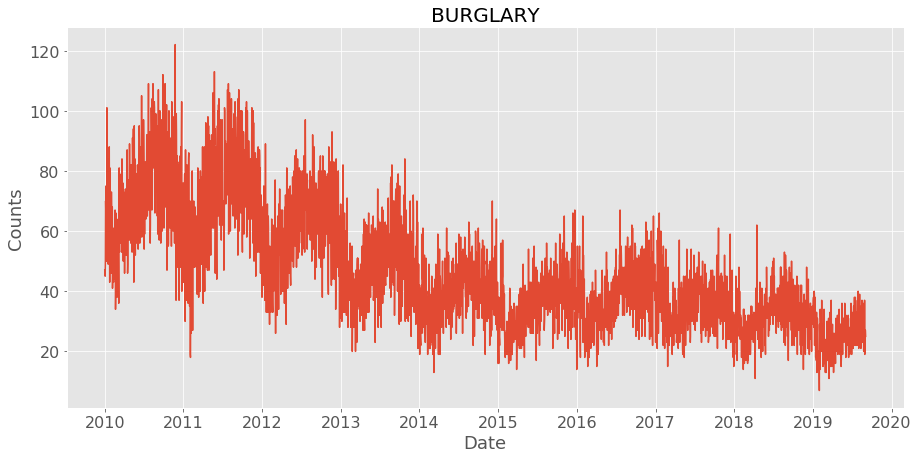

In [257]:
custom_functions.sequence_plot(arima_df_day["BURGLARY"], arima_df_day["Date"], "BURGLARY")

### Plotting ACF and PACF to decide the model

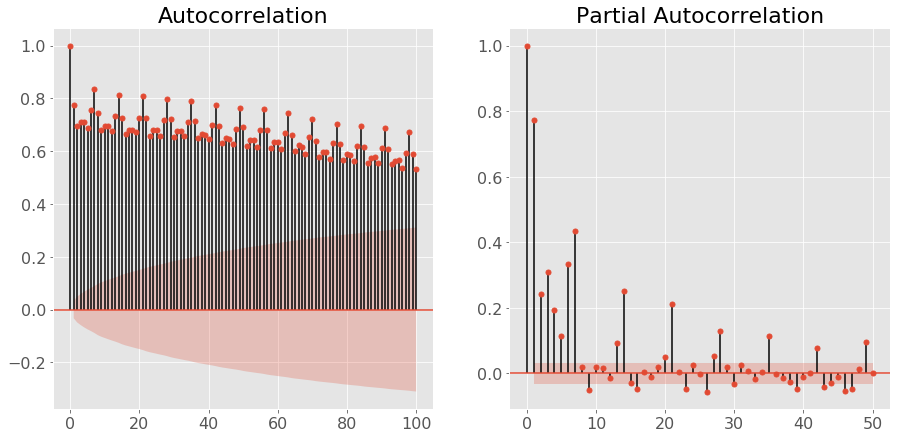

In [258]:
custom_functions.plot_ACF_PACF(arima_df_day["BURGLARY"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms. BUt AR15 term was insignificant so taking AR14.

### Fitting ARIMA(14, 0, 0) to BURGLARY

In [259]:
series = arima_df_day["BURGLARY"][:-10]
series.index = arima_df_day.index[:-10]
forecast_bur = custom_functions.fit_ARIMA(series, series.index, order = (14, 0, 0), title = "BURGLARY", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:               BURGLARY   No. Observations:                 3523
Model:                    ARMA(14, 0)   Log Likelihood              -12835.123
Method:                       css-mle   S.D. of innovations              9.241
Date:                Tue, 05 Nov 2019   AIC                          25702.247
Time:                        06:04:02   BIC                          25800.920
Sample:                    01-01-1970   HQIC                         25737.450
                         - 01-01-1970                                         
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              46.6263      6.530      7.140      0.000      33.828      59.425
ar.L1.BURGLARY      0.2166      0.016     13.281      0.000       0.185       0.249
ar.L2.BURGLARY      0.0172      

### Evaluating the model

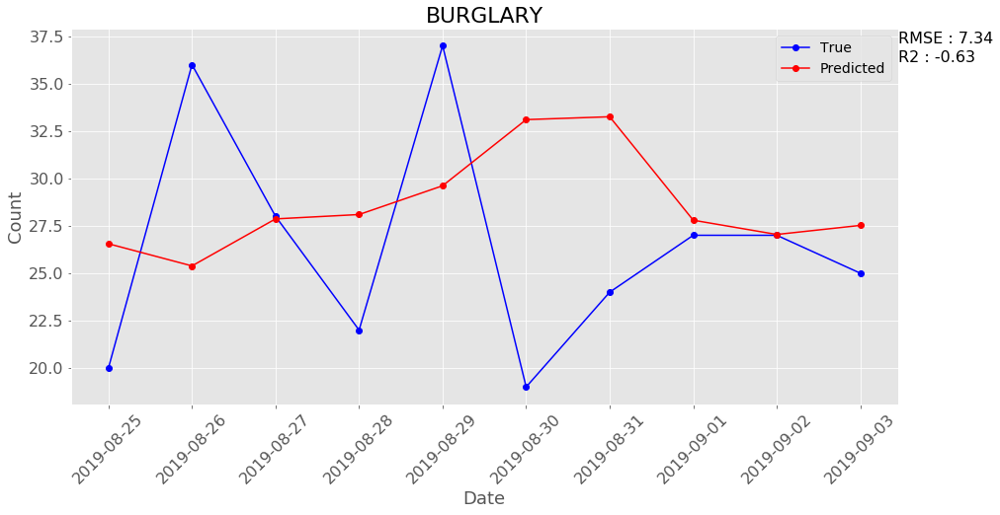

In [260]:
true_values = arima_df_day["BURGLARY"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_bur, dates, title = "BURGLARY")

ARIMA(14,0,0) can predict BURGLARY with the R2 value of -0.63 which means model is worse than fitting the mean to the data. RMSE is 7.34.

### First order difference of the BURGLARY

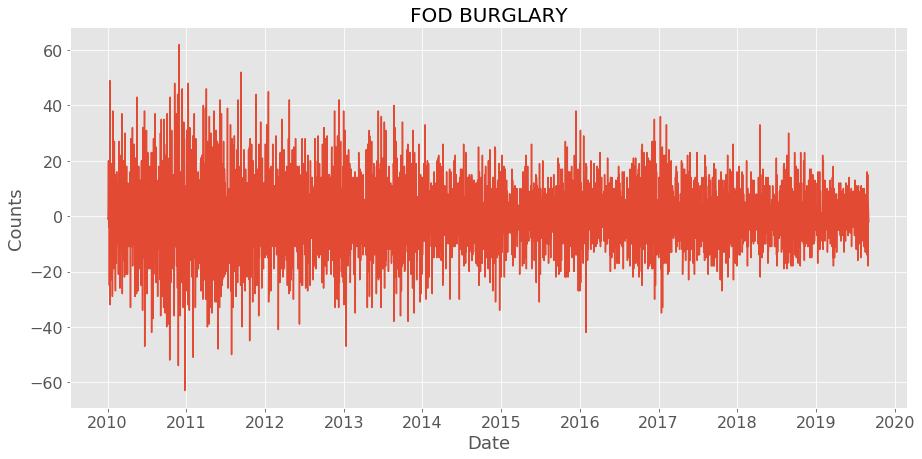

In [261]:
differenced_bur = custom_functions.difference(arima_df_day["BURGLARY"], interval = 1)
custom_functions.sequence_plot(differenced_bur, arima_df_day["Date"][1:], title = "FOD BURGLARY")

In [262]:
forecast_bur1 = custom_functions.fit_ARIMA(series, series.index, order = (15, 1, 0), trend = "nc", 
                                           title = "FOD BURGLARY", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                             ARIMA Model Results                              
Dep. Variable:             D.BURGLARY   No. Observations:                 3522
Model:                ARIMA(15, 1, 0)   Log Likelihood              -12828.985
Method:                       css-mle   S.D. of innovations              9.236
Date:                Tue, 05 Nov 2019   AIC                          25689.971
Time:                        06:04:44   BIC                          25788.640
Sample:                    01-01-1970   HQIC                         25725.173
                         - 01-01-1970                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
ar.L1.D.BURGLARY     -0.7755      0.017    -46.037      0.000      -0.809      -0.743
ar.L2.D.BURGLARY     -0.7440      0.021    -34.917      0.000      -0.786      -0.702
ar.L3.D.BURGLARY     -0.

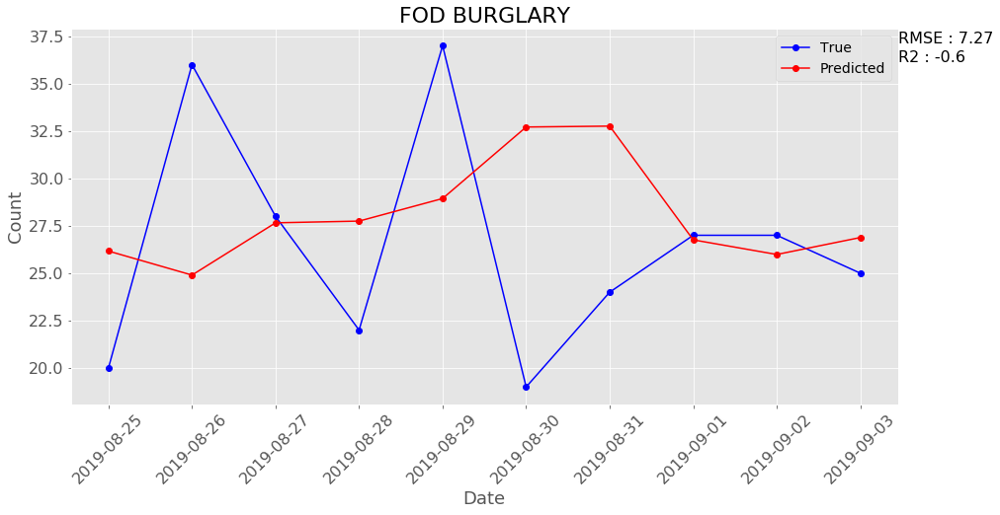

In [263]:
custom_functions.plot_true_vs_predicted(true_values, forecast_bur1, dates, title = "FOD BURGLARY")

Both models fitted above are useless.

## THEFT

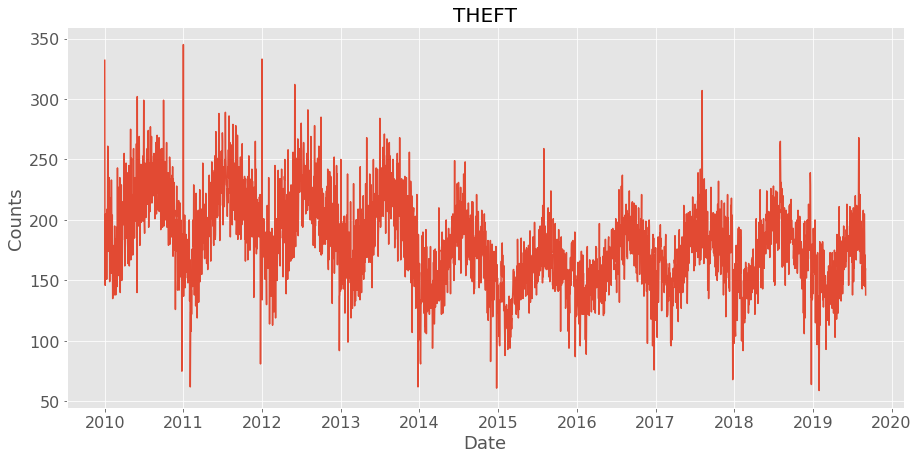

In [264]:
custom_functions.sequence_plot(arima_df_day["THEFT"], arima_df_day["Date"], "THEFT")

### Plotting ACF and PACF to decide the model

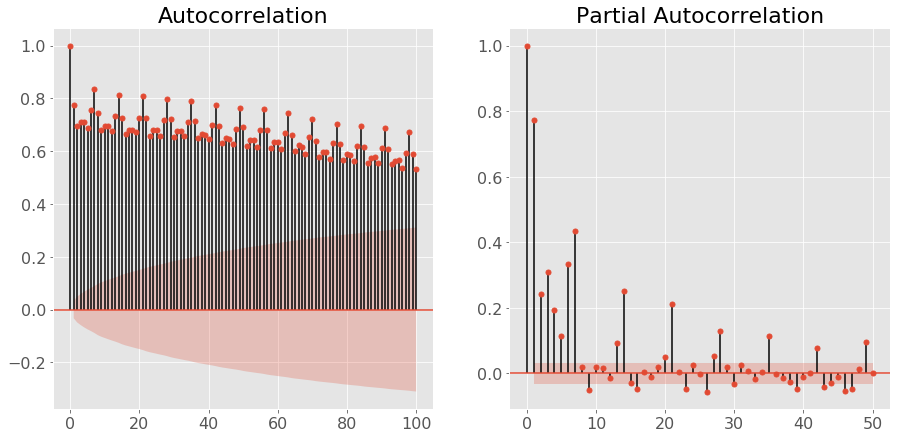

In [265]:
custom_functions.plot_ACF_PACF(arima_df_day["BURGLARY"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms.

### Fitting ARIMA(15, 0, 0) to THEFT

In [266]:
series = arima_df_day["THEFT"][:-10]
series.index = arima_df_day.index[:-10]
forecast_the = custom_functions.fit_ARIMA(series, series.index, order = (15, 0, 0), title = "THEFT", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:                  THEFT   No. Observations:                 3523
Model:                    ARMA(15, 0)   Log Likelihood              -15911.615
Method:                       css-mle   S.D. of innovations             22.135
Date:                Tue, 05 Nov 2019   AIC                          31857.230
Time:                        06:05:29   BIC                          31962.070
Sample:                    01-01-1970   HQIC                         31894.634
                         - 01-01-1970                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const          182.3553      6.783     26.884      0.000     169.061     195.650
ar.L1.THEFT      0.2550      0.017     15.089      0.000       0.222       0.288
ar.L2.THEFT      0.0898      0.017      5.30

### Evaluating the model

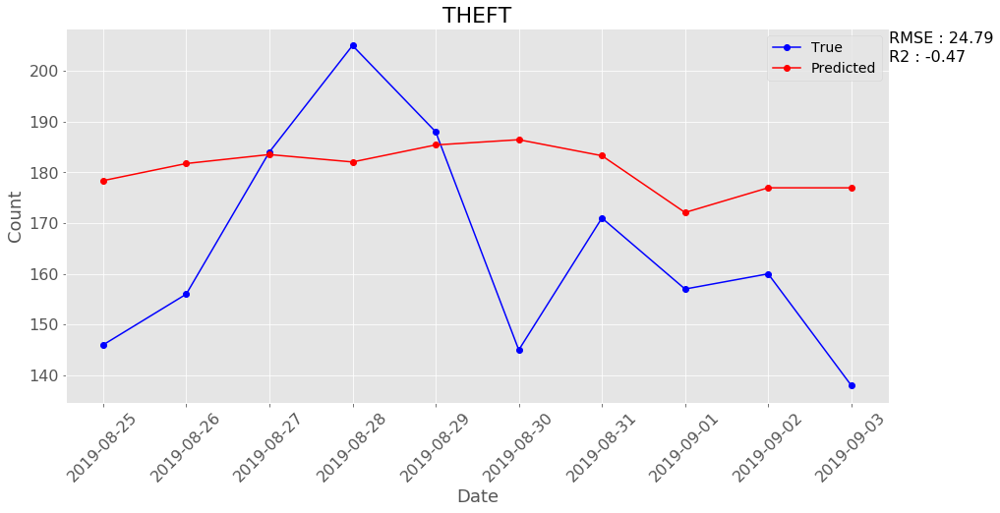

In [267]:
true_values = arima_df_day["THEFT"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_the, dates, title = "THEFT")

ARIMA(15,0,0) can predict THEFT with the R2 value of -0.47 which means model is worse than fitting the mean to the data. RMSE is 24.79.

### First order difference of the THEFT

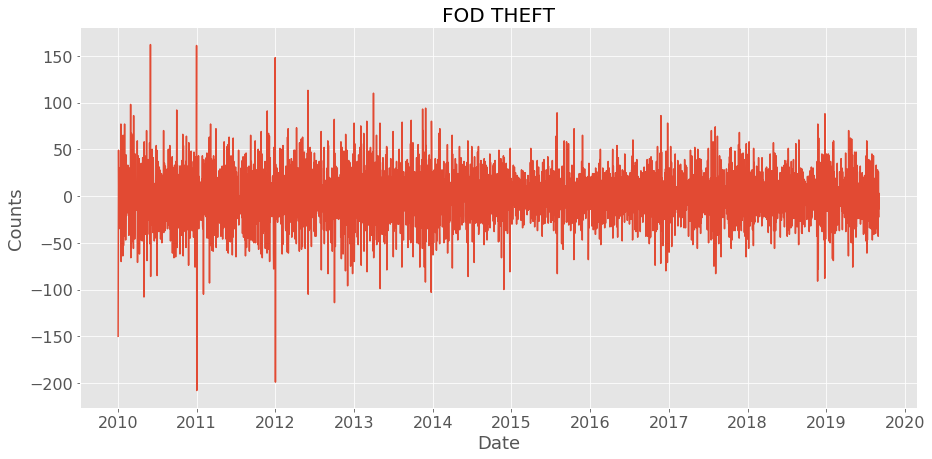

In [268]:
differenced_the = custom_functions.difference(arima_df_day["THEFT"], interval = 1)
custom_functions.sequence_plot(differenced_the, arima_df_day["Date"][1:], title = "FOD THEFT")

In [269]:
forecast_the1 = custom_functions.fit_ARIMA(series, series.index, order = (15, 1, 0), trend = "nc", 
                                           title = "FOD THEFT", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                             ARIMA Model Results                              
Dep. Variable:                D.THEFT   No. Observations:                 3522
Model:                ARIMA(15, 1, 0)   Log Likelihood              -15912.794
Method:                       css-mle   S.D. of innovations             22.172
Date:                Tue, 05 Nov 2019   AIC                          31857.587
Time:                        06:06:13   BIC                          31956.256
Sample:                    01-01-1970   HQIC                         31892.790
                         - 01-01-1970                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
ar.L1.D.THEFT     -0.7426      0.017    -43.888      0.000      -0.776      -0.709
ar.L2.D.THEFT     -0.6395      0.021    -30.395      0.000      -0.681      -0.598
ar.L3.D.THEFT     -0.5596      0.023

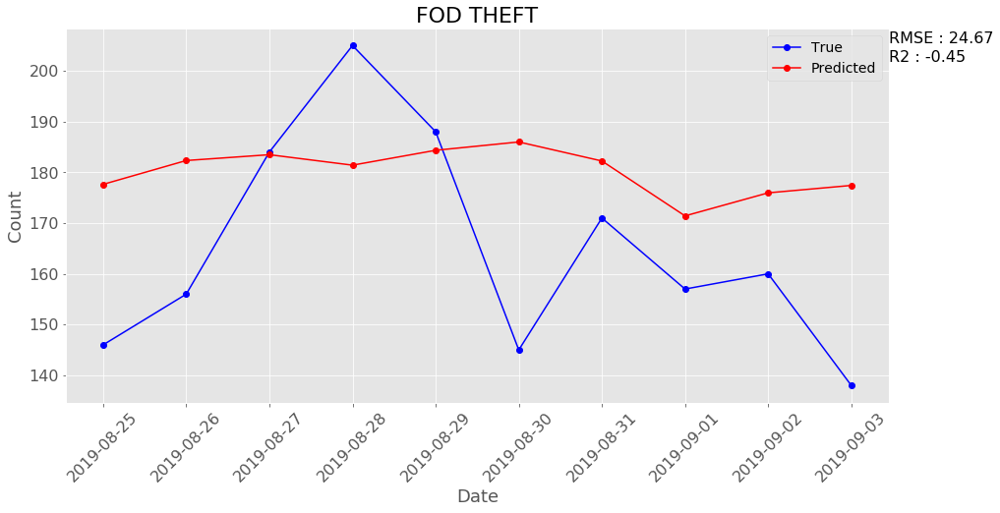

In [270]:
custom_functions.plot_true_vs_predicted(true_values, forecast_the1, dates, title = "FOD THEFT")

Both models fitted above are useless.

## CRIMINAL TRESPASS

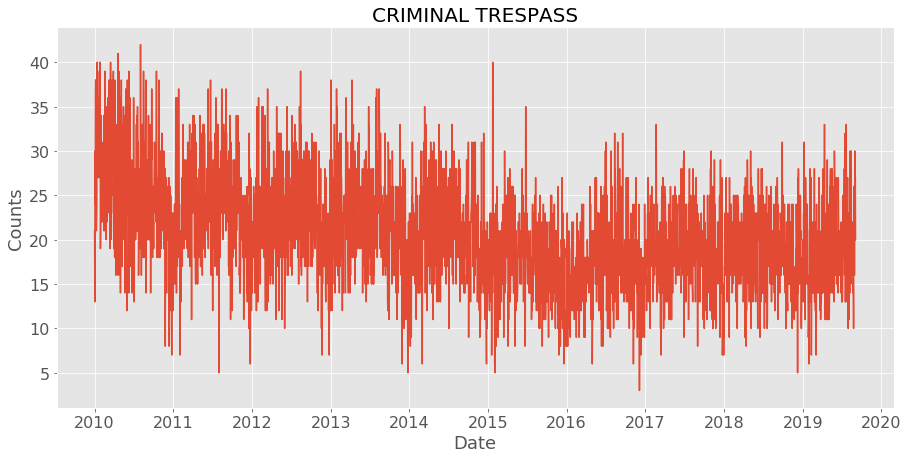

In [271]:
custom_functions.sequence_plot(arima_df_day["CRIMINAL TRESPASS"], arima_df_day["Date"], "CRIMINAL TRESPASS")

### Plotting ACF and PACF to decide the model

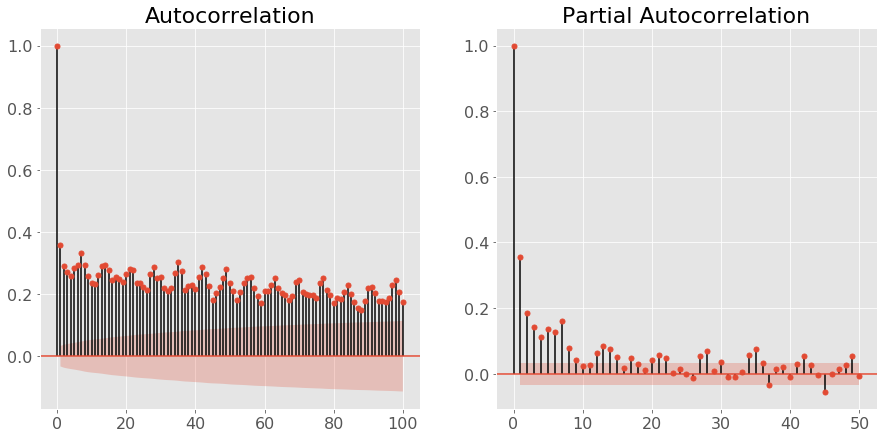

In [272]:
custom_functions.plot_ACF_PACF(arima_df_day["CRIMINAL TRESPASS"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms.

### Fitting ARIMA(15, 0, 0) to CRIMINAL TRESPASS

In [273]:
series = arima_df_day["CRIMINAL TRESPASS"][:-10]
series.index = arima_df_day.index[:-10]
forecast_ct = custom_functions.fit_ARIMA(series, series.index, order = (15, 0, 0), title = "CRIMINAL TRESPASS", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:      CRIMINAL TRESPASS   No. Observations:                 3523
Model:                    ARMA(15, 0)   Log Likelihood              -10750.783
Method:                       css-mle   S.D. of innovations              5.117
Date:                Tue, 05 Nov 2019   AIC                          21535.566
Time:                        06:06:53   BIC                          21640.406
Sample:                    01-01-1970   HQIC                         21572.970
                         - 01-01-1970                                         
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                       20.5914      0.550     37.406      0.000      19.512      21.670
ar.L1.CRIMINAL TRESPASS      0.1587      0.017      9.432      0.000       0.126       0.

### Evaluating the model

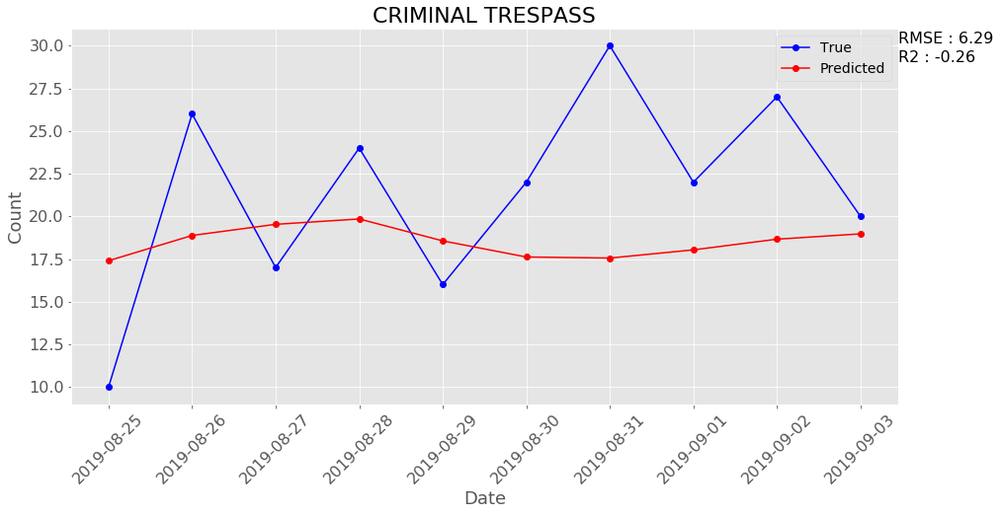

In [274]:
true_values = arima_df_day["CRIMINAL TRESPASS"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_ct, dates, title = "CRIMINAL TRESPASS")

ARIMA(15,0,0) can predict CRIMINAL TRESPASS with the R2 value of -0.26 which means model is worse than fitting the mean to the data. RMSE is 6.29.

### First order difference of the CRIMINAL TRESPASS

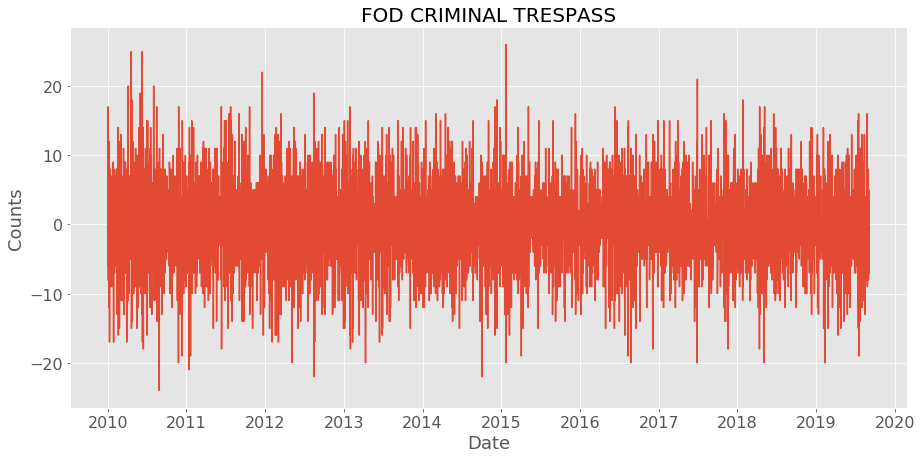

In [275]:
differenced_ct = custom_functions.difference(arima_df_day["CRIMINAL TRESPASS"], interval = 1)
custom_functions.sequence_plot(differenced_ct, arima_df_day["Date"][1:], title = "FOD CRIMINAL TRESPASS")

In [276]:
forecast_ct1 = custom_functions.fit_ARIMA(series, series.index, order = (15, 1, 0), trend = "nc", 
                                           title = "FOD CRIMINAL TRESPASS", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARIMA Model Results                              
Dep. Variable:     D.CRIMINAL TRESPASS   No. Observations:                 3522
Model:                 ARIMA(15, 1, 0)   Log Likelihood              -10765.253
Method:                        css-mle   S.D. of innovations              5.142
Date:                 Tue, 05 Nov 2019   AIC                          21562.506
Time:                         06:07:38   BIC                          21661.174
Sample:                     01-01-1970   HQIC                         21597.708
                          - 01-01-1970                                         
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
ar.L1.D.CRIMINAL TRESPASS     -0.8321      0.017    -49.386      0.000      -0.865      -0.799
ar.L2.D.CRIMINAL TRESPASS     -0.7677      0.022    -35.044      0.000     

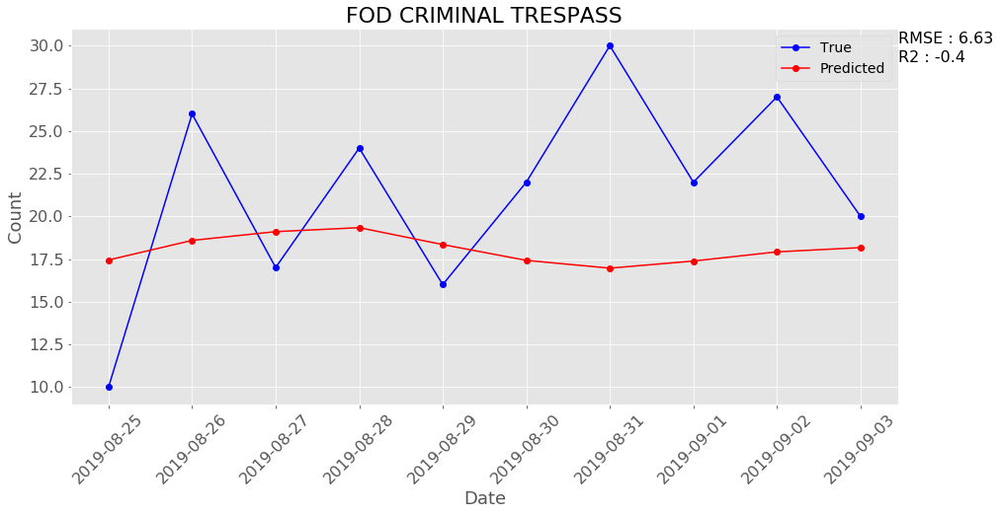

In [277]:
custom_functions.plot_true_vs_predicted(true_values, forecast_ct1, dates, title = "FOD CRIMINAL TRESPASS")

Both models fitted above are useless.

## DECEPTIVE PRACTICE

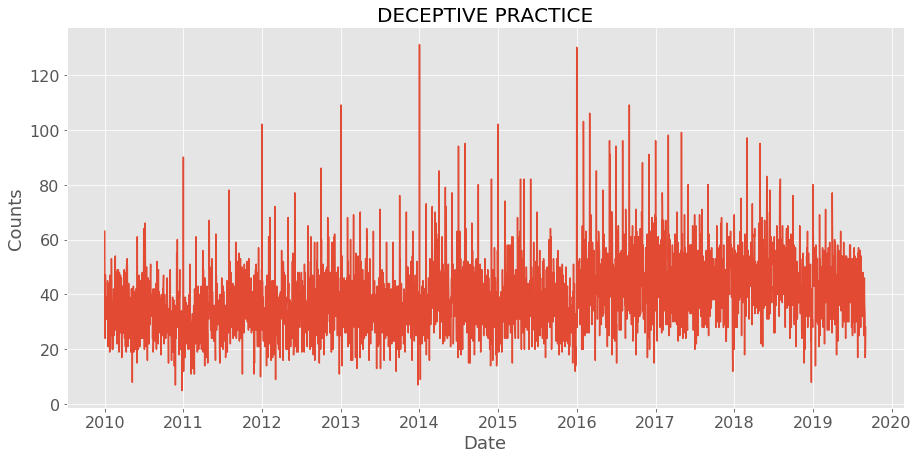

In [278]:
custom_functions.sequence_plot(arima_df_day["DECEPTIVE PRACTICE"], arima_df_day["Date"], "DECEPTIVE PRACTICE")

### Plotting ACF and PACF to decide the model

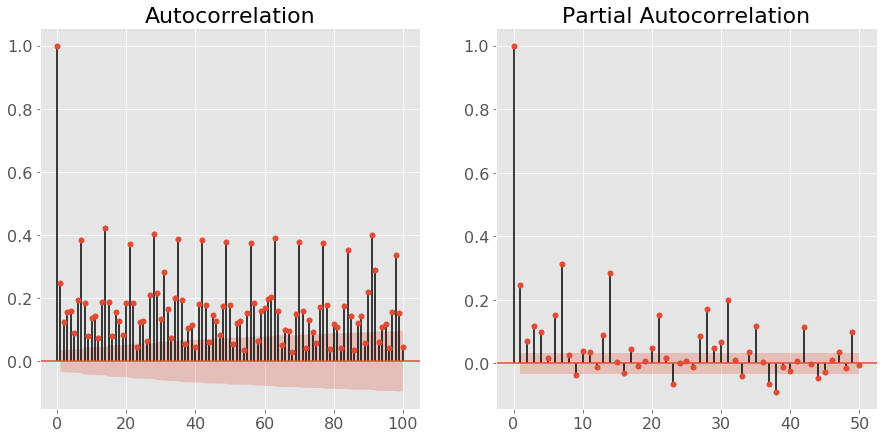

In [279]:
custom_functions.plot_ACF_PACF(arima_df_day["DECEPTIVE PRACTICE"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms. AR15 was insignificant so trying AR14.

### Fitting ARIMA(14, 0, 0) to DECEPTIVE PRACTICE

In [280]:
series = arima_df_day["DECEPTIVE PRACTICE"][:-10]
series.index = arima_df_day.index[:-10]
forecast_dp = custom_functions.fit_ARIMA(series, series.index, order = (14, 0, 0), title = "DECEPTIVE PRACTICE", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:     DECEPTIVE PRACTICE   No. Observations:                 3523
Model:                    ARMA(14, 0)   Log Likelihood              -13467.558
Method:                       css-mle   S.D. of innovations             11.062
Date:                Tue, 05 Nov 2019   AIC                          26967.116
Time:                        06:08:13   BIC                          27065.789
Sample:                    01-01-1970   HQIC                         27002.320
                         - 01-01-1970                                         
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        40.0695      0.923     43.415      0.000      38.261      41.878
ar.L1.DECEPTIVE PRACTICE      0.1265      0.016      7.829      0.000       0.095     

### Evaluating the model

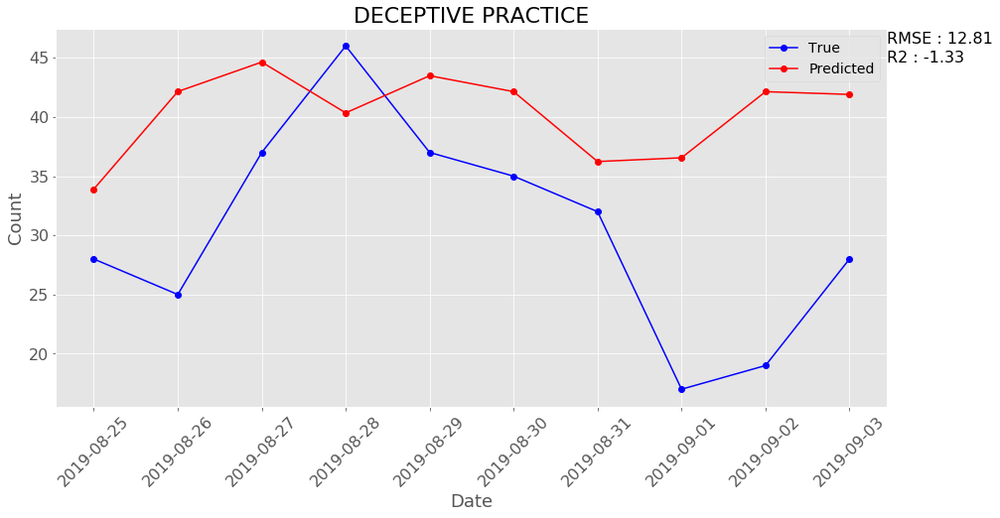

In [281]:
true_values = arima_df_day["DECEPTIVE PRACTICE"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_dp, dates, title = "DECEPTIVE PRACTICE")

ARIMA(14,0,0) can predict DECEPTIVE PRACTICE with the R2 value of -1.33 which means model is worse than fitting the mean to the data. RMSE is 12.81.

### First order difference of the DECEPTIVE PRACTICE

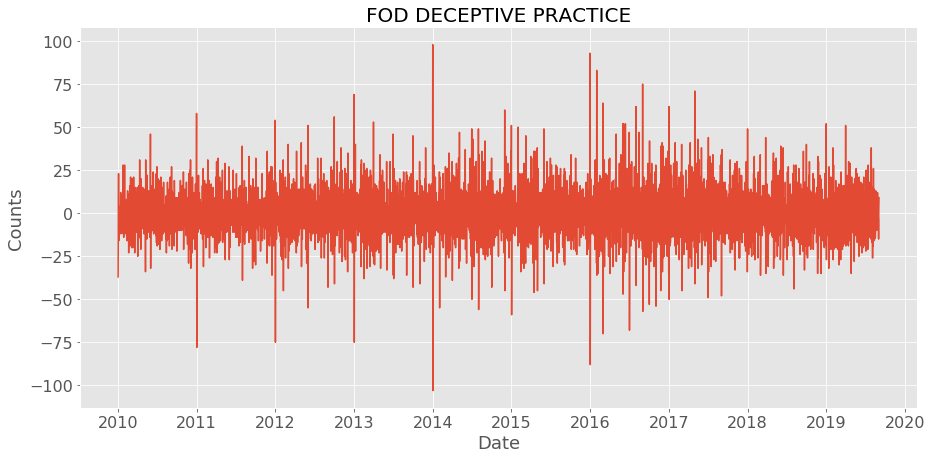

In [282]:
differenced_dp = custom_functions.difference(arima_df_day["DECEPTIVE PRACTICE"], interval = 1)
custom_functions.sequence_plot(differenced_dp, arima_df_day["Date"][1:], title = "FOD DECEPTIVE PRACTICE")

In [283]:
# Tried fitting ARIMA(14,1,0) but AR14 term was insignificant
forecast_dp1 = custom_functions.fit_ARIMA(series, series.index, order = (13, 1, 0), trend = "nc", 
                                           title = "FOD DECEPTIVE PRACTICE", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARIMA Model Results                               
Dep. Variable:     D.DECEPTIVE PRACTICE   No. Observations:                 3522
Model:                  ARIMA(13, 1, 0)   Log Likelihood              -13486.632
Method:                         css-mle   S.D. of innovations             11.132
Date:                  Tue, 05 Nov 2019   AIC                          27001.264
Time:                          06:08:44   BIC                          27087.599
Sample:                      01-01-1970   HQIC                         27032.066
                           - 01-01-1970                                         
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
ar.L1.D.DECEPTIVE PRACTICE     -0.8572      0.016    -53.294      0.000      -0.889      -0.826
ar.L2.D.DECEPTIVE PRACTICE     -0.8023      0.021    -38.673    

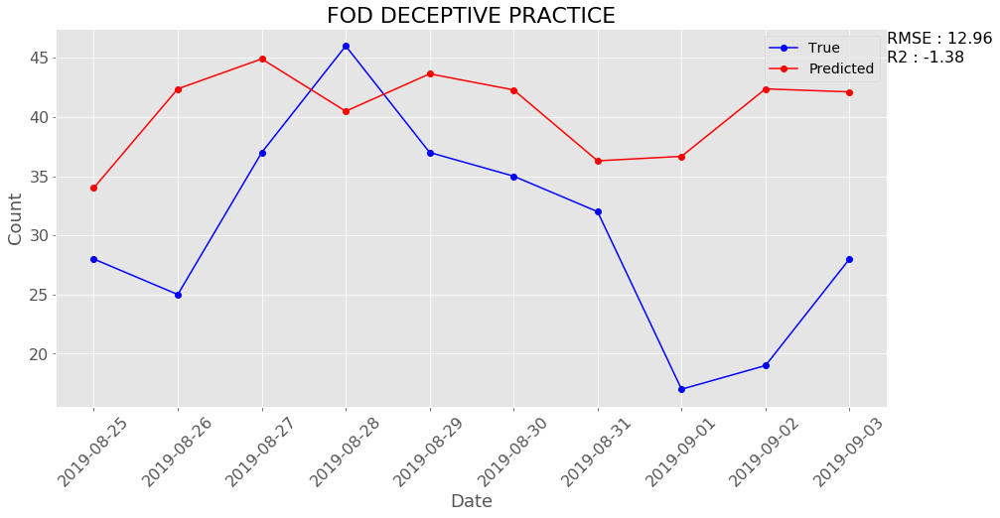

In [284]:
custom_functions.plot_true_vs_predicted(true_values, forecast_dp1, dates, title = "FOD DECEPTIVE PRACTICE")

Both models fitted above are useless.

## NARCOTICS

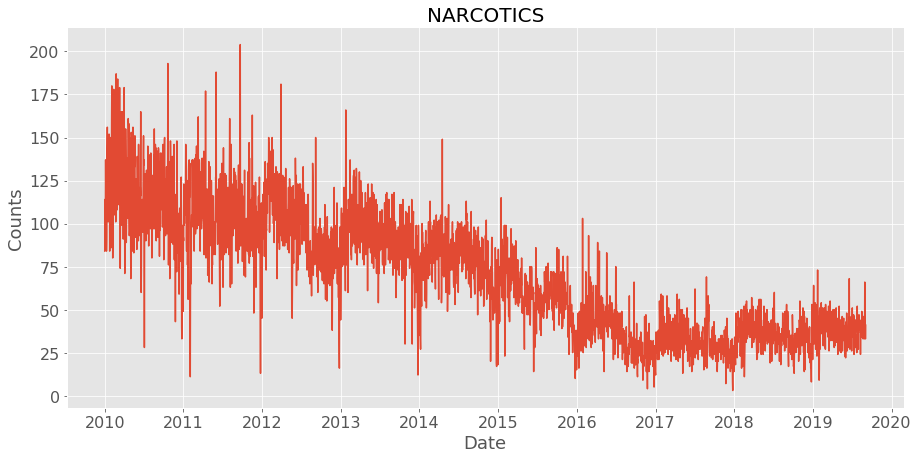

In [285]:
custom_functions.sequence_plot(arima_df_day["NARCOTICS"], arima_df_day["Date"], "NARCOTICS")

### Plotting ACF and PACF to decide the model

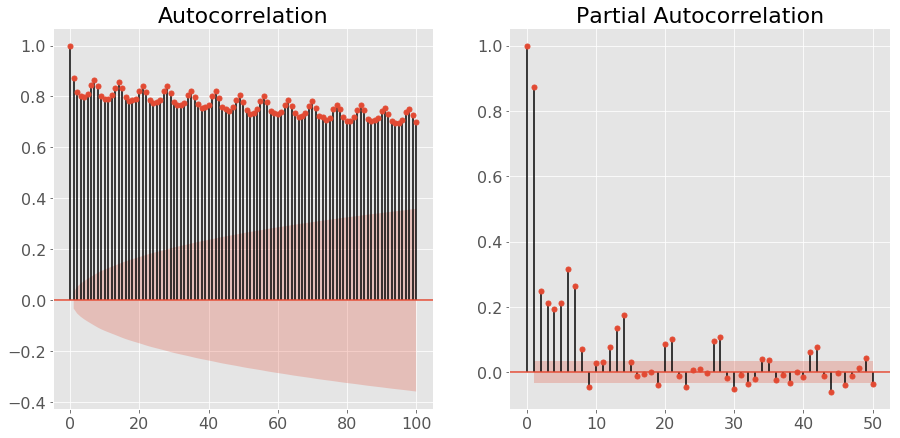

In [286]:
custom_functions.plot_ACF_PACF(arima_df_day["NARCOTICS"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms.

### Fitting ARIMA(15, 0, 0) to NARCOTICS

In [287]:
series = arima_df_day["NARCOTICS"][:-10]
series.index = arima_df_day.index[:-10]
forecast_nar = custom_functions.fit_ARIMA(series, series.index, order = (15, 0, 0), title = "NARCOTICS", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                              ARMA Model Results                              
Dep. Variable:              NARCOTICS   No. Observations:                 3523
Model:                    ARMA(15, 0)   Log Likelihood              -14335.979
Method:                       css-mle   S.D. of innovations             14.150
Date:                Tue, 05 Nov 2019   AIC                          28705.958
Time:                        06:09:18   BIC                          28810.798
Sample:                    01-01-1970   HQIC                         28743.362
                         - 01-01-1970                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               71.3064     15.502      4.600      0.000      40.924     101.689
ar.L1.NARCOTICS      0.3061      0.017     18.168      0.000       0.273       0.339
ar.L2.NARCOTICS      0.0185 

### Evaluating the model

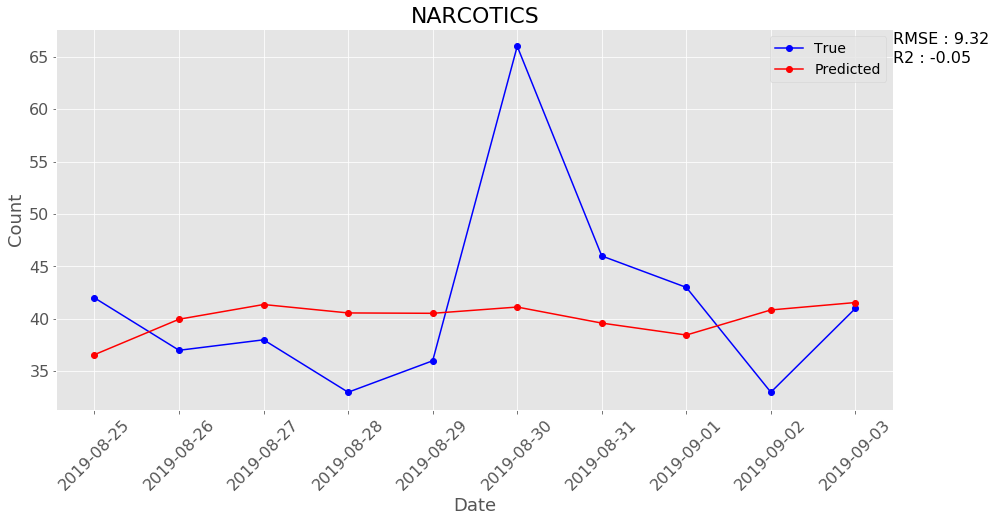

In [288]:
true_values = arima_df_day["NARCOTICS"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_nar, dates, title = "NARCOTICS")

ARIMA(15,0,0) can predict NARCOTICS with the R2 value of -0.05 which means model is worse than fitting the mean to the data. RMSE is 9.32.

### First order difference of the NARCOTICS

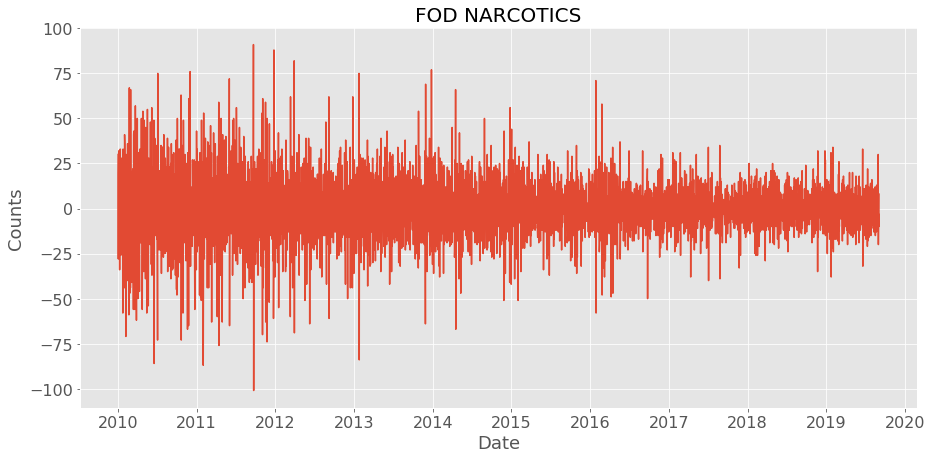

In [289]:
differenced_nar = custom_functions.difference(arima_df_day["NARCOTICS"], interval = 1)
custom_functions.sequence_plot(differenced_nar, arima_df_day["Date"][1:], title = "FOD NARCOTICS")

In [290]:
forecast_nar1 = custom_functions.fit_ARIMA(series, series.index, order = (14, 1, 0), trend = "nc", 
                                           title = "FOD NARCOTICS", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                             ARIMA Model Results                              
Dep. Variable:            D.NARCOTICS   No. Observations:                 3522
Model:                ARIMA(14, 1, 0)   Log Likelihood              -14332.823
Method:                       css-mle   S.D. of innovations             14.157
Date:                Tue, 05 Nov 2019   AIC                          28695.646
Time:                        06:09:57   BIC                          28788.147
Sample:                    01-01-1970   HQIC                         28728.648
                         - 01-01-1970                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
ar.L1.D.NARCOTICS     -0.6929      0.017    -41.111      0.000      -0.726      -0.660
ar.L2.D.NARCOTICS     -0.6735      0.020    -33.337      0.000      -0.713      -0.634
ar.L3.D.NARCOTICS   

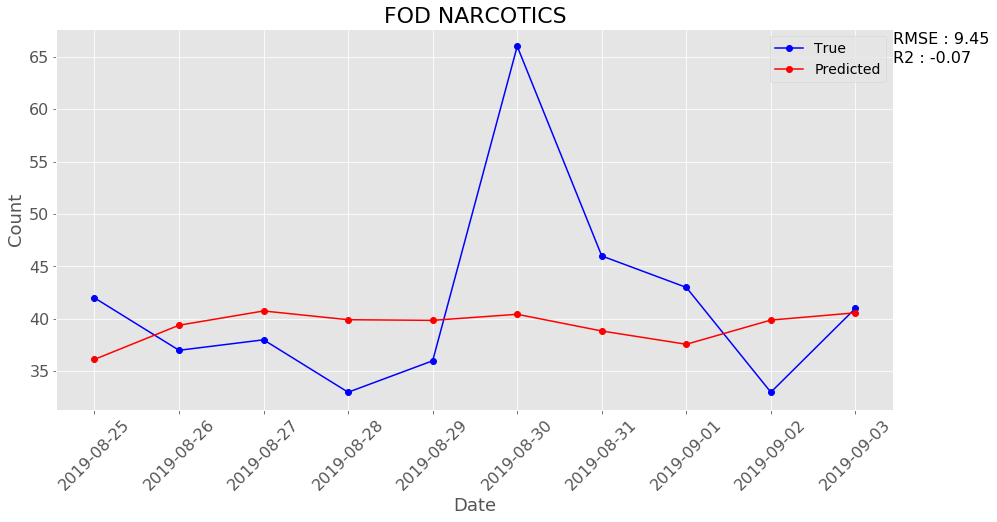

In [291]:
custom_functions.plot_true_vs_predicted(true_values, forecast_nar1, dates, title = "FOD NARCOTICS")

Both models fitted above are useless.

## PUBLIC PEACE VIOLATION

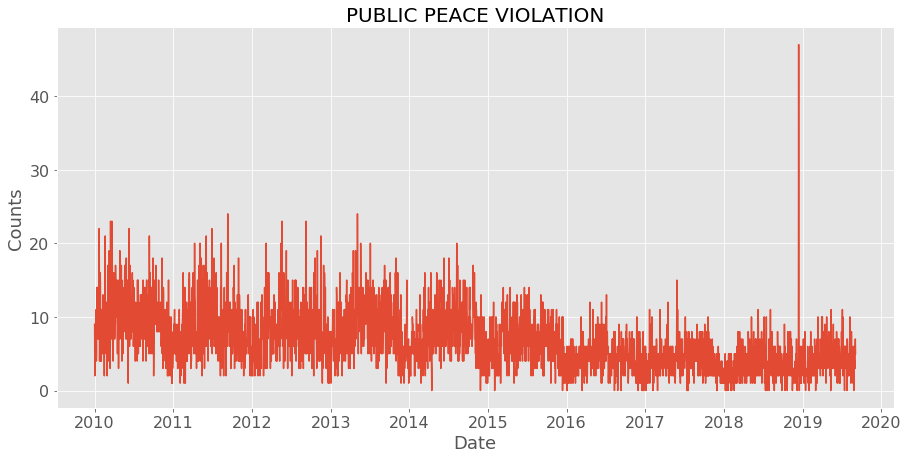

In [292]:
custom_functions.sequence_plot(arima_df_day["PUBLIC PEACE VIOLATION"], arima_df_day["Date"], "PUBLIC PEACE VIOLATION")

### Plotting ACF and PACF to decide the model

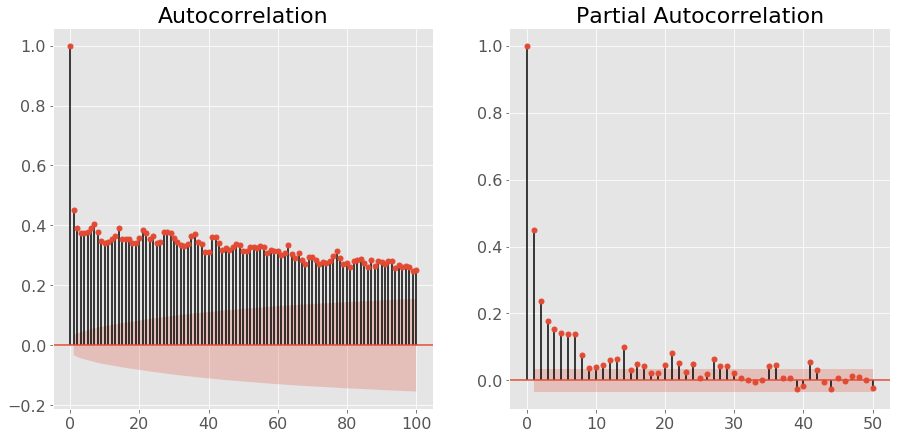

In [293]:
custom_functions.plot_ACF_PACF(arima_df_day["PUBLIC PEACE VIOLATION"])

Choosing ARIMA(15, 0, 0) Model as 15 lags are popping out in PACF plot and there is a gradual decrease in the ACF plot which suggests taking AR terms. AR15 was insignificant so fitting AR14.

### Fitting ARIMA(14, 0, 0) to PUBLIC PEACE VIOLATION

In [294]:
series = arima_df_day["PUBLIC PEACE VIOLATION"][:-10]
series.index = arima_df_day.index[:-10]
forecast_ppv = custom_functions.fit_ARIMA(series, series.index, order = (14, 0, 0), title = "PUBLIC PEACE VIOLATION", 
                                          print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                                ARMA Model Results                                
Dep. Variable:     PUBLIC PEACE VIOLATION   No. Observations:                 3523
Model:                        ARMA(14, 0)   Log Likelihood               -9083.241
Method:                           css-mle   S.D. of innovations              3.187
Date:                    Tue, 05 Nov 2019   AIC                          18198.483
Time:                            06:10:25   BIC                          18297.156
Sample:                        01-01-1970   HQIC                         18233.686
                             - 01-01-1970                                         
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                             6.6361      0.440     15.097      0.000       5.775       7.498
ar.L1.PUBLIC PEACE VIOLATION      0.1838  

### Evaluating the model

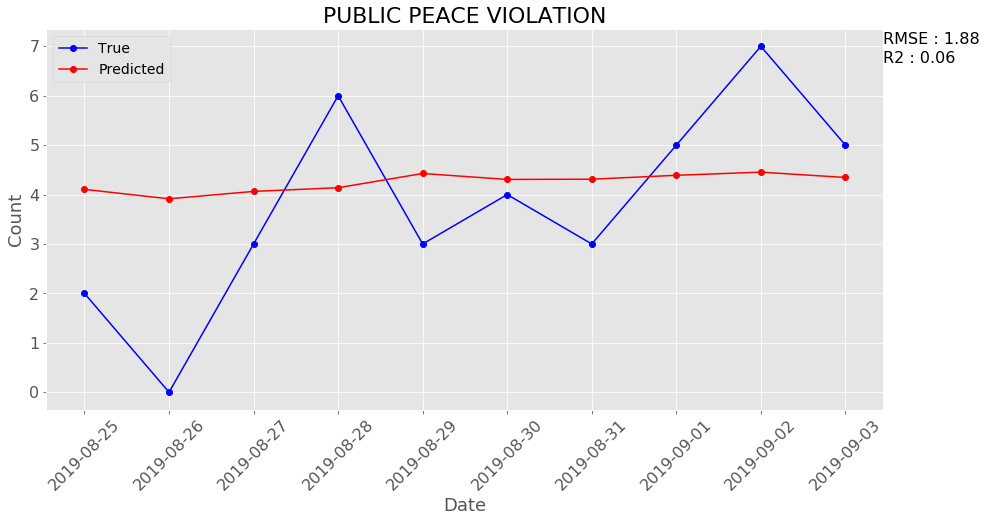

In [295]:
true_values = arima_df_day["PUBLIC PEACE VIOLATION"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_ppv, dates, title = "PUBLIC PEACE VIOLATION")

ARIMA(15,0,0) can predict PUBLIC PEACE VIOLATION with the R2 value of 0.06 which means model is just good as fitting the mean to the data. RMSE is 1.88.

### First order difference of the PUBLIC PEACE VIOLATION

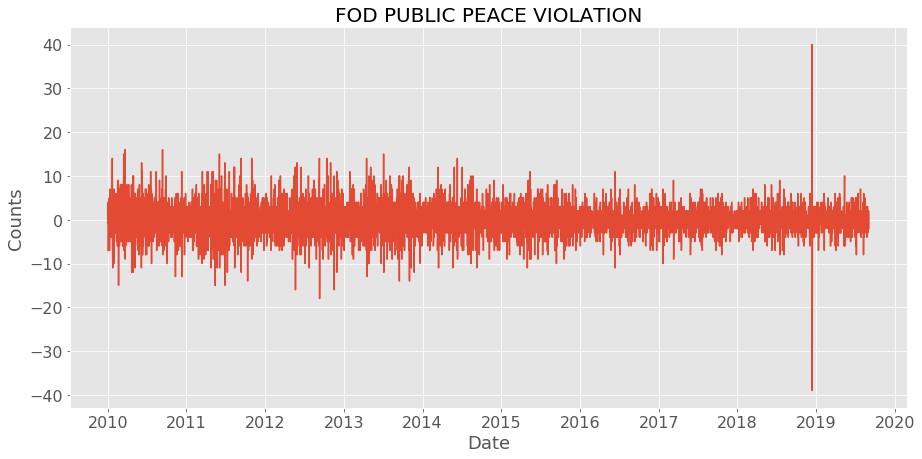

In [296]:
differenced_ppv = custom_functions.difference(arima_df_day["PUBLIC PEACE VIOLATION"], interval = 1)
custom_functions.sequence_plot(differenced_ppv, arima_df_day["Date"][1:], title = "FOD PUBLIC PEACE VIOLATION")

In [297]:
forecast_ppv1 = custom_functions.fit_ARIMA(series, series.index, order = (14, 1, 0), trend = "nc", 
                                           title = "FOD PUBLIC PEACE VIOLATION", print_summary = True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency N will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)


                                ARIMA Model Results                                 
Dep. Variable:     D.PUBLIC PEACE VIOLATION   No. Observations:                 3522
Model:                      ARIMA(14, 1, 0)   Log Likelihood               -9094.751
Method:                             css-mle   S.D. of innovations              3.200
Date:                      Tue, 05 Nov 2019   AIC                          18219.501
Time:                              06:10:59   BIC                          18312.003
Sample:                          01-01-1970   HQIC                         18252.504
                               - 01-01-1970                                         
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
ar.L1.D.PUBLIC PEACE VIOLATION     -0.8101      0.017    -48.114      0.000      -0.843      -0.777
ar.L2.D.PUBLIC PEACE

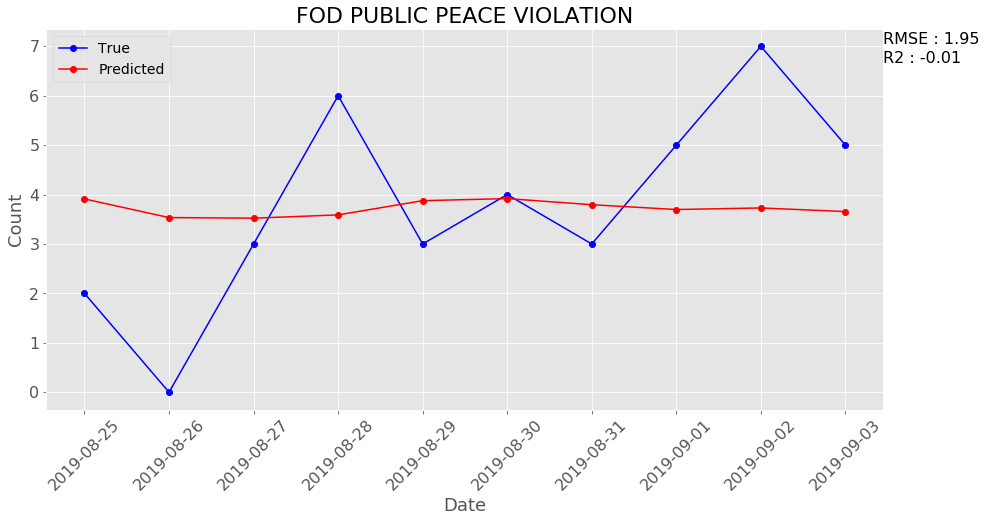

In [298]:
custom_functions.plot_true_vs_predicted(true_values, forecast_ppv1, dates, title = "FOD PUBLIC PEACE VIOLATION")

ARIMA model on FOD data gives negative R2. This model is useless.

### After Fitting ARIMA model and evaluating model performances, and seeing that there is a seasonal component in the data we will try to fit the SARIMA which is Seasonal ARIMA.

## What is SARIMA?

Autoregressive Integrated Moving Average, or ARIMA, is one of the most widely used forecasting methods for univariate time series data forecasting.

Although the method can handle data with a trend, it does not support time series with a seasonal component.

An extension to ARIMA that supports the direct modeling of the seasonal component of the series is called SARIMA.

Seasonality in a time series is a regular pattern of changes that repeats over S time periods, where S defines the number of time periods until the pattern repeats again.

For example, there is seasonality in monthly data for which high values tend always to occur in some particular months and low values tend always to occur in other particular months. In this case, S = 12 (months per year) is the span of the periodic seasonal behavior. For quarterly data, S = 4 time periods per year. For weekly data, S = 7.

In a seasonal ARIMA model, seasonal AR and MA terms predict using data values and errors at times with lags that are multiples of S (the span of the seasonality).

Source 1 - https://machinelearningmastery.com/sarima-for-time-series-forecasting-in-python/

Source 2 - https://newonlinecourses.science.psu.edu/stat510/lesson/4/4.1

## Crimes<a id = 'crimes_SARIMA'></a>

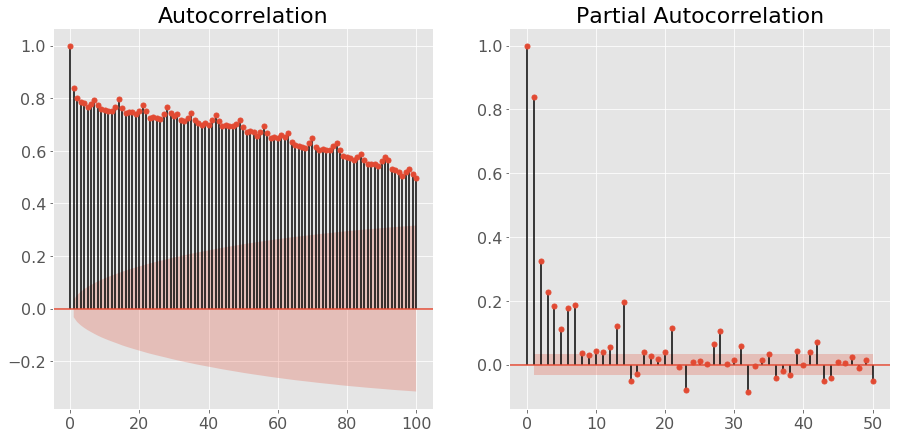

In [299]:
custom_functions.plot_ACF_PACF(arima_df_day["Crimes"])

To decide model parameters, We need to look at ACF and PACF plots. 
There are three classic cases.

1. CASE1 - Gradual decrease in ACF and Definite cut off in PACF plot. That suggests SAR(Seasonal AR) terms. To decide how many SAR terms we need to look at PACF plot and see how many bars are significantly out of confindence interval(red zone).

2. CASE2 - Gradual decrease in PACF and Definite cut off in ACF plot. That suggests SMA(Seasonal MA) terms. To decide how many SMA terms we need to look at ACF plot and see how many bars are significantly out of confindence interval(red zone).

3. CASE3 - Definite cut off in both ACF and PACF plots. That suggests both SAR and SMA terms. To decide how many SAR terms we need to look at PACF plot and to decide how many SMA terms we need to look at ACF plot and see how many bars are significantly out of confindence interval(red zone).


**Here we can see CASE1 in the above plots.**

Why we chose seasonl order of (AR = 0, D = 1, MA = 0, S = 7). We can see the bar in PACF plots poking out at every 7 day interval that's why we chose week as a season. And seasonal difference of 1 to make sure that data comes from a stationary process.

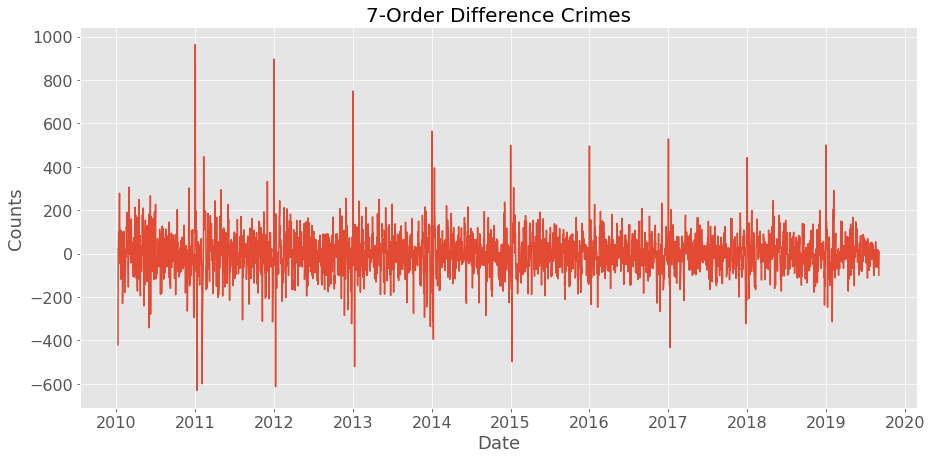

In [300]:
differenced = custom_functions.difference(arima_df_day["Crimes"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference Crimes")

Before applying Time series model SARIMA we need to check stationarity of the data which can be assessed by assessing following two things.

1. Data should fluctuate around the constant mean/value.
2. Variation of the data must be within a constant band.

If both conditions are true that means data comes from a **stationary process**(that means we can use it to predict and forecast) then only we can fit the SARIMA model to it. For the above graph both conditions are true so we will go ahead and fit SARIMA to the data.

In [301]:
series = arima_df_day["Crimes"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_crimes = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 0, 7), 
                                              title = "Crimes")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


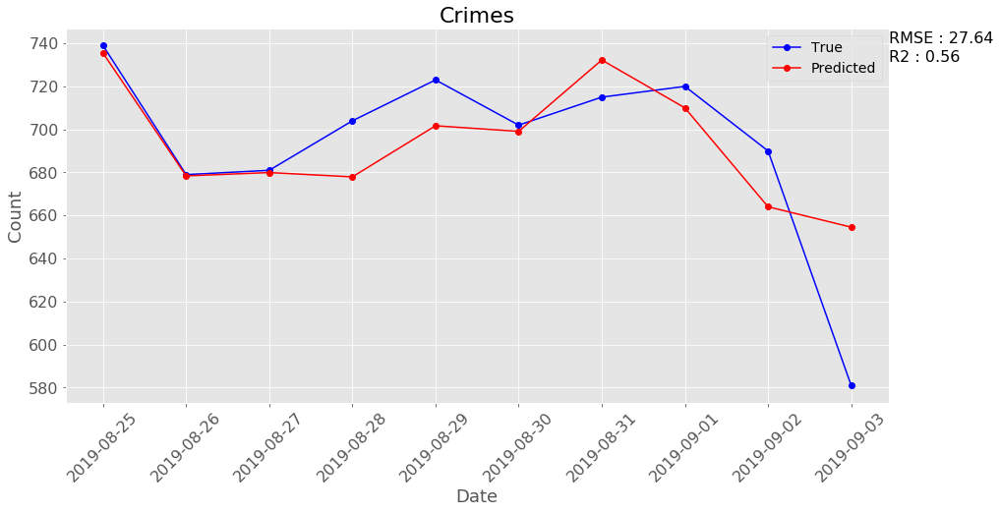

In [302]:
true_values = arima_df_day["Crimes"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_crimes, dates, title = "Crimes")

Model can explain 56% of the variation in the data with the RMSE value of 27.64

## BATTERY<a id='battery_SARIMA'></a>

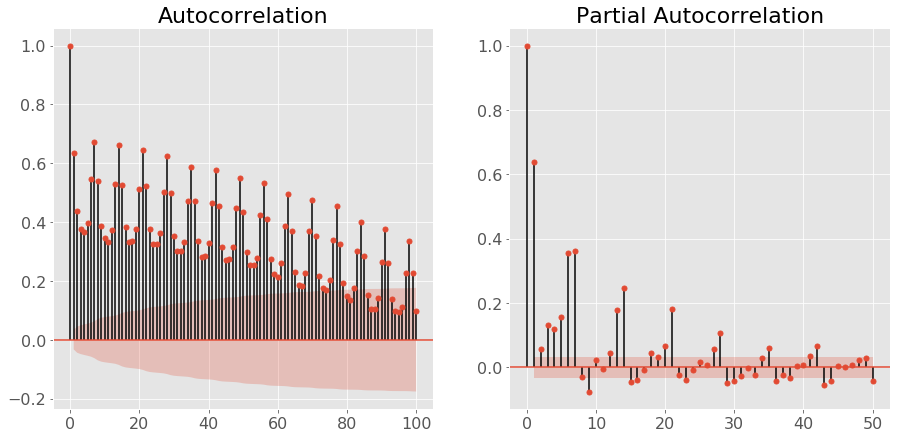

In [303]:
custom_functions.plot_ACF_PACF(arima_df_day["BATTERY"])

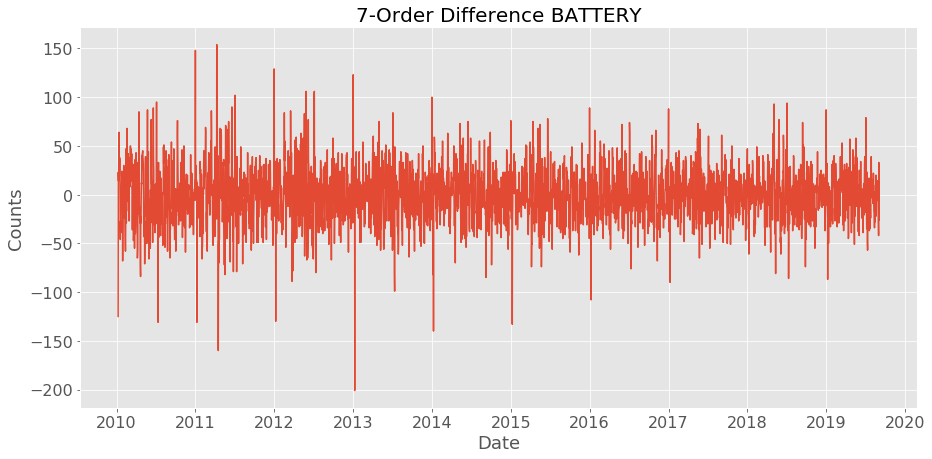

In [304]:
differenced = custom_functions.difference(arima_df_day["BATTERY"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference BATTERY")

In [305]:
series = arima_df_day["BATTERY"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_battery = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 1, 7), 
                                              title = "BATTERY")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


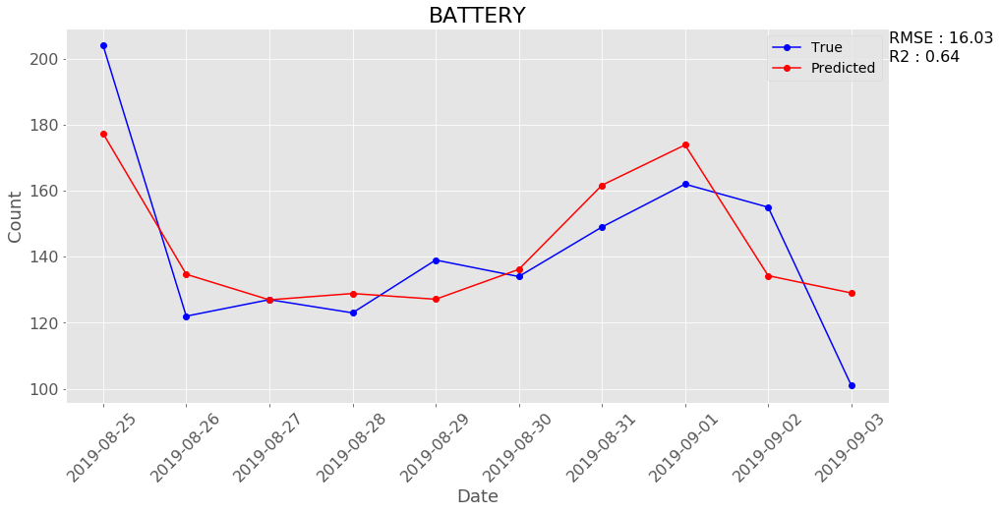

In [306]:
true_values = arima_df_day["BATTERY"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_battery, dates, title = "BATTERY")

Model can explain 64% of the variation in the data with the RMSE value of 16.03.

## MOTOR VEHICLE THEFT

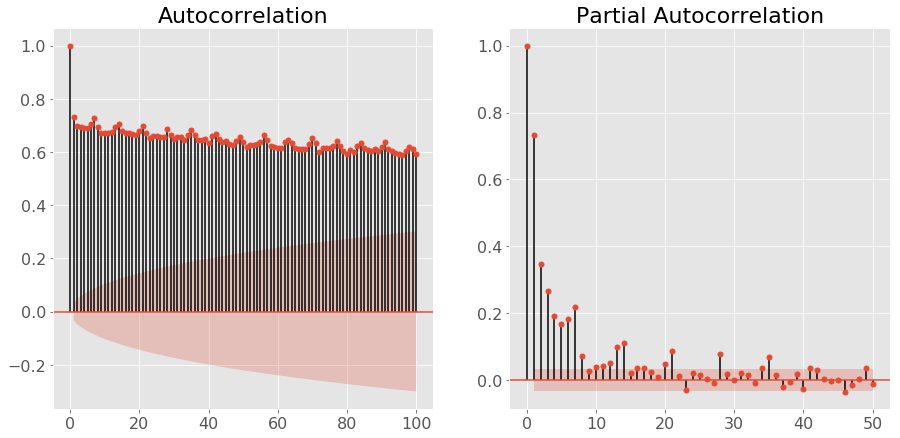

In [307]:
custom_functions.plot_ACF_PACF(arima_df_day["MOTOR VEHICLE THEFT"])

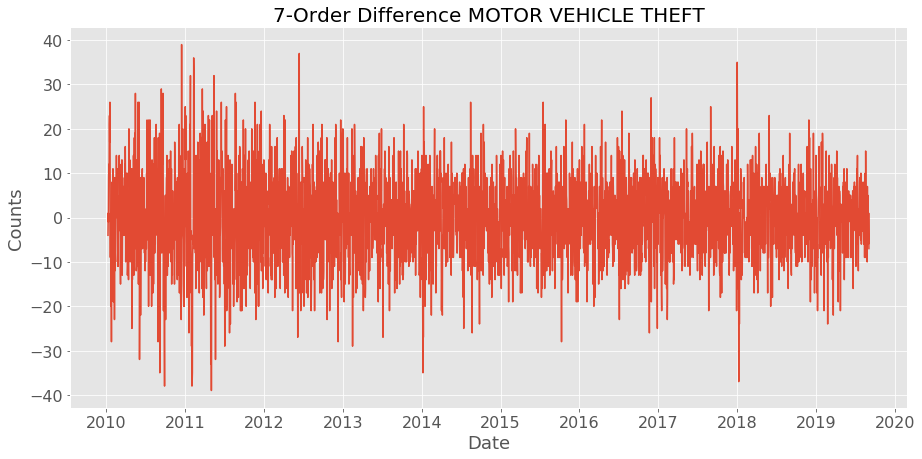

In [308]:
differenced = custom_functions.difference(arima_df_day["MOTOR VEHICLE THEFT"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference MOTOR VEHICLE THEFT")

In [309]:
series = arima_df_day["MOTOR VEHICLE THEFT"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_motor = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 0, 7), 
                                              title = "MOTOR VEHICLE THEFT")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


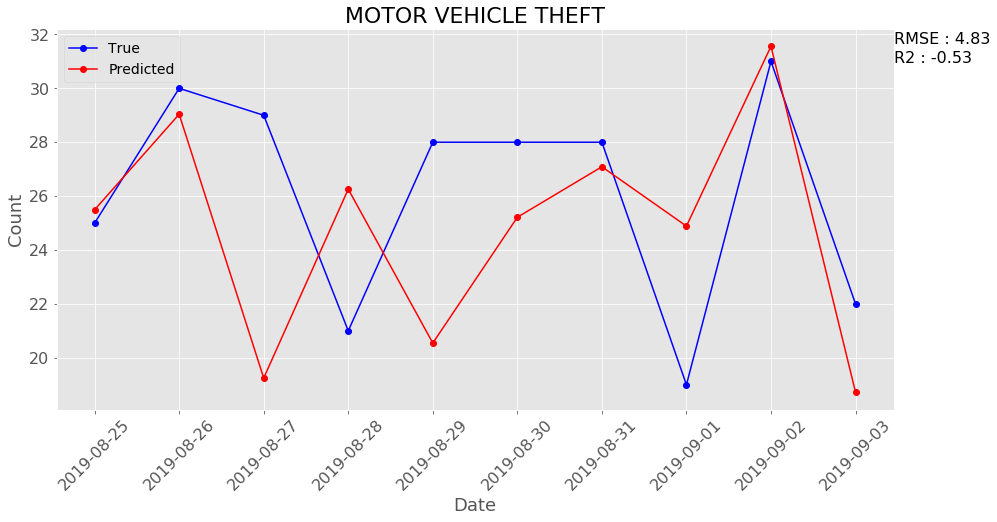

In [310]:
true_values = arima_df_day["MOTOR VEHICLE THEFT"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_motor, dates, title = "MOTOR VEHICLE THEFT")

Model is useless.

## CRIMINAL DAMAGE

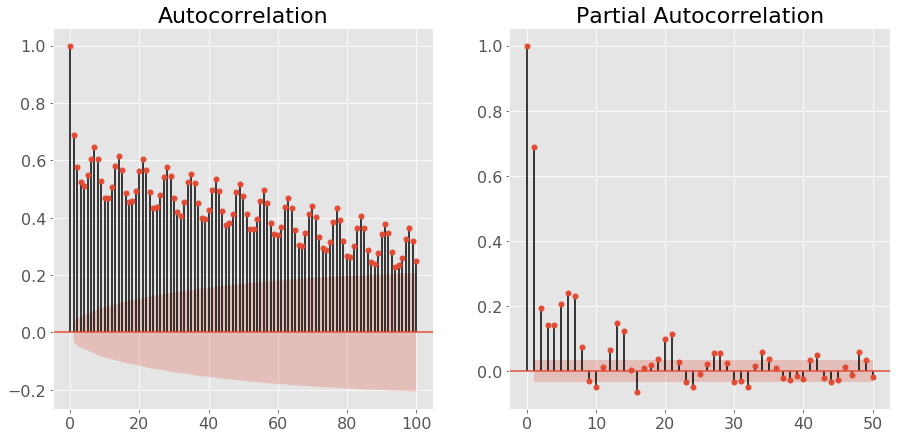

In [311]:
custom_functions.plot_ACF_PACF(arima_df_day["CRIMINAL DAMAGE"])

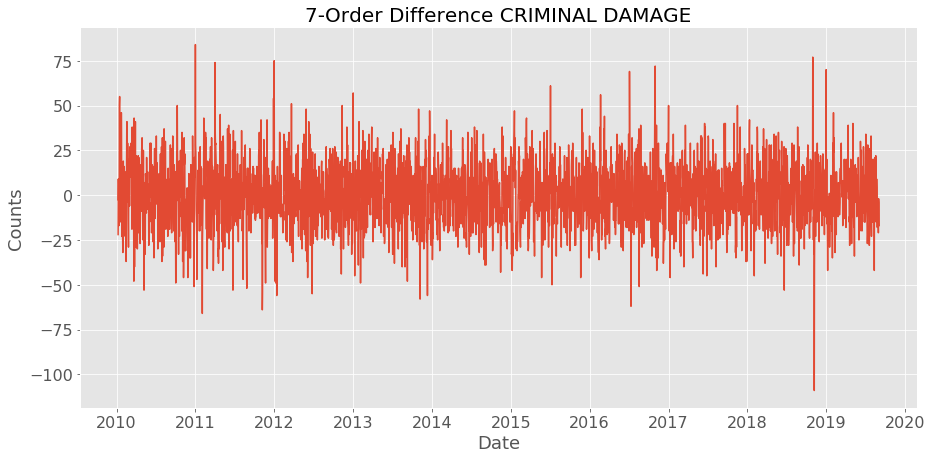

In [312]:
differenced = custom_functions.difference(arima_df_day["CRIMINAL DAMAGE"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference CRIMINAL DAMAGE")

In [313]:
series = arima_df_day["CRIMINAL DAMAGE"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_cd = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 0, 7), 
                                              title = "CRIMINAL DAMAGE", print_summary=True)

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


                                 Statespace Model Results                                 
Dep. Variable:                    CRIMINAL DAMAGE   No. Observations:                 3523
Model:             SARIMAX(15, 1, 0)x(0, 1, 0, 7)   Log Likelihood              -14502.142
Date:                            Tue, 05 Nov 2019   AIC                          29036.284
Time:                                    06:12:08   BIC                          29134.921
Sample:                                01-01-2010   HQIC                         29071.479
                                     - 08-24-2019                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6429      0.016    -39.978      0.000      -0.674      -0.611
ar.L2         -0.4596      0.019   

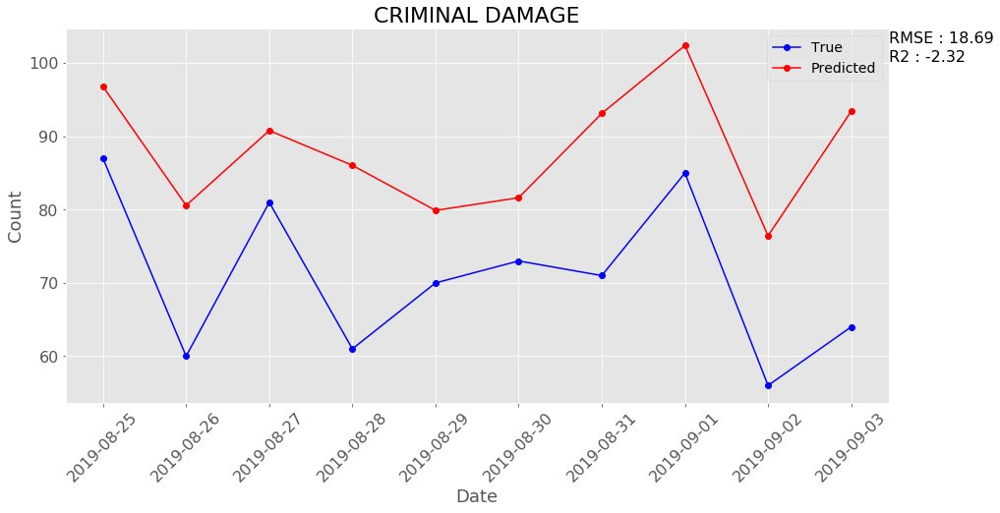

In [314]:
true_values = arima_df_day["CRIMINAL DAMAGE"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_cd, dates, title = "CRIMINAL DAMAGE")

Model is useless.

## ASSAULT

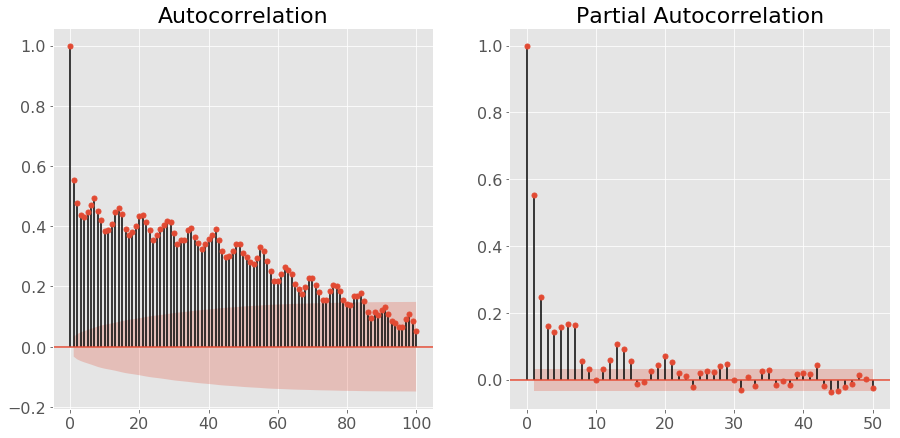

In [315]:
custom_functions.plot_ACF_PACF(arima_df_day["ASSAULT"])

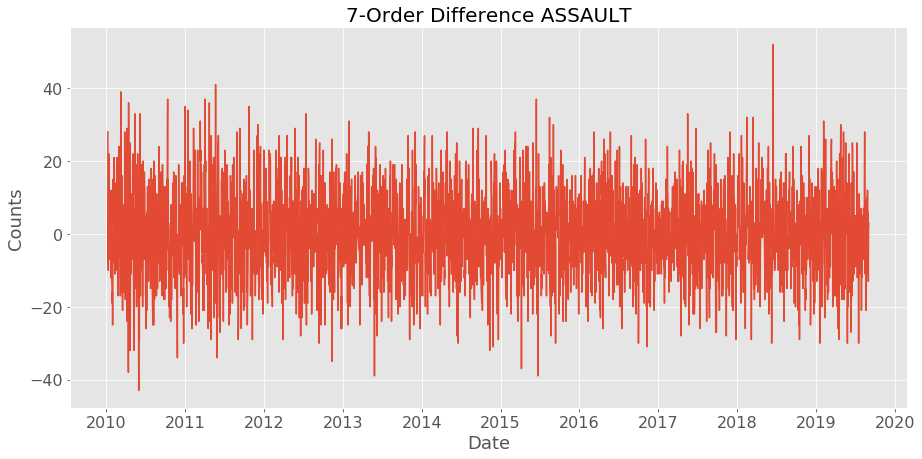

In [316]:
differenced = custom_functions.difference(arima_df_day["ASSAULT"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference ASSAULT")

In [317]:
series = arima_df_day["ASSAULT"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_ass = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 0, 7), 
                                              title = "ASSAULT")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


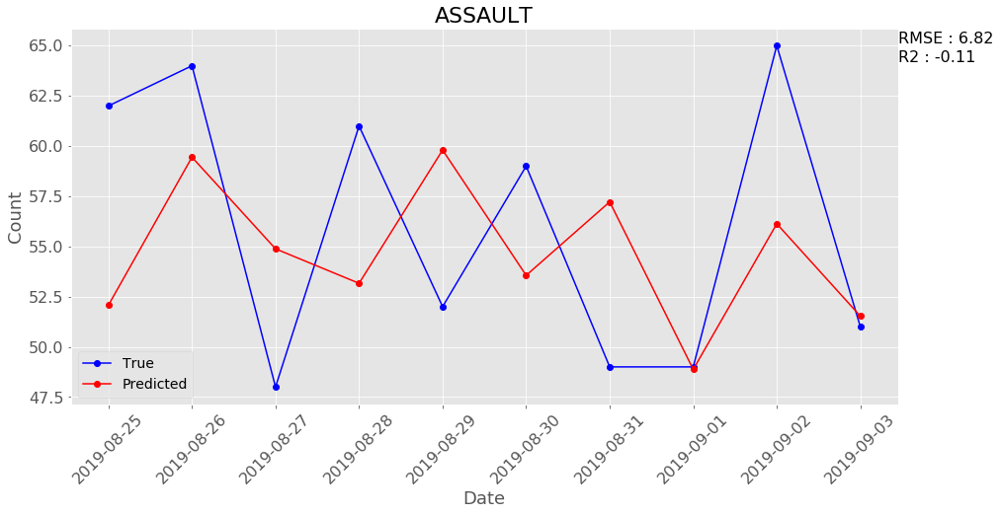

In [318]:
true_values = arima_df_day["ASSAULT"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_ass, dates, title = "ASSAULT")

Model is useless.

## ROBBERY

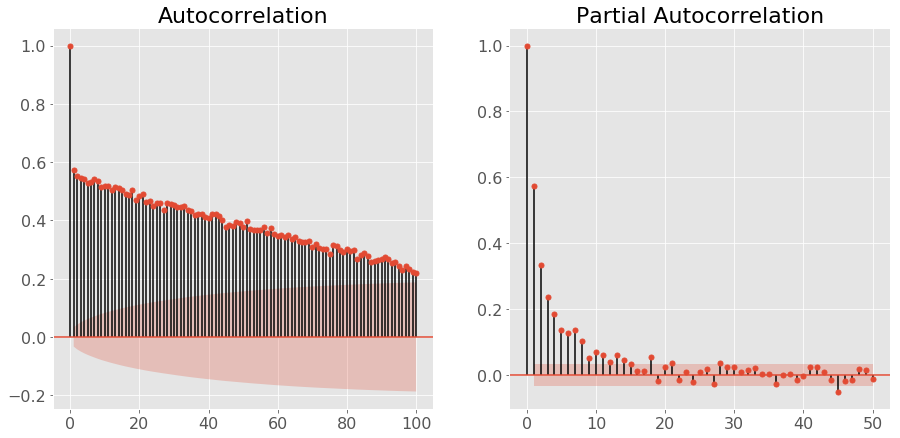

In [319]:
custom_functions.plot_ACF_PACF(arima_df_day["ROBBERY"])

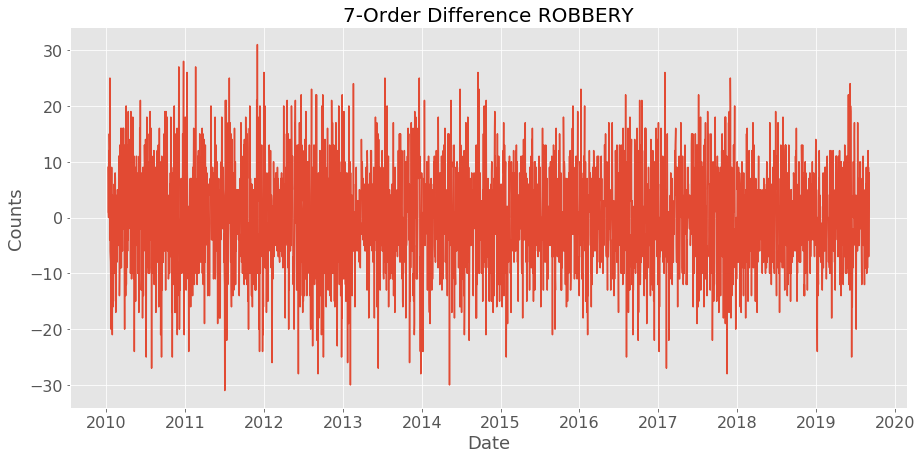

In [320]:
differenced = custom_functions.difference(arima_df_day["ROBBERY"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference ROBBERY")

In [321]:
series = arima_df_day["ROBBERY"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_rob = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 1, 7), 
                                              title = "ROBBERY")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


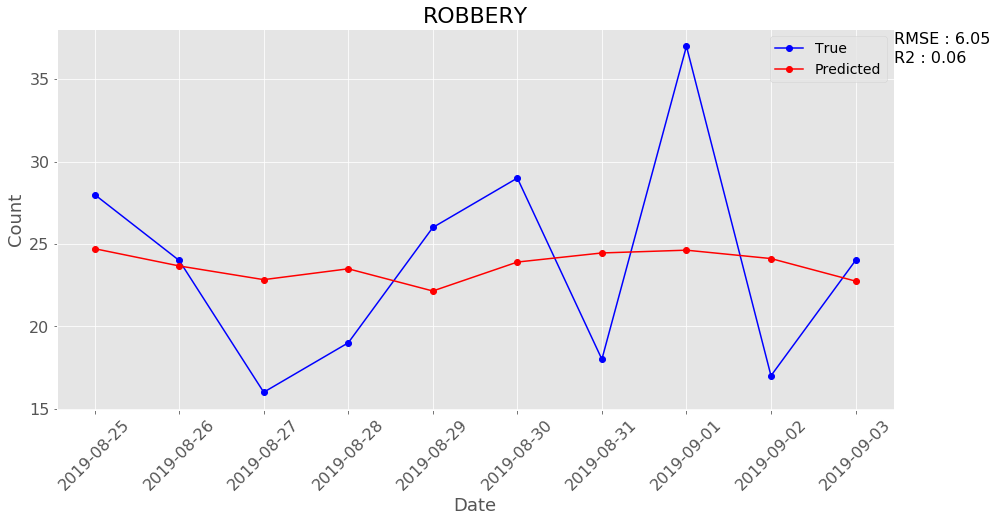

In [322]:
true_values = arima_df_day["ROBBERY"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_rob, dates, title = "ROBBERY")

Model is as good as fitting the mean to the data.

## WEAPONS VIOLATION<a id = 'wp_SARIMA'></a>

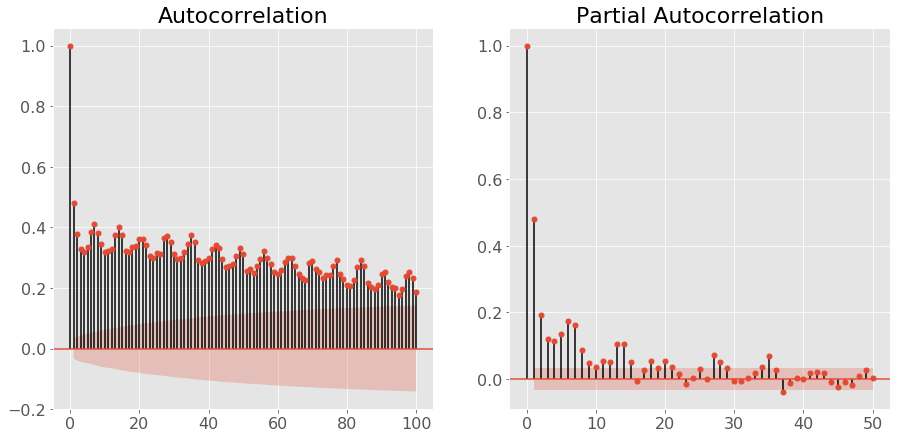

In [323]:
custom_functions.plot_ACF_PACF(arima_df_day["WEAPONS VIOLATION"])

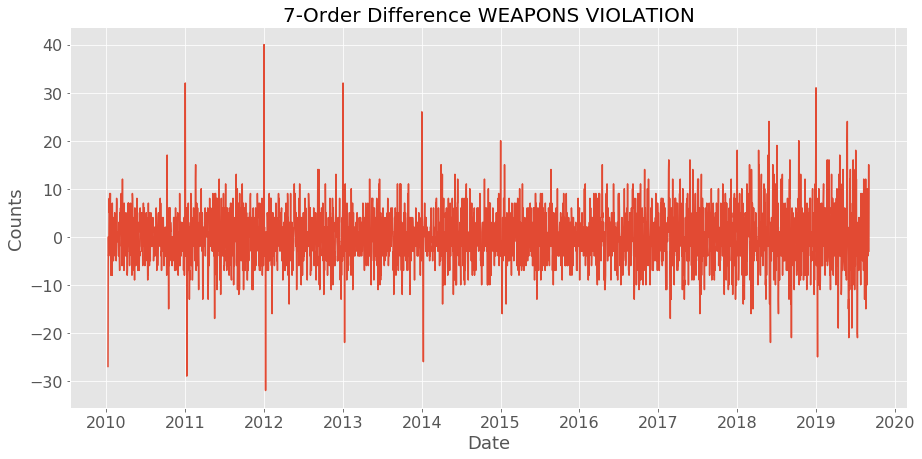

In [324]:
differenced = custom_functions.difference(arima_df_day["WEAPONS VIOLATION"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference WEAPONS VIOLATION")

In [325]:
series = arima_df_day["WEAPONS VIOLATION"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_wp = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 0, 0), sorder = (0, 1, 0, 7), 
                                              title = "WEAPONS VIOLATION")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


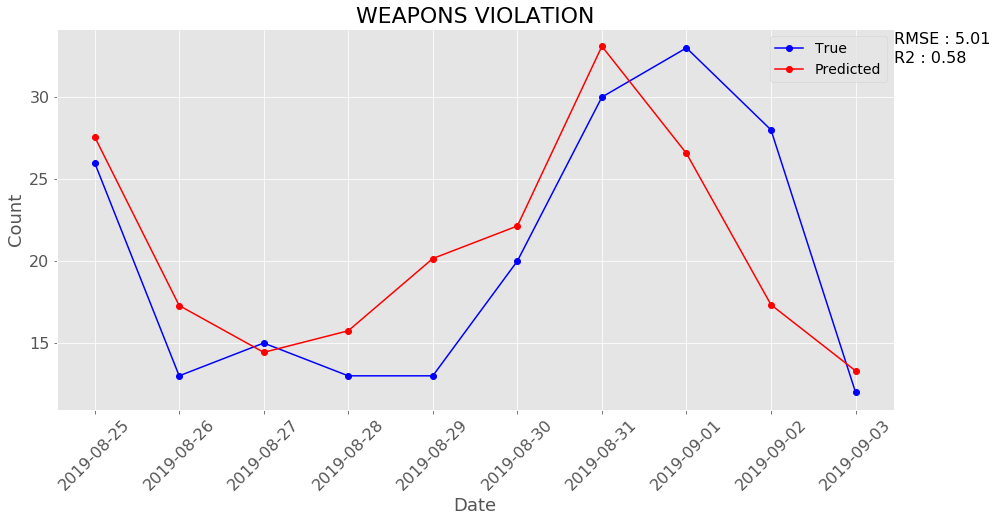

In [326]:
true_values = arima_df_day["WEAPONS VIOLATION"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_wp, dates, title = "WEAPONS VIOLATION")

Model can explain 58% of the variation in the data with the RMSE value of 5.01.

## OTHER OFFENSE

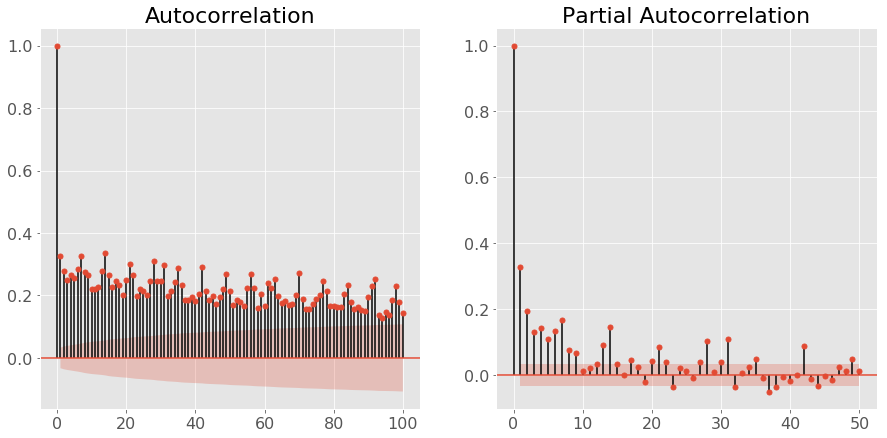

In [327]:
custom_functions.plot_ACF_PACF(arima_df_day["OTHER OFFENSE"])

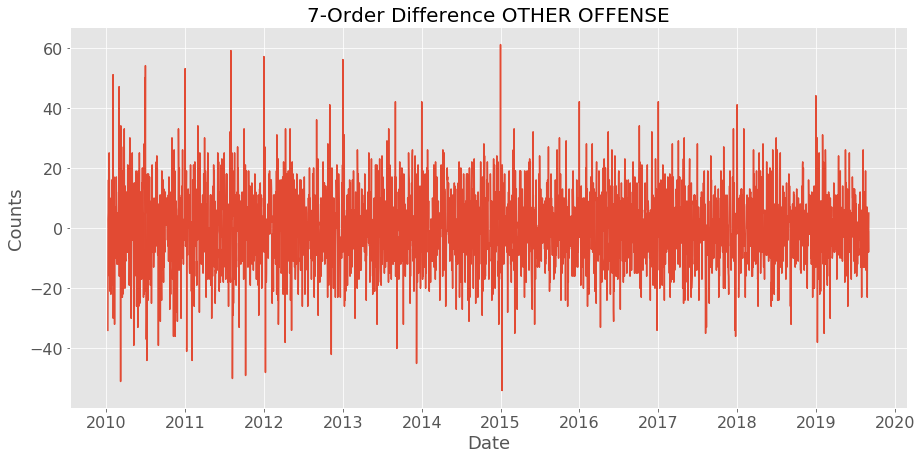

In [328]:
differenced = custom_functions.difference(arima_df_day["OTHER OFFENSE"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference OTHER OFFENSE")

In [329]:
series = arima_df_day["OTHER OFFENSE"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_oo = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 1, 7), 
                                              title = "OTHER OFFENSE")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


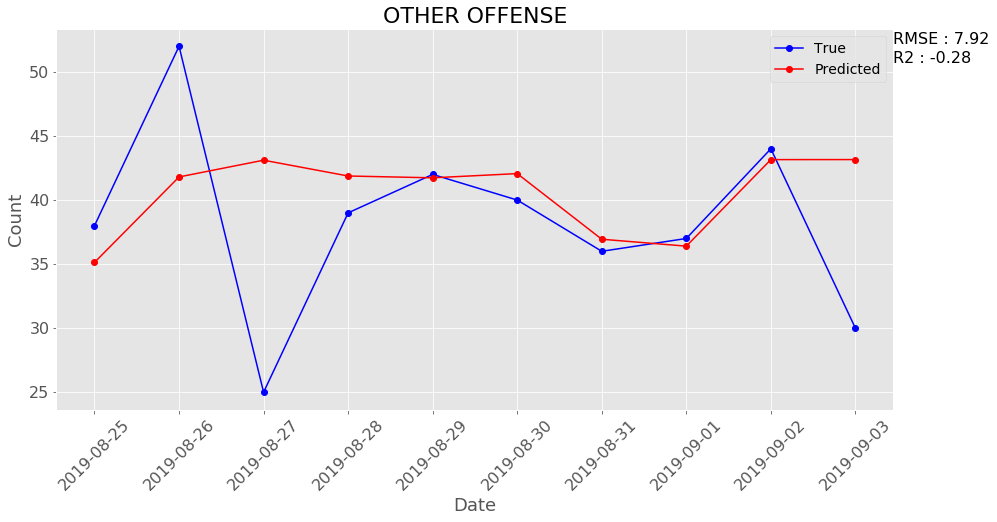

In [330]:
true_values = arima_df_day["OTHER OFFENSE"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_oo, dates, title = "OTHER OFFENSE")

Model is useless.

## BURGLARY

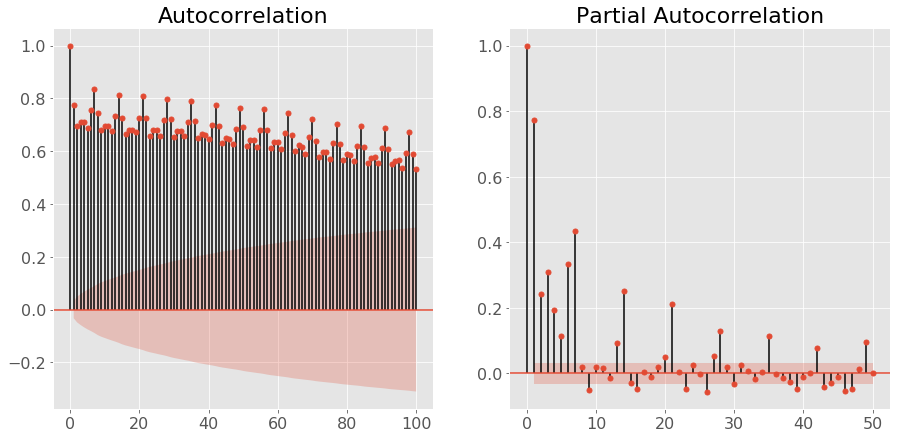

In [331]:
custom_functions.plot_ACF_PACF(arima_df_day["BURGLARY"])

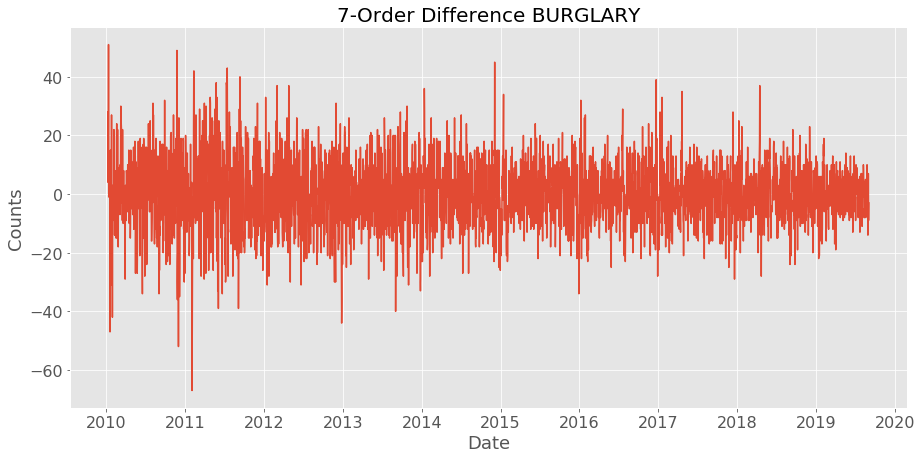

In [332]:
differenced = custom_functions.difference(arima_df_day["BURGLARY"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference BURGLARY")

In [333]:
series = arima_df_day["BURGLARY"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_bur = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 1, 7), 
                                              title = "BURGLARY")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


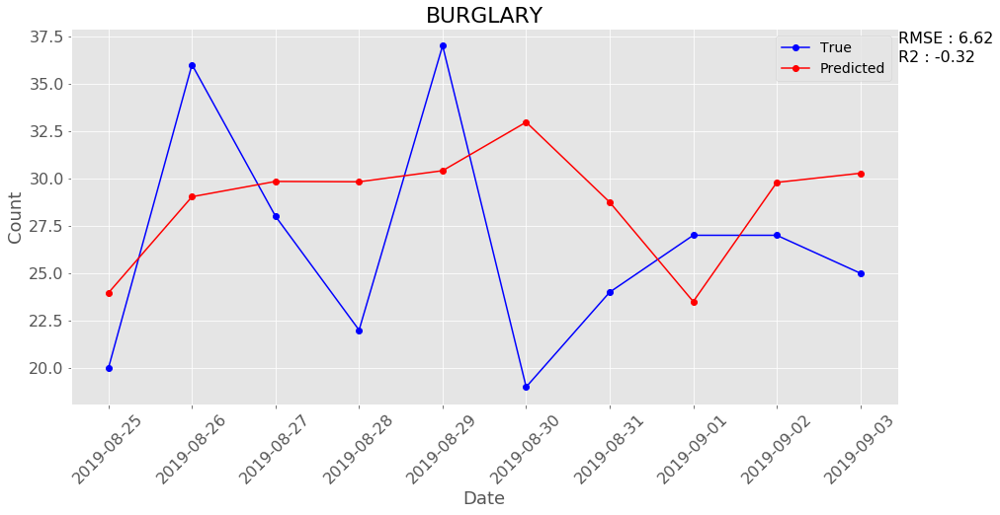

In [334]:
true_values = arima_df_day["BURGLARY"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_bur, dates, title = "BURGLARY")

Model is useless.

## THEFT

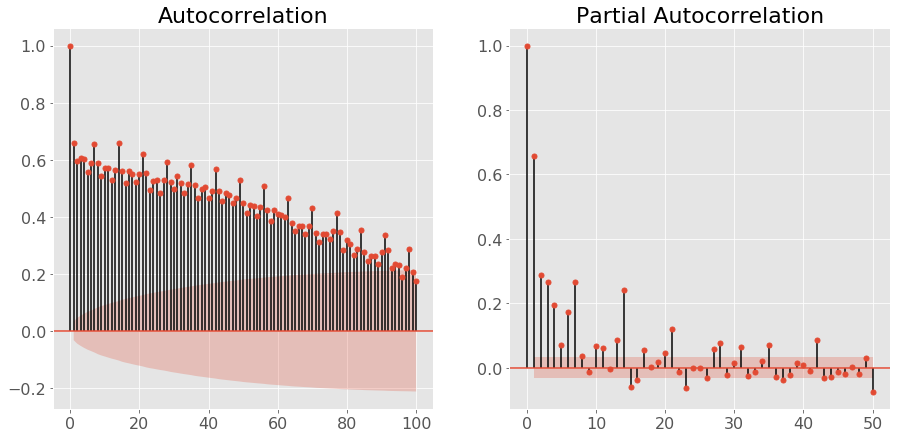

In [335]:
custom_functions.plot_ACF_PACF(arima_df_day["THEFT"])

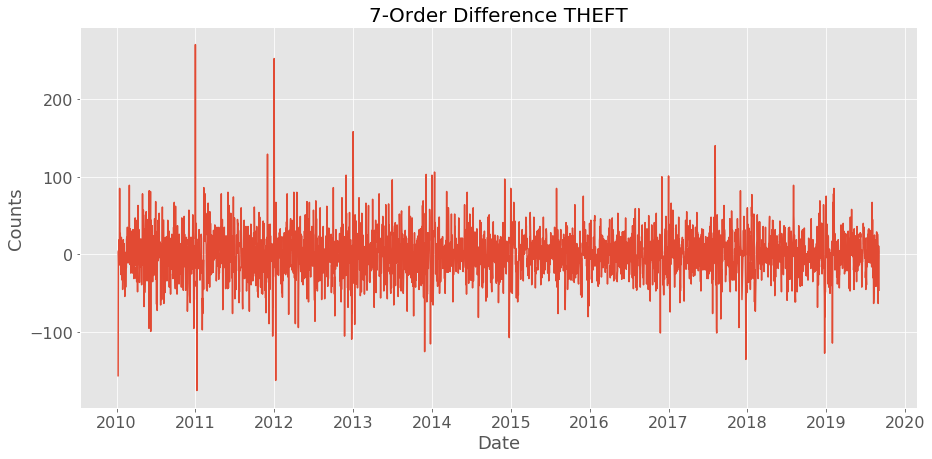

In [336]:
differenced = custom_functions.difference(arima_df_day["THEFT"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference THEFT")

In [337]:
series = arima_df_day["THEFT"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_the = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 0, 7), 
                                              title = "THEFT")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


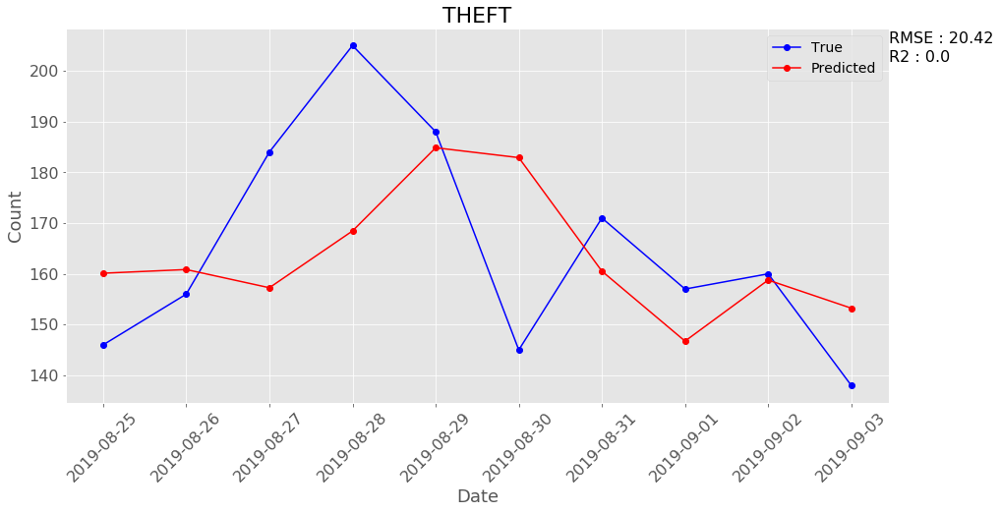

In [338]:
true_values = arima_df_day["THEFT"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_the, dates, title = "THEFT")

Model is exactly equivalent to fitting the mean to the data.

## CRIMINAL TRESPASS

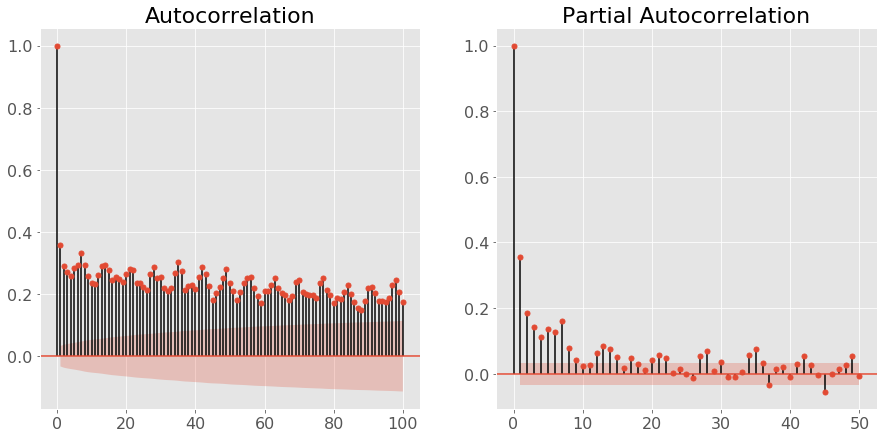

In [339]:
custom_functions.plot_ACF_PACF(arima_df_day["CRIMINAL TRESPASS"])

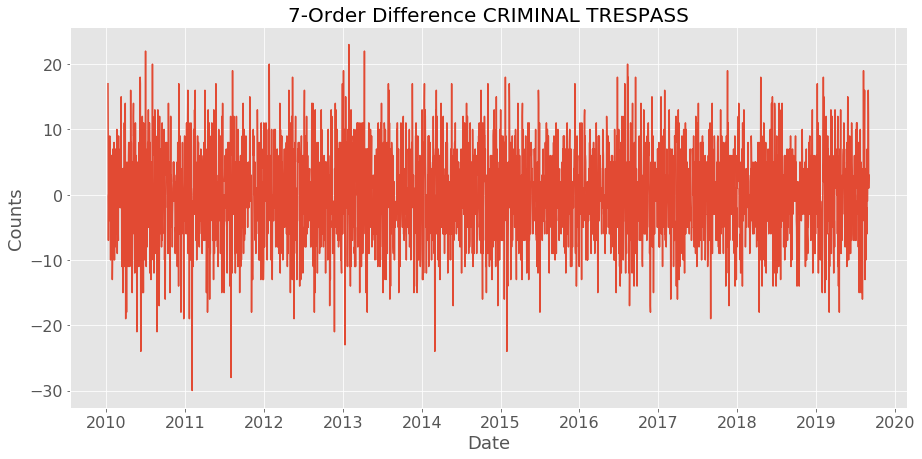

In [340]:
differenced = custom_functions.difference(arima_df_day["CRIMINAL TRESPASS"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference CRIMINAL TRESPASS")

In [341]:
series = arima_df_day["CRIMINAL TRESPASS"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_ct = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 1, 7), 
                                              title = "CRIMINAL TRESPASS")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


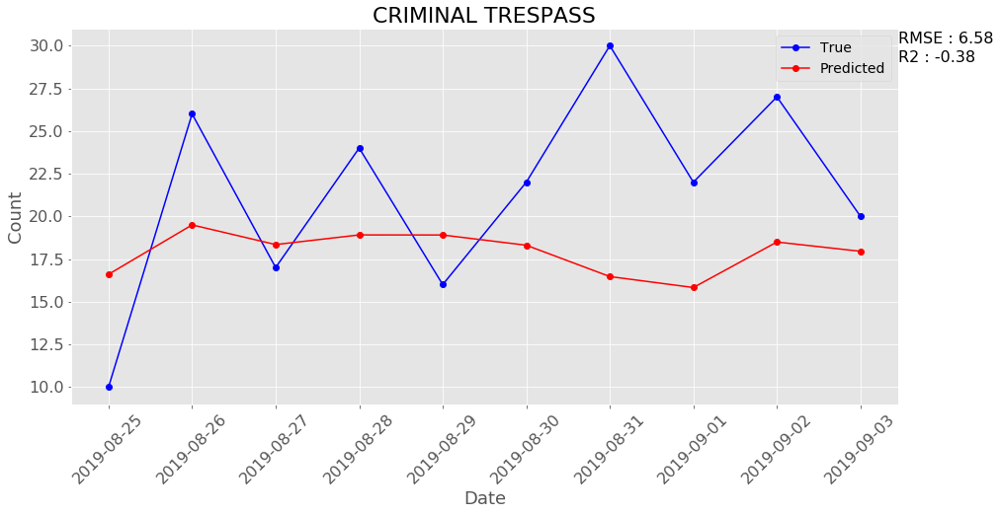

In [342]:
true_values = arima_df_day["CRIMINAL TRESPASS"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_ct, dates, title = "CRIMINAL TRESPASS")

Model is useless.

## DECEPTIVE PRACTICE

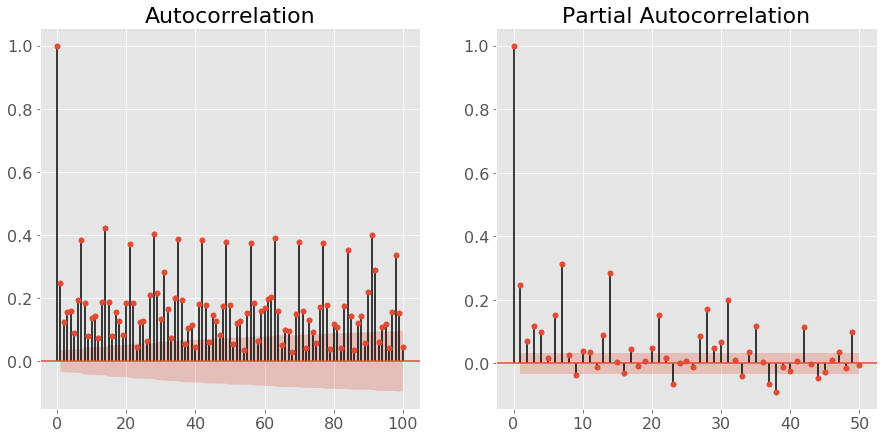

In [343]:
custom_functions.plot_ACF_PACF(arima_df_day["DECEPTIVE PRACTICE"])

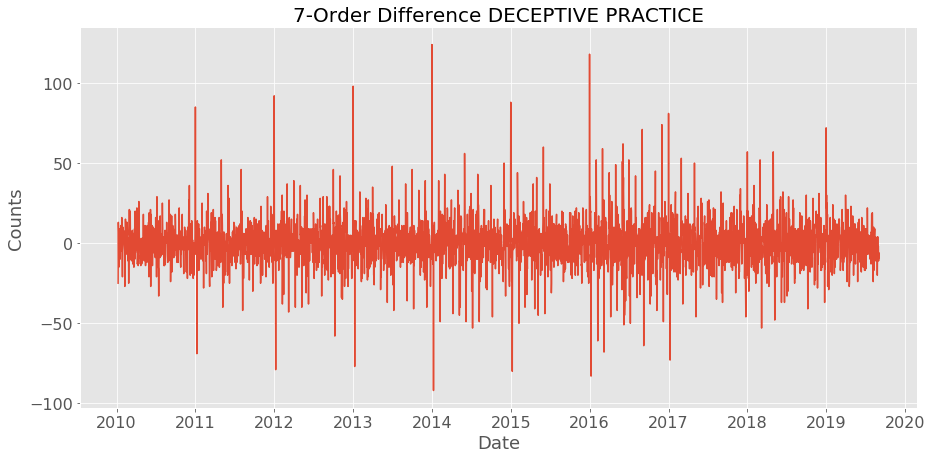

In [344]:
differenced = custom_functions.difference(arima_df_day["DECEPTIVE PRACTICE"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference DECEPTIVE PRACTICE")

In [345]:
series = arima_df_day["DECEPTIVE PRACTICE"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_dp = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 0, 7), 
                                              title = "DECEPTIVE PRACTICE")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


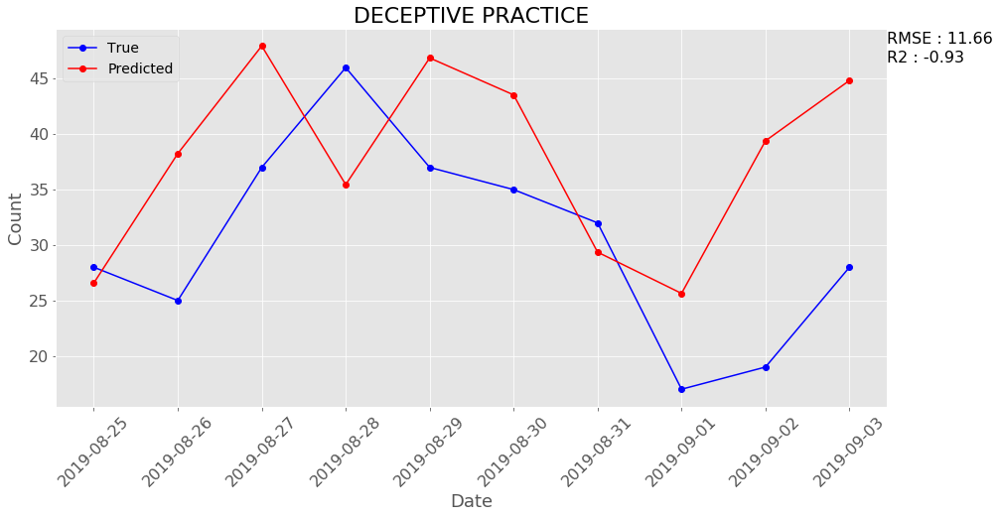

In [346]:
true_values = arima_df_day["DECEPTIVE PRACTICE"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_dp, dates, title = "DECEPTIVE PRACTICE")

Model is useless.

## NARCOTICS<a id = 'nar_SARIMA'></a>

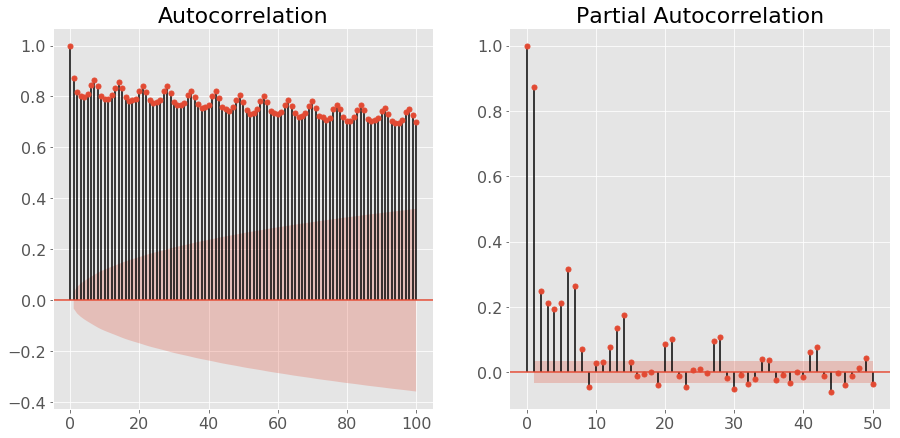

In [347]:
custom_functions.plot_ACF_PACF(arima_df_day["NARCOTICS"])

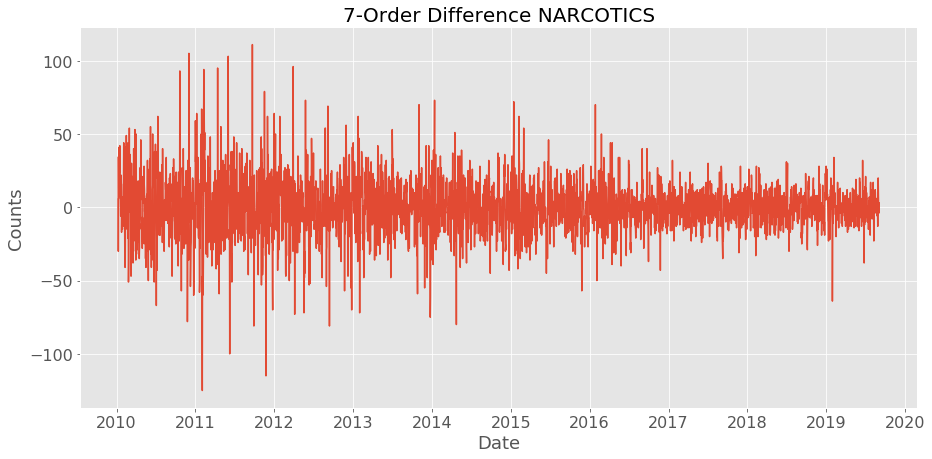

In [348]:
differenced = custom_functions.difference(arima_df_day["NARCOTICS"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference NARCOTICS")

In [349]:
series = arima_df_day["NARCOTICS"][:-10]
series.index = arima_df_day["Date"][:-10]

# Sometimes Seasonal terms dominate non seasonal terms, that's why we have taken order = 6, 1, 0 and seasonal order = 5, 1, 0, 7
forecast_nar = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (6, 1, 0), sorder = (5, 1, 0, 7), 
                                              title = "NARCOTICS")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


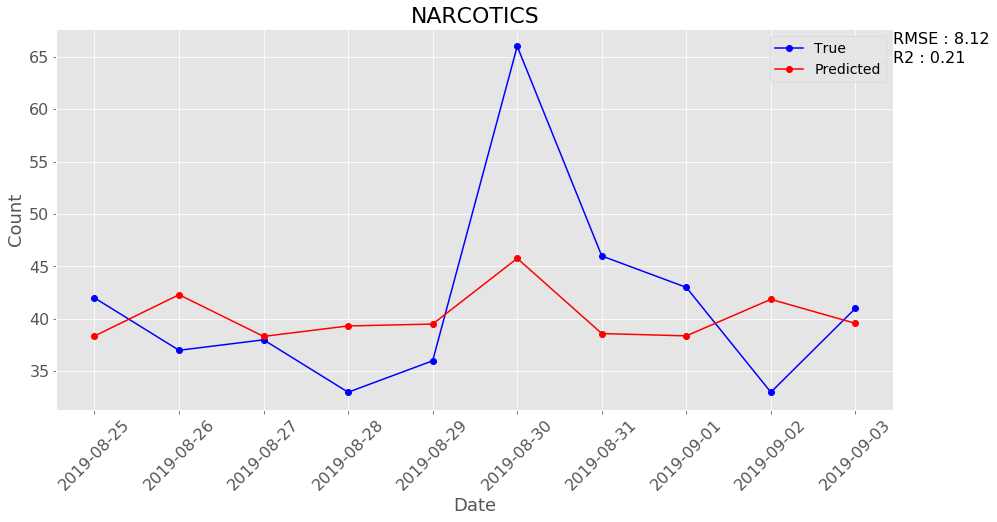

In [350]:
true_values = arima_df_day["NARCOTICS"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_nar, dates, title = "NARCOTICS")

Model can explain 21% of the variation in the data with the RMSE value of 8.12.

## PUBLIC PEACE VIOLATION

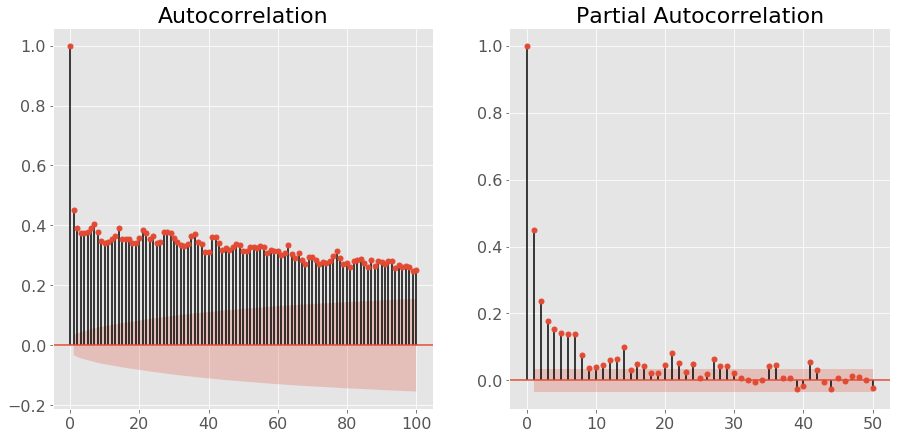

In [351]:
custom_functions.plot_ACF_PACF(arima_df_day["PUBLIC PEACE VIOLATION"])

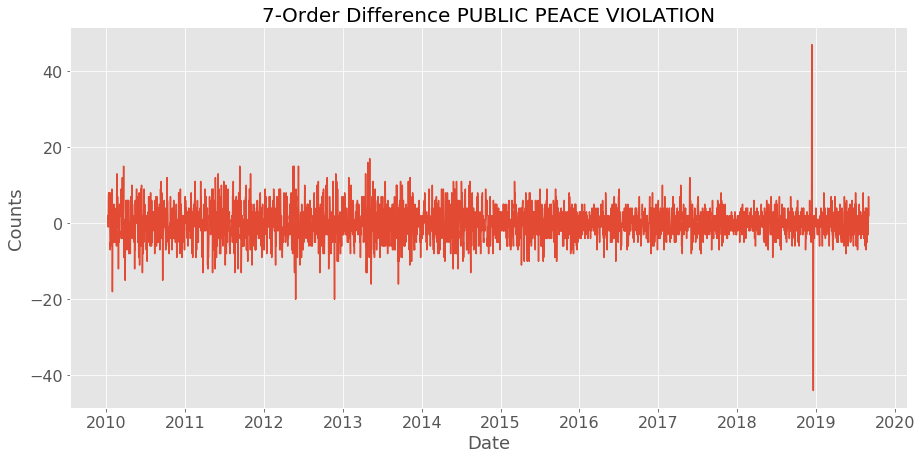

In [352]:
differenced = custom_functions.difference(arima_df_day["PUBLIC PEACE VIOLATION"],7)
custom_functions.sequence_plot(differenced, arima_df_day["Date"][7:], title = "7-Order Difference PUBLIC PEACE VIOLATION")

In [353]:
series = arima_df_day["PUBLIC PEACE VIOLATION"][:-10]
series.index = arima_df_day["Date"][:-10]
forecast_ppv = custom_functions.fit_SARIMA(series, series.index, trend = "n", order = (15, 1, 0), sorder = (0, 1, 1, 7), 
                                              title = "PUBLIC PEACE VIOLATION")

C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:191: FutureWarning: Creating a DatetimeIndex by passing range endpoints is deprecated.  Use `pandas.date_range` instead.
  start=index[0], end=index[-1], freq=freq)
C:\Users\bharath\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1051: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if self.state_error and params_variance == []:


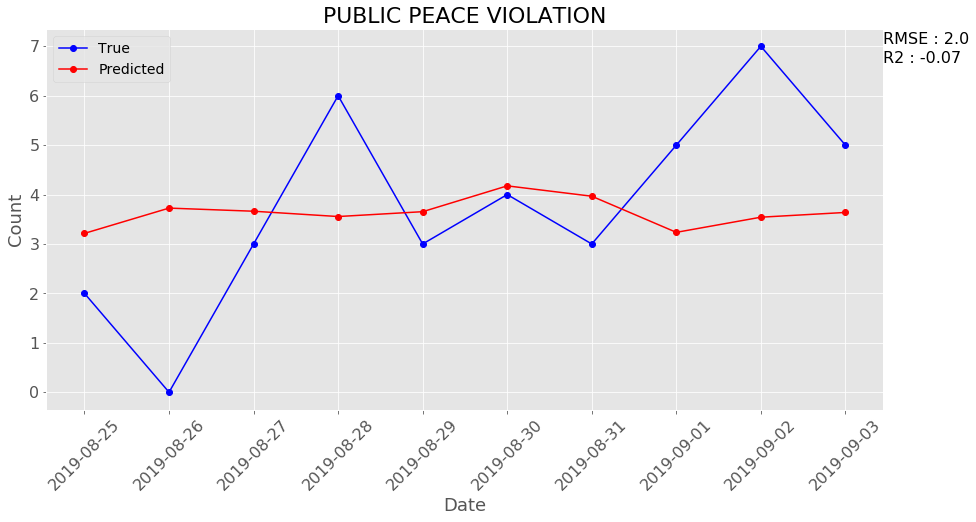

In [354]:
true_values = arima_df_day["PUBLIC PEACE VIOLATION"][-10:]
dates = arima_df_day["Date"][-10:]
custom_functions.plot_true_vs_predicted(true_values, forecast_ppv, dates, title = "PUBLIC PEACE VIOLATION")

Model is useless.

## Conclusion

I was not able to forecast all the variable using ARIMA and SARIMA models. Some of the models perform worse than fitting the mean to the data and some of the models perfomed very well.

Final models are as following:

1. Variable - Crime Type - BATTERY
    
    [MODEL 1](#battery_ARIMA)
       Model - ARIMA(15, 1, 0) - R2 = 63% - RMSE = 16.26
    
    [MODEL 2](#battery_SARIMA)
       Model - ARIMA(15, 1, 0)(0, 1, 1, 7) --> SARIMA - R2 = 64% - RMSE = 16.03

2. Variable - Crime Type - WEAPONS VIOLATION
    
    [MODEL 1](#wp_ARIMA)
       Model - ARIMA(14, 1, 0) - R2 = 34% - RMSE = 6.32
       
    [MODEL 2](#wp_SARIMA)
       Model - ARIMA(15, 0, 0)(0, 1, 0, 7) --> SARIMA - R2 = 58% - RMSE = 5.01

3. Variable - Crime Type - NARCOTICS
    
    [MODEL 1](#nar_SARIMA)
       Model - ARIMA(6, 1, 0)(5, 1, 0, 7) --> SARIMA - R2 = 21% - RMSE = 8.12

4. Variable - Crime Type - Total Crimes
    
    [MODEL 1](#crimes_SARIMA)
       Model - ARIMA(15, 1, 0)(0, 1, 0, 7) --> SARIMA - R2 = 56% - RMSE = 27.64

## Appendix

### Primary Type

In [355]:
## Codes and Labels
'''
 
 0: 'ARSON',
 1: 'ASSAULT',
 2: 'BATTERY',
 3: 'BURGLARY',
 4: 'CONCEALED CARRY LICENSE VIOLATION',
 5: 'CRIM SEXUAL ASSAULT',
 6: 'CRIMINAL DAMAGE',
 7: 'CRIMINAL TRESPASS',
 8: 'DECEPTIVE PRACTICE',
 9: 'GAMBLING',
 10: 'HOMICIDE',
 11: 'HUMAN TRAFFICKING',
 12: 'INTERFERENCE WITH PUBLIC OFFICER',
 13: 'INTIMIDATION',
 14: 'KIDNAPPING',
 15: 'LIQUOR LAW VIOLATION',
 16: 'MOTOR VEHICLE THEFT',
 17: 'NARCOTICS',
 18: 'NON - CRIMINAL',
 19: 'NON-CRIMINAL',
 20: 'NON-CRIMINAL (SUBJECT SPECIFIED)',
 21: 'OBSCENITY',
 22: 'OFFENSE INVOLVING CHILDREN',
 23: 'OTHER NARCOTIC VIOLATION',
 24: 'OTHER OFFENSE',
 25: 'PROSTITUTION',
 26: 'PUBLIC INDECENCY',
 27: 'PUBLIC PEACE VIOLATION',
 28: 'ROBBERY',
 29: 'SEX OFFENSE',
 30: 'STALKING',
 31: 'THEFT',
 32: 'WEAPONS VIOLATION'

''';

### Description

In [356]:
## Codes and Labels
'''
 
 0: '$500 AND UNDER',
 1: 'ABUSE/NEGLECT: CARE FACILITY',
 2: 'AGG CRIM SEX ABUSE FAM MEMBER',
 3: 'AGG CRIMINAL SEXUAL ABUSE',
 4: 'AGG PO HANDS ETC SERIOUS INJ',
 5: 'AGG PO HANDS NO/MIN INJURY',
 6: 'AGG PRO EMP HANDS SERIOUS INJ',
 7: 'AGG PRO.EMP: HANDGUN',
 8: 'AGG PRO.EMP: OTHER DANG WEAPON',
 9: 'AGG PRO.EMP: OTHER FIREARM',
 10: 'AGG PRO.EMP:KNIFE/CUTTING INST',
 11: 'AGG SEX ASSLT OF CHILD FAM MBR',
 12: 'AGG: FINANCIAL ID THEFT',
 13: 'AGG: HANDS/FIST/FEET NO/MINOR INJURY',
 14: 'AGG: HANDS/FIST/FEET SERIOUS INJURY',
 15: 'AGGRAVATED',
 16: 'AGGRAVATED COMPUTER TAMPERING',
 17: 'AGGRAVATED DOMESTIC BATTERY: HANDGUN',
 18: 'AGGRAVATED DOMESTIC BATTERY: HANDS/FIST/FEET SERIOUS INJURY',
 19: 'AGGRAVATED DOMESTIC BATTERY: KNIFE/CUTTING INST',
 20: 'AGGRAVATED DOMESTIC BATTERY: OTHER DANG WEAPON',
 21: 'AGGRAVATED DOMESTIC BATTERY: OTHER FIREARM',
 22: 'AGGRAVATED FINANCIAL IDENTITY THEFT',
 23: 'AGGRAVATED OF A CHILD',
 24: 'AGGRAVATED OF A SENIOR CITIZEN',
 25: 'AGGRAVATED OF A UNBORN CHILD',
 26: 'AGGRAVATED PO: HANDGUN',
 27: 'AGGRAVATED PO: KNIFE/CUT INSTR',
 28: 'AGGRAVATED PO: OTHER DANG WEAP',
 29: 'AGGRAVATED PO: OTHER FIREARM',
 30: 'AGGRAVATED PO:KNIFE/CUT INSTR',
 31: 'AGGRAVATED VEHICULAR HIJACKING',
 32: 'AGGRAVATED: HANDGUN',
 33: 'AGGRAVATED: KNIFE/CUT INSTR',
 34: 'AGGRAVATED: OTHER',
 35: 'AGGRAVATED: OTHER DANG WEAPON',
 36: 'AGGRAVATED: OTHER FIREARM',
 37: 'AGGRAVATED:KNIFE/CUTTING INSTR',
 38: 'AIDING ARRESTEE ESCAPE',
 39: 'ALTER COINS',
 40: 'ALTER/FORGE PRESCRIPTION',
 41: 'ANIMAL ABUSE/NEGLECT',
 42: 'ANIMAL FIGHTING',
 43: 'ARMED VIOLENCE',
 44: 'ARMED WHILE UNDER THE INFLUENCE',
 45: 'ARMED: HANDGUN',
 46: 'ARMED: OTHER DANGEROUS WEAPON',
 47: 'ARMED: OTHER FIREARM',
 48: 'ARMED:KNIFE/CUTTING INSTRUMENT',
 49: 'ARSON THREAT',
 50: 'ARSONIST: ANNUAL REGISTRATION',
 51: 'ARSONIST: DUTY TO REGISTER',
 52: 'ARSONIST: FAIL TO REGISTER NEW ADDRESS',
 53: 'ATT AGG CRIMINAL SEXUAL ABUSE',
 54: 'ATT CRIM SEXUAL ABUSE',
 55: 'ATT: AUTOMOBILE',
 56: 'ATT: TRUCK, BUS, MOTOR HOME',
 57: 'ATTEMPT - FINANCIAL IDENTITY THEFT',
 58: 'ATTEMPT AGG: HANDGUN',
 59: 'ATTEMPT AGG: KNIFE/CUT INSTR',
 60: 'ATTEMPT AGG: OTHER',
 61: 'ATTEMPT AGG: OTHER DANG WEAPON',
 62: 'ATTEMPT AGG: OTHER FIREARM',
 63: 'ATTEMPT ARSON',
 64: 'ATTEMPT FINANCIAL IDENTITY THEFT',
 65: 'ATTEMPT FORCIBLE ENTRY',
 66: 'ATTEMPT NON-AGGRAVATED',
 67: 'ATTEMPT POSSESSION CANNABIS',
 68: 'ATTEMPT POSSESSION NARCOTICS',
 69: 'ATTEMPT THEFT',
 70: 'ATTEMPT: AGGRAVATED',
 71: 'ATTEMPT: ARMED-HANDGUN',
 72: 'ATTEMPT: ARMED-KNIFE/CUT INSTR',
 73: 'ATTEMPT: ARMED-OTHER DANG WEAP',
 74: 'ATTEMPT: ARMED-OTHER FIREARM',
 75: 'ATTEMPT: CYCLE, SCOOTER, BIKE NO VIN',
 76: 'ATTEMPT: CYCLE, SCOOTER, BIKE W-VIN',
 77: 'ATTEMPT: STRONGARM-NO WEAPON',
 78: 'AUTOMOBILE',
 79: 'BIGAMY',
 80: 'BOARD PLANE WITH WEAPON',
 81: 'BOGUS CHECK',
 82: 'BOMB THREAT',
 83: 'BOOKMAKING/SPORTS',
 84: 'BRIBERY',
 85: 'BY EXPLOSIVE',
 86: 'BY FIRE',
 87: 'CAB OPERATION',
 88: 'CALCULATED CANNABIS CONSPIRACY',
 89: 'CALL OPERATION',
 90: 'CANNABIS PLANT',
 91: 'CHILD ABANDONMENT',
 92: 'CHILD ABDUCTION',
 93: 'CHILD ABDUCTION/STRANGER',
 94: 'CHILD ABUSE',
 95: 'CHILD PORNOGRAPHY',
 96: 'COMMERCIAL SEX ACTS',
 97: 'COMPELLING CONFESSION',
 98: 'COMPELLING ORG MEMBERSHIP',
 99: 'COMPOUNDING A CRIME',
 100: 'COMPUTER FRAUD',
 101: 'CONCEALED CARRY LICENSE REVOCATION',
 102: 'CONCEALING/AIDING A FUGITIVE',
 103: 'CONT SUBS:FAIL TO MAINT RECORD',
 104: 'CONTRABAND IN PRISON',
 105: 'CONTRIBUTE CRIM DELINQUENCY JUVENILE',
 106: 'CONTRIBUTE DELINQUENCY OF A CHILD',
 107: 'COUNTERFEIT CHECK',
 108: 'COUNTERFEITING DOCUMENT',
 109: 'CREDIT CARD FRAUD',
 110: 'CRIM SEX ABUSE BY FAM MEMBER',
 111: 'CRIMINAL DEFACEMENT',
 112: 'CRIMINAL DRUG CONSPIRACY',
 113: 'CRIMINAL SEXUAL ABUSE',
 114: 'CRIMINAL TRANSMISSION OF HIV',
 115: 'CYBERSTALKING',
 116: 'CYCLE, SCOOTER, BIKE NO VIN',
 117: 'CYCLE, SCOOTER, BIKE W-VIN',
 118: 'DECEPTIVE COLLECTION PRACTICES',
 119: 'DEFACE IDENT MARKS OF FIREARM',
 120: 'DEL CONT SUBS TO PERSON <18',
 121: 'DELIVER CANNABIS TO PERSON <18',
 122: 'DELIVERY CONTAINER THEFT',
 123: 'DISCLOSE DV VICTIM LOCATION',
 124: 'DOMESTIC BATTERY SIMPLE',
 125: 'EAVESDROPPING',
 126: 'EDUCATIONAL INTIMIDAITON',
 127: 'EMBEZZLEMENT',
 128: 'EMPLOY MINOR',
 129: 'ENDANGERING LIFE/HEALTH CHILD',
 130: 'ESCAPE',
 131: 'EXTORTION',
 132: 'FAIL REGISTER LIC:CONT SUBS',
 133: 'FALSE FIRE ALARM',
 134: 'FALSE POLICE REPORT',
 135: 'FALSE/STOLEN/ALTERED TRP',
 136: 'FINAN EXPLOIT-ELDERLY/DISABLED',
 137: 'FINANCIAL ID THEFT: OVER $300',
 138: 'FINANCIAL ID THEFT:$300 &UNDER',
 139: 'FINANCIAL IDENTITY THEFT $300 AND UNDER',
 140: 'FINANCIAL IDENTITY THEFT OVER $ 300',
 141: 'FIREARM REGISTRATION VIOLATION',
 142: 'FIRST DEGREE MURDER',
 143: 'FOID - REVOCATION',
 144: 'FORCIBLE DETENTION',
 145: 'FORCIBLE ENTRY',
 146: 'FORFEIT PROPERTY',
 147: 'FORGERY',
 148: 'FORNICATION',
 149: 'FOUND PASSPORT',
 150: 'FOUND SUSPECT NARCOTICS',
 151: 'FRAUD OR CONFIDENCE GAME',
 152: 'FROM BUILDING',
 153: 'FROM COIN-OP MACHINE/DEVICE',
 154: 'GAME/AMUSEMENT DEVICE',
 155: 'GAME/CARDS',
 156: 'GAME/DICE',
 157: 'GUN OFFENDER NOTIFICATION-NO CONTACT',
 158: 'GUN OFFENDER: ANNUAL REGISTRATION',
 159: 'GUN OFFENDER: DUTY TO REGISTER',
 160: 'GUN OFFENDER: DUTY TO REPORT CHANGE OF INFORMATION',
 161: 'HARASSMENT BY ELECTRONIC MEANS',
 162: 'HARASSMENT BY TELEPHONE',
 163: 'HARBOR RUNAWAY',
 164: 'HAZARDOUS MATERIALS VIOLATION',
 165: 'HOME INVASION',
 166: 'ILLEGAL CONSUMPTION BY MINOR',
 167: 'ILLEGAL POSSESSION BY MINOR',
 168: 'ILLEGAL POSSESSION CASH CARD',
 169: 'ILLEGAL USE CASH CARD',
 170: 'IMPERSONATION',
 171: 'IN TAVERN',
 172: 'INDECENT SOLICITATION/ADULT',
 173: 'INDECENT SOLICITATION/CHILD',
 174: 'INSTITUTIONAL VANDALISM',
 175: 'INSURANCE FRAUD',
 176: 'INTERFERE W/ EMERGENCY EQUIP',
 177: 'INTERFERE W/ HIGHER EDUCATION',
 178: 'INTERFERENCE JUDICIAL PROCESS',
 179: 'INTIMIDATION',
 180: 'INTIMIDATION OF LAW ENFORCEMENT OFFICIAL',
 181: 'INTOXICATING COMPOUNDS',
 182: 'INVOLUNTARY MANSLAUGHTER',
 183: 'INVOLUNTARY SERVITUDE',
 184: 'JUVENILE PIMPING',
 185: 'KEEP PLACE OF PROSTITUTION',
 186: 'KIDNAPPING',
 187: 'LIBRARY THEFT',
 188: 'LIBRARY VANDALISM',
 189: 'LICENSE VIOLATION',
 190: 'LICENSED PREMISE',
 191: 'LIQUOR LICENSE VIOLATION',
 192: 'LOOTING',
 193: 'LOST PASSPORT',
 194: 'LOTTERY/OTHER',
 195: 'MANU/DEL:CANNABIS 10GM OR LESS',
 196: 'MANU/DEL:CANNABIS OVER 10 GMS',
 197: 'MANU/DELIVER: HALLUCINOGEN',
 198: 'MANU/DELIVER: HEROIN (WHITE)',
 199: 'MANU/DELIVER: HEROIN(BRN/TAN)',
 200: 'MANU/DELIVER: METHAMPHETAMINES',
 201: 'MANU/DELIVER:AMPHETAMINES',
 202: 'MANU/DELIVER:BARBITUATES',
 203: 'MANU/DELIVER:COCAINE',
 204: 'MANU/DELIVER:CRACK',
 205: 'MANU/DELIVER:HEROIN(BLACK TAR)',
 206: 'MANU/DELIVER:LOOK-ALIKE DRUG',
 207: 'MANU/DELIVER:PCP',
 208: 'MANU/DELIVER:SYNTHETIC DRUGS',
 209: 'MANU/POSS. W/INTENT TO DELIVER: SYNTHETIC MARIJUANA',
 210: 'MINOR MISREPRESENT AGE',
 211: 'MOB ACTION',
 212: 'MONEY LAUNDERING',
 213: 'NON-AGGRAVATED',
 214: 'NON-CONSENSUAL DISSEMINATION PRIVATE SEXUAL IMAGES',
 215: 'NOTIFICATION OF CIVIL NO CONTACT ORDER',
 216: 'NOTIFICATION OF STALKING - NO CONTACT ORDER',
 217: 'OBSCENE MATTER',
 218: 'OBSCENE TELEPHONE CALLS',
 219: 'OBSCENITY',
 220: 'OBSTRUCTING IDENTIFICATION',
 221: 'OBSTRUCTING JUSTICE',
 222: 'OBSTRUCTING SERVICE',
 223: 'OF UNBORN CHILD',
 224: 'OFFICIAL MISCONDUCT',
 225: 'OTHER',
 226: 'OTHER ARSON/EXPLOSIVE INCIDENT',
 227: 'OTHER CRIME AGAINST PERSON',
 228: 'OTHER CRIME INVOLVING PROPERTY',
 229: 'OTHER OFFENSE',
 230: 'OTHER PROSTITUTION OFFENSE',
 231: 'OTHER VEHICLE OFFENSE',
 232: 'OTHER VIOLATION',
 233: 'OTHER WEAPONS VIOLATION',
 234: 'OVER $500',
 235: 'PANDERING',
 236: 'PAROLE VIOLATION',
 237: 'PATRONIZE JUVENILE PROSTITUTE',
 238: 'PATRONIZING A PROSTITUTE',
 239: 'PAY TV SERVICE OFFENSES',
 240: 'PEEPING TOM',
 241: 'PIMPING',
 242: 'POCKET-PICKING',
 243: 'POS: CHEMICAL/DRY-ICE DEVICE',
 244: 'POS: EXPLOSIVE/INCENDIARY DEV',
 245: 'POS: HYPODERMIC NEEDLE',
 246: 'POS: PORNOGRAPHIC PRINT',
 247: 'POSS FIREARM/AMMO:NO FOID CARD',
 248: 'POSS. KEYS OR DEV.TO COIN MACH',
 249: 'POSS: AMPHETAMINES',
 250: 'POSS: BARBITUATES',
 251: 'POSS: CANNABIS 30GMS OR LESS',
 252: 'POSS: CANNABIS MORE THAN 30GMS',
 253: 'POSS: COCAINE',
 254: 'POSS: CRACK',
 255: 'POSS: HALLUCINOGENS',
 256: 'POSS: HEROIN(BLACK TAR)',
 257: 'POSS: HEROIN(BRN/TAN)',
 258: 'POSS: HEROIN(WHITE)',
 259: 'POSS: LOOK-ALIKE DRUGS',
 260: 'POSS: METHAMPHETAMINES',
 261: 'POSS: PCP',
 262: 'POSS: SYNTHETIC DRUGS',
 263: 'POSSESSION OF BURGLARY TOOLS',
 264: 'POSSESSION OF DRUG EQUIPMENT',
 265: 'POSSESSION: SYNTHETIC MARIJUANA',
 266: 'PREDATORY',
 267: 'PRO EMP HANDS NO/MIN INJURY',
 268: 'PROBATION VIOLATION',
 269: 'PROHIBITED PLACES',
 270: 'PUBLIC DEMONSTRATION',
 271: 'PUBLIC INDECENCY',
 272: 'PURSE-SNATCHING',
 273: 'RECKLESS CONDUCT',
 274: 'RECKLESS FIREARM DISCHARGE',
 275: 'RECKLESS HOMICIDE',
 276: 'REFUSING TO AID AN OFFICER',
 277: 'RESIST/OBSTRUCT/DISARM OFFICER',
 278: 'RETAIL THEFT',
 279: 'SALE TOBACCO PRODUCTS TO MINOR',
 280: 'SALE/DEL DRUG PARAPHERNALIA',
 281: 'SALE/DEL HYPODERMIC NEEDLE',
 282: 'SALE/DIST OBSCENE MAT TO MINOR',
 283: 'SELL/ADVERTISE FIREWORKS',
 284: 'SELL/GIVE/DEL LIQUOR TO MINOR',
 285: 'SEX ASSLT OF CHILD BY FAM MBR',
 286: 'SEX OFFENDER: FAIL REG NEW ADD',
 287: 'SEX OFFENDER: FAIL TO REGISTER',
 288: 'SEX OFFENDER: PROHIBITED ZONE',
 289: 'SEX RELATION IN FAMILY',
 290: 'SEXUAL EXPLOITATION OF A CHILD',
 291: 'SIMPLE',
 292: 'SOLICIT FOR BUSINESS',
 293: 'SOLICIT FOR PROSTITUTE',
 294: 'SOLICIT NARCOTICS ON PUBLICWAY',
 295: 'SOLICIT OFF PUBLIC WAY',
 296: 'SOLICIT ON PUBLIC WAY',
 297: 'STOLEN PROP: BUY/RECEIVE/POS.',
 298: 'STRONGARM - NO WEAPON',
 299: 'TAMPER WITH MOTOR VEHICLE',
 300: 'TELEPHONE THREAT',
 301: 'THEFT BY LESSEE,MOTOR VEH',
 302: 'THEFT BY LESSEE,NON-VEH',
 303: 'THEFT OF LABOR/SERVICES',
 304: 'THEFT OF LOST/MISLAID PROP',
 305: 'THEFT RETAIL',
 306: 'THEFT/RECOVERY: AUTOMOBILE',
 307: 'THEFT/RECOVERY: CYCLE, SCOOTER, BIKE NO VIN',
 308: 'THEFT/RECOVERY: CYCLE, SCOOTER, BIKE W-VIN',
 309: 'THEFT/RECOVERY: TRUCK,BUS,MHOME',
 310: 'TO AIRPORT',
 311: 'TO CITY OF CHICAGO PROPERTY',
 312: 'TO FIRE FIGHT.APP.EQUIP',
 313: 'TO LAND',
 314: 'TO PROPERTY',
 315: 'TO RESIDENCE',
 316: 'TO STATE SUP LAND',
 317: 'TO STATE SUP PROP',
 318: 'TO VEHICLE',
 319: 'TRUCK, BUS, MOTOR HOME',
 320: 'UNAUTHORIZED VIDEOTAPING',
 321: 'UNIDENTIFIABLE RECORDING SOUND',
 322: 'UNLAWFUL ENTRY',
 323: 'UNLAWFUL INTERFERE/VISITATION',
 324: 'UNLAWFUL POSS AMMUNITION',
 325: 'UNLAWFUL POSS OF HANDGUN',
 326: 'UNLAWFUL POSS OTHER FIREARM',
 327: 'UNLAWFUL RESTRAINT',
 328: 'UNLAWFUL SALE HANDGUN',
 329: 'UNLAWFUL SALE OTHER FIREARM',
 330: 'UNLAWFUL SALE/DELIVERY OF FIREARM AT SCHOOL',
 331: 'UNLAWFUL USE HANDGUN',
 332: 'UNLAWFUL USE OF A COMPUTER',
 333: 'UNLAWFUL USE OF BODY ARMOR',
 334: 'UNLAWFUL USE OF RECORDED SOUND',
 335: 'UNLAWFUL USE OTHER DANG WEAPON',
 336: 'UNLAWFUL USE OTHER FIREARM',
 337: 'UNLAWFUL USE/SALE AIR RIFLE',
 338: 'USE OF METAL PIERCING BULLETS',
 339: 'VEHICLE TITLE/REG OFFENSE',
 340: 'VEHICULAR HIJACKING',
 341: 'VIO BAIL BOND: DOM VIOLENCE',
 342: 'VIOLATE ORDER OF PROTECTION',
 343: 'VIOLATION GPS MONITORING DEVICE',
 344: 'VIOLATION OF CIVIL NO CONTACT ORDER',
 345: 'VIOLATION OF SMOKING BAN',
 346: 'VIOLATION OF STALKING NO CONTACT ORDER',
 347: 'VIOLATION OF SUMMARY CLOSURE',
 348: 'VIOLENT OFFENDER: ANNUAL REGISTRATION',
 349: 'VIOLENT OFFENDER: DUTY TO REGISTER',
 350: 'VIOLENT OFFENDER: FAIL TO REGISTER NEW ADDRESS',
 351: 'WIREROOM/SPORTS'

''';

### Location Description

In [357]:
'''
 
 0: 'ABANDONED BUILDING',
 1: 'AIRCRAFT',
 2: 'AIRPORT BUILDING NON-TERMINAL - NON-SECURE AREA',
 3: 'AIRPORT BUILDING NON-TERMINAL - SECURE AREA',
 4: 'AIRPORT EXTERIOR - NON-SECURE AREA',
 5: 'AIRPORT EXTERIOR - SECURE AREA',
 6: 'AIRPORT PARKING LOT',
 7: 'AIRPORT TERMINAL LOWER LEVEL - NON-SECURE AREA',
 8: 'AIRPORT TERMINAL LOWER LEVEL - SECURE AREA',
 9: 'AIRPORT TERMINAL MEZZANINE - NON-SECURE AREA',
 10: 'AIRPORT TERMINAL UPPER LEVEL - NON-SECURE AREA',
 11: 'AIRPORT TERMINAL UPPER LEVEL - SECURE AREA',
 12: 'AIRPORT TRANSPORTATION SYSTEM (ATS)',
 13: 'AIRPORT VENDING ESTABLISHMENT',
 14: 'AIRPORT/AIRCRAFT',
 15: 'ALLEY',
 16: 'ANIMAL HOSPITAL',
 17: 'APARTMENT',
 18: 'APPLIANCE STORE',
 19: 'ATHLETIC CLUB',
 20: 'ATM (AUTOMATIC TELLER MACHINE)',
 21: 'AUTO',
 22: 'AUTO / BOAT / RV DEALERSHIP',
 23: 'BANK',
 24: 'BAR OR TAVERN',
 25: 'BARBER SHOP/BEAUTY SALON',
 26: 'BARBERSHOP',
 27: 'BASEMENT',
 28: 'BOAT/WATERCRAFT',
 29: 'BOWLING ALLEY',
 30: 'BRIDGE',
 31: 'CAR WASH',
 32: 'CEMETARY',
 33: 'CHA APARTMENT',
 34: 'CHA GROUNDS',
 35: 'CHA HALLWAY',
 36: 'CHA HALLWAY/STAIRWELL/ELEVATOR',
 37: 'CHA PARKING LOT',
 38: 'CHA PARKING LOT/GROUNDS',
 39: 'CHA PLAY LOT',
 40: 'CHURCH',
 41: 'CHURCH PROPERTY',
 42: 'CHURCH/SYNAGOGUE/PLACE OF WORSHIP',
 43: 'CLEANERS/LAUNDROMAT',
 44: 'CLEANING STORE',
 45: 'CLUB',
 46: 'COIN OPERATED MACHINE',
 47: 'COLLEGE/UNIVERSITY GROUNDS',
 48: 'COLLEGE/UNIVERSITY RESIDENCE HALL',
 49: 'COMMERCIAL / BUSINESS OFFICE',
 50: 'CONSTRUCTION SITE',
 51: 'CONVENIENCE STORE',
 52: 'CREDIT UNION',
 53: 'CTA "L" PLATFORM',
 54: 'CTA "L" TRAIN',
 55: 'CTA BUS',
 56: 'CTA BUS STOP',
 57: 'CTA GARAGE / OTHER PROPERTY',
 58: 'CTA PLATFORM',
 59: 'CTA PROPERTY',
 60: 'CTA STATION',
 61: 'CTA TRACKS - RIGHT OF WAY',
 62: 'CTA TRAIN',
 63: 'CURRENCY EXCHANGE',
 64: 'DAY CARE CENTER',
 65: 'DELIVERY TRUCK',
 66: 'DEPARTMENT STORE',
 67: 'DRIVEWAY',
 68: 'DRIVEWAY - RESIDENTIAL',
 69: 'DRUG STORE',
 70: 'ELEVATOR',
 71: 'EXPRESSWAY EMBANKMENT',
 72: 'FACTORY/MANUFACTURING BUILDING',
 73: 'FARM',
 74: 'FEDERAL BUILDING',
 75: 'FIRE STATION',
 76: 'FOREST PRESERVE',
 77: 'GANGWAY',
 78: 'GARAGE',
 79: 'GARAGE/AUTO REPAIR',
 80: 'GAS STATION',
 81: 'GAS STATION DRIVE/PROP.',
 82: 'GOVERNMENT BUILDING',
 83: 'GOVERNMENT BUILDING/PROPERTY',
 84: 'GROCERY FOOD STORE',
 85: 'HALLWAY',
 86: 'HIGHWAY/EXPRESSWAY',
 87: 'HORSE STABLE',
 88: 'HOSPITAL',
 89: 'HOSPITAL BUILDING/GROUNDS',
 90: 'HOTEL',
 91: 'HOTEL/MOTEL',
 92: 'HOUSE',
 93: 'JAIL / LOCK-UP FACILITY',
 94: 'KENNEL',
 95: 'LAGOON',
 96: 'LAKE',
 97: 'LAKEFRONT/WATERFRONT/RIVERBANK',
 98: 'LAUNDRY ROOM',
 99: 'LIBRARY',
 100: 'LIQUOR STORE',
 101: 'MEDICAL/DENTAL OFFICE',
 102: 'MOTEL',
 103: 'MOVIE HOUSE/THEATER',
 104: 'NEWSSTAND',
 105: 'NURSING HOME',
 106: 'NURSING HOME/RETIREMENT HOME',
 107: 'OFFICE',
 108: 'OTHER',
 109: 'OTHER COMMERCIAL TRANSPORTATION',
 110: 'OTHER RAILROAD PROP / TRAIN DEPOT',
 111: 'PARK PROPERTY',
 112: 'PARKING LOT',
 113: 'PARKING LOT/GARAGE(NON.RESID.)',
 114: 'PAWN SHOP',
 115: 'POLICE FACILITY/VEH PARKING LOT',
 116: 'POOL ROOM',
 117: 'POOLROOM',
 118: 'PORCH',
 119: 'PUBLIC HIGH SCHOOL',
 120: 'RAILROAD PROPERTY',
 121: 'RESIDENCE',
 122: 'RESIDENCE PORCH/HALLWAY',
 123: 'RESIDENCE-GARAGE',
 124: 'RESIDENTIAL YARD (FRONT/BACK)',
 125: 'RESTAURANT',
 126: 'RETAIL STORE',
 127: 'RIVER',
 128: 'RIVER BANK',
 129: 'ROOMING HOUSE',
 130: 'SAVINGS AND LOAN',
 131: 'SCHOOL YARD',
 132: 'SCHOOL, PRIVATE, BUILDING',
 133: 'SCHOOL, PRIVATE, GROUNDS',
 134: 'SCHOOL, PUBLIC, BUILDING',
 135: 'SCHOOL, PUBLIC, GROUNDS',
 136: 'SEWER',
 137: 'SIDEWALK',
 138: 'SMALL RETAIL STORE',
 139: 'SPORTS ARENA/STADIUM',
 140: 'STAIRWELL',
 141: 'STREET',
 142: 'TAVERN',
 143: 'TAVERN/LIQUOR STORE',
 144: 'TAXI CAB',
 145: 'TAXICAB',
 146: 'TRAILER',
 147: 'TRUCK',
 148: 'VACANT LOT',
 149: 'VACANT LOT/LAND',
 150: 'VEHICLE - DELIVERY TRUCK',
 151: 'VEHICLE - OTHER RIDE SERVICE',
 152: 'VEHICLE - OTHER RIDE SHARE SERVICE (E.G., UBER, LYFT)',
 153: 'VEHICLE NON-COMMERCIAL',
 154: 'VEHICLE-COMMERCIAL',
 155: 'VEHICLE-COMMERCIAL - ENTERTAINMENT/PARTY BUS',
 156: 'VEHICLE-COMMERCIAL - TROLLEY BUS',
 157: 'VESTIBULE',
 158: 'WAREHOUSE',
 159: 'WOODED AREA',
 160: 'YARD',
 161: 'YMCA'

''';

### Arrest and Domestic

In [358]:
'''

0 = 'False',
1 = 'True'

''';

### District

In [359]:
## https://home.chicagopolice.org/community/districts/
'''

1 : 'Central',
2 : 'WentWorth',
3 : 'Grand Crossing',
4 : 'South Chicago',
5 : 'Calumet',
6 : 'Gresham',
7 : 'Englewood',
8 : 'Chicago Lawn',
9 : 'Deering',
10 : 'Ogden',
11 : 'Harrison',
12 : 'Near West',
14 : 'Shakespeare',
15 : 'Austin',
16 : 'Jefferson Park',
17 : 'Albany Park',
18 : 'Near North',
19 : 'Town Hall',
20 : 'Lincon',
22 : 'Morgan Park',
23 : 'Rogers Park',
25 : 'Grant Central'

''';